# Copy train/tests folders
To avoid uploading large file size, the train, test1, and test2 folders are removed from our submissions.
Please kindly help to copy the folder train, test1, and test1 to this project folder (same location as this file).

# Dependency Installations
Please refer to the file `requirements.txt` for the list of packages used in this program. Some of the specific machine learning libraries, there will be codes regarding installations. However, for those common libraries (such as numpy, matplotlib, etc), we assumed that already available.

# Instructions
Please run the following sections starting from Splitting data until before the Training.
If you would like to continue the training process please consider increase the `max_iter` key in the configuration variable. If you do not want to run the training, it just run through the train section, it will skip the training since we've done the training.

Most of the data was pre-processed so will execute quickly. Those take longer time there was the time recorded using %timeit to let the users know how long it may take.

# Detectron2 installations
Make sure to install detectron2 and its dependencies by enabling the following lines if you haven't done so.


In [1]:
# # install dependencies:
# !pip install pycocotools>=2.0.1
# import torch
# print(torch.__version__, torch.cuda.is_available())
# !gcc --version
# # Make sure also to install opencv (assumed to be pre-installed)
# # install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# assert torch.__version__.startswith("1.6")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

# Splitting data

The stratify is by country and then by the damage type with lowest number of occurences.

In [2]:
 %load_ext autotime

In [3]:
from data_processing import split_train_data, process_tests, load_train_eval_splits, load_tests
import warnings
warnings.filterwarnings("ignore")

time: 1.04 s


In [4]:
# Process train/evaluation splits
split_train_data()

Records for train split exists
Records for evaluation split exists
time: 588 µs


In [5]:
# Process tests
process_tests(["test1", "test2"])

test1 exists
test2 exists
time: 1.9 ms


# Loading the processed data

In [6]:
train_dicts, eval_dicts = load_train_eval_splits()
test1_dicts, test2_dicts = load_tests()

time: 122 ms


In [7]:
print(len(train_dicts), len(eval_dicts), len(test1_dicts), len(test2_dicts))

10974 1221 2631 2664
time: 824 µs


# Data Exploration
See split balance

In [8]:
from vis_utils import plot_damage_distributions

time: 193 ms


0 : 5923
1 : 3992
2 : 7513
3 : 5044


[5923, 3992, 7513, 5044]

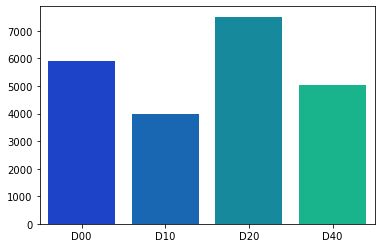

time: 116 ms


In [9]:
plot_damage_distributions(train_dicts)

0 : 669
1 : 454
2 : 868
3 : 583


[669, 454, 868, 583]

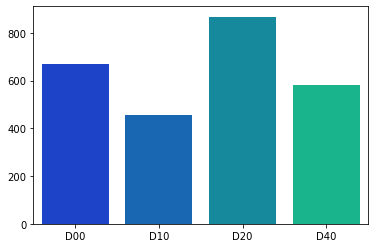

time: 99.7 ms


In [10]:
plot_damage_distributions(eval_dicts)

In [11]:
# Import dependencies
import torch
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from cv2 import imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode

import time
import datetime

time: 3.75 ms


# Data Preparation

In [12]:
model_type='x101'
OUTPUT_DIR = f'./{model_type}_output_aug'
OUTPUT_DIR

'./x101_output_aug'

time: 3.01 ms


In [13]:
def get_train_data():
    return train_dicts
def get_test_data():
    return test_dicts
def get_eval_data():
    return eval_dicts

time: 761 µs


In [14]:
# Register train dataset
DatasetCatalog.register("road_damage_train", get_train_data)
MetadataCatalog.get("road_damage_train").set(thing_classes=['D00', 'D10', 'D20', 'D40'])

DatasetCatalog.register("road_damage_eval", get_eval_data)
MetadataCatalog.get("road_damage_eval").set(thing_classes=['D00', 'D10', 'D20', 'D40'])

DatasetCatalog.register("road_damage_test1", get_test_data)
MetadataCatalog.get("road_damage_test1").set(thing_classes=['D00', 'D10', 'D20', 'D40'])

DatasetCatalog.register("road_damage_test2", get_test_data)
MetadataCatalog.get("road_damage_test2").set(thing_classes=['D00', 'D10', 'D20', 'D40'])

namespace(name='road_damage_test2', thing_classes=['D00', 'D10', 'D20', 'D40'])

time: 5.4 ms


In [15]:
from train_helper import configure_model
train_config = {
    'OUTPUT_DIR': OUTPUT_DIR,
    'base_config_file': "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", #'COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml', # X101 is more accurate but slow
    'base_weight_file': "detectron2://ImageNetPretrained/FAIR/X-101-32x8d.pkl", #'detectron2://ImageNetPretrained/MSRA/R-101.pkl', # X101 is more accurate but slow
    'max_iter': 70000,
    'num_gpus': 2,
    'ims_per_batch': 16,
    'learning_rate': 0.00025
}
cfg = configure_model(**train_config)

time: 23 ms


# Training
If you would like to continue the training process please increase the `max_iter` field in the previous cell, otherwise you can continue to run or safely skip the training cell. If you continue to run without changing `max_iter`, since we resume from previous epochs, so it will stop (it is not an error, just continue to evaluation part).

In [16]:
from trainer_with_augmentation import MyTrainerWithAugmentation

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainerWithAugmentation(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[11/16 16:21:13 d2.engine.defaults]: Auto-scaling the config to batch_size=8, learning_rate=0.000125, max_iter=140000, warmup=2000.
[11/16 16:21:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), st

[11/16 16:21:18 d2.data.build]: Removed 0 images with no usable annotations. 10974 images left.
[11/16 16:21:18 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    D00     | 5923         |    D10     | 3992         |    D20     | 7513         |
|    D40     | 5044         |            |              |            |              |
|   total    | 22472        |            |              |            |              |
[11/16 16:21:18 d2.data.common]: Serializing 10974 elements to byte tensors and concatenating them all ...
[11/16 16:21:18 d2.data.common]: Serialized dataset takes 3.32 MiB
[11/16 16:21:18 d2.data.build]: Using training sampler TrainingSampler
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: Remapping C2 weights ......
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.re

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv2.norm.running_var     loaded from res2_2_branch2b_bn_riv            of shape (256,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv2.norm.weight          loaded from res2_2_branch2b_bn_s              of shape (256,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv2.weight               loaded from res2_2_branch2b_w                 of shape (256, 8, 3, 3)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv3.norm.bias            loaded from res2_2_branch2c_bn_b              of shape (256,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv3.norm.running_mean    loaded from res2_2_branch2c_bn_rm             of shape (256,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res2.2.conv3.norm.running_var     loaded from res2_2_branch2c_bn_riv            of shape (256,)
[11/16 1

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv1.weight               loaded from res3_2_branch2a_w                 of shape (512, 512, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv2.norm.bias            loaded from res3_2_branch2b_bn_b              of shape (512,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv2.norm.running_mean    loaded from res3_2_branch2b_bn_rm             of shape (512,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv2.norm.running_var     loaded from res3_2_branch2b_bn_riv            of shape (512,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv2.norm.weight          loaded from res3_2_branch2b_bn_s              of shape (512,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res3.2.conv2.weight               loaded from res3_2_branch2b_w                 of shape (512, 16, 3, 

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv1.norm.running_mean    loaded from res4_1_branch2a_bn_rm             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv1.norm.running_var     loaded from res4_1_branch2a_bn_riv            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv1.norm.weight          loaded from res4_1_branch2a_bn_s              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv1.weight               loaded from res4_1_branch2a_w                 of shape (1024, 1024, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv2.norm.bias            loaded from res4_1_branch2b_bn_b              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.1.conv2.norm.running_mean    loaded from res4_1_branch2b_bn_rm             of shape (1024,)

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv1.norm.weight         loaded from res4_12_branch2a_bn_s             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv1.weight              loaded from res4_12_branch2a_w                of shape (1024, 1024, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv2.norm.bias           loaded from res4_12_branch2b_bn_b             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv2.norm.running_mean   loaded from res4_12_branch2b_bn_rm            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv2.norm.running_var    loaded from res4_12_branch2b_bn_riv           of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.12.conv2.norm.weight         loaded from res4_12_branch2b_bn_s             of shape (1024,)

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv2.norm.bias           loaded from res4_15_branch2b_bn_b             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv2.norm.running_mean   loaded from res4_15_branch2b_bn_rm            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv2.norm.running_var    loaded from res4_15_branch2b_bn_riv           of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv2.norm.weight         loaded from res4_15_branch2b_bn_s             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv2.weight              loaded from res4_15_branch2b_w                of shape (1024, 32, 3, 3)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.15.conv3.norm.bias           loaded from res4_15_branch2c_bn_b             of shape (1024,)
[

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv2.norm.running_var    loaded from res4_18_branch2b_bn_riv           of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv2.norm.weight         loaded from res4_18_branch2b_bn_s             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv2.weight              loaded from res4_18_branch2b_w                of shape (1024, 32, 3, 3)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv3.norm.bias           loaded from res4_18_branch2c_bn_b             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv3.norm.running_mean   loaded from res4_18_branch2c_bn_rm            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.18.conv3.norm.running_var    loaded from res4_18_branch2c_bn_riv           of shape (1024,)
[

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv2.weight              loaded from res4_20_branch2b_w                of shape (1024, 32, 3, 3)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv3.norm.bias           loaded from res4_20_branch2c_bn_b             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv3.norm.running_mean   loaded from res4_20_branch2c_bn_rm            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv3.norm.running_var    loaded from res4_20_branch2c_bn_riv           of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv3.norm.weight         loaded from res4_20_branch2c_bn_s             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.20.conv3.weight              loaded from res4_20_branch2c_w                of shape (1024, 10

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.3.conv3.norm.running_mean    loaded from res4_3_branch2c_bn_rm             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.3.conv3.norm.running_var     loaded from res4_3_branch2c_bn_riv            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.3.conv3.norm.weight          loaded from res4_3_branch2c_bn_s              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.3.conv3.weight               loaded from res4_3_branch2c_w                 of shape (1024, 1024, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.4.conv1.norm.bias            loaded from res4_4_branch2a_bn_b              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.4.conv1.norm.running_mean    loaded from res4_4_branch2a_bn_rm             of shape (1024,)

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.6.conv3.norm.weight          loaded from res4_6_branch2c_bn_s              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.6.conv3.weight               loaded from res4_6_branch2c_w                 of shape (1024, 1024, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.7.conv1.norm.bias            loaded from res4_7_branch2a_bn_b              of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.7.conv1.norm.running_mean    loaded from res4_7_branch2a_bn_rm             of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.7.conv1.norm.running_var     loaded from res4_7_branch2a_bn_riv            of shape (1024,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res4.7.conv1.norm.weight          loaded from res4_7_branch2a_bn_s              of shape (1024,)

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv1.norm.bias            loaded from res5_0_branch2a_bn_b              of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv1.norm.running_mean    loaded from res5_0_branch2a_bn_rm             of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv1.norm.running_var     loaded from res5_0_branch2a_bn_riv            of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv1.norm.weight          loaded from res5_0_branch2a_bn_s              of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv1.weight               loaded from res5_0_branch2a_w                 of shape (2048, 1024, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.0.conv2.norm.bias            loaded from res5_0_branch2b_bn_b              of shape (2048,)

[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.2.conv3.norm.running_var     loaded from res5_2_branch2c_bn_riv            of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.2.conv3.norm.weight          loaded from res5_2_branch2c_bn_s              of shape (2048,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.res5.2.conv3.weight               loaded from res5_2_branch2c_w                 of shape (2048, 2048, 1, 1)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.stem.conv1.norm.bias              loaded from res_conv1_bn_b                    of shape (64,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.stem.conv1.norm.running_mean      loaded from res_conv1_bn_rm                   of shape (64,)
[11/16 16:21:19 d2.checkpoint.c2_model_loading]: backbone.bottom_up.stem.conv1.norm.running_var       loaded from res_conv1_bn_riv                  of shape (64,)
[11/1

[11/16 16:35:23 d2.utils.events]:  eta: 2 days, 21:11:19  iter: 479  total_loss: 1.074  loss_cls: 0.070  loss_box_reg: 0.028  loss_rpn_cls: 0.667  loss_rpn_loc: 0.311  time: 1.7497  data_time: 0.0169  lr: 0.000030  max_mem: 13170M
[11/16 16:35:58 d2.utils.events]:  eta: 2 days, 21:11:45  iter: 499  total_loss: 1.093  loss_cls: 0.076  loss_box_reg: 0.040  loss_rpn_cls: 0.667  loss_rpn_loc: 0.306  time: 1.7499  data_time: 0.0165  lr: 0.000031  max_mem: 13170M
[11/16 16:36:34 d2.utils.events]:  eta: 2 days, 21:12:34  iter: 519  total_loss: 1.050  loss_cls: 0.061  loss_box_reg: 0.026  loss_rpn_cls: 0.667  loss_rpn_loc: 0.287  time: 1.7516  data_time: 0.0173  lr: 0.000033  max_mem: 13170M
[11/16 16:37:09 d2.utils.events]:  eta: 2 days, 21:13:55  iter: 539  total_loss: 1.089  loss_cls: 0.063  loss_box_reg: 0.026  loss_rpn_cls: 0.663  loss_rpn_loc: 0.310  time: 1.7526  data_time: 0.0176  lr: 0.000034  max_mem: 13170M
[11/16 16:37:45 d2.utils.events]:  eta: 2 days, 21:14:53  iter: 559  total_l

[11/16 16:56:03 d2.utils.events]:  eta: 2 days, 21:28:23  iter: 1179  total_loss: 0.945  loss_cls: 0.048  loss_box_reg: 0.018  loss_rpn_cls: 0.552  loss_rpn_loc: 0.301  time: 1.7619  data_time: 0.0165  lr: 0.000074  max_mem: 13170M
[11/16 16:56:39 d2.utils.events]:  eta: 2 days, 21:30:18  iter: 1199  total_loss: 0.919  loss_cls: 0.057  loss_box_reg: 0.028  loss_rpn_cls: 0.538  loss_rpn_loc: 0.303  time: 1.7626  data_time: 0.0170  lr: 0.000075  max_mem: 13170M
[11/16 16:57:14 d2.utils.events]:  eta: 2 days, 21:30:52  iter: 1219  total_loss: 0.888  loss_cls: 0.049  loss_box_reg: 0.021  loss_rpn_cls: 0.542  loss_rpn_loc: 0.281  time: 1.7626  data_time: 0.0173  lr: 0.000076  max_mem: 13170M
[11/16 16:57:50 d2.utils.events]:  eta: 2 days, 21:31:52  iter: 1239  total_loss: 0.925  loss_cls: 0.053  loss_box_reg: 0.022  loss_rpn_cls: 0.536  loss_rpn_loc: 0.283  time: 1.7633  data_time: 0.0182  lr: 0.000077  max_mem: 13170M
[11/16 16:58:26 d2.utils.events]:  eta: 2 days, 21:32:23  iter: 1259  to

[11/16 17:16:20 d2.utils.events]:  eta: 2 days, 21:48:06  iter: 1859  total_loss: 0.745  loss_cls: 0.115  loss_box_reg: 0.084  loss_rpn_cls: 0.272  loss_rpn_loc: 0.258  time: 1.7720  data_time: 0.0158  lr: 0.000116  max_mem: 13170M
[11/16 17:16:55 d2.utils.events]:  eta: 2 days, 21:47:28  iter: 1879  total_loss: 0.736  loss_cls: 0.113  loss_box_reg: 0.097  loss_rpn_cls: 0.275  loss_rpn_loc: 0.250  time: 1.7720  data_time: 0.0154  lr: 0.000117  max_mem: 13170M
[11/16 17:17:31 d2.utils.events]:  eta: 2 days, 21:46:28  iter: 1899  total_loss: 0.758  loss_cls: 0.131  loss_box_reg: 0.089  loss_rpn_cls: 0.272  loss_rpn_loc: 0.270  time: 1.7721  data_time: 0.0164  lr: 0.000119  max_mem: 13170M
[11/16 17:18:06 d2.utils.events]:  eta: 2 days, 21:45:12  iter: 1919  total_loss: 0.758  loss_cls: 0.131  loss_box_reg: 0.098  loss_rpn_cls: 0.271  loss_rpn_loc: 0.260  time: 1.7721  data_time: 0.0179  lr: 0.000120  max_mem: 13170M
[11/16 17:18:41 d2.utils.events]:  eta: 2 days, 21:43:22  iter: 1939  to

[11/16 17:36:17 d2.utils.events]:  eta: 2 days, 20:34:35  iter: 2539  total_loss: 0.794  loss_cls: 0.162  loss_box_reg: 0.140  loss_rpn_cls: 0.210  loss_rpn_loc: 0.265  time: 1.7688  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/16 17:36:52 d2.utils.events]:  eta: 2 days, 20:32:51  iter: 2559  total_loss: 0.833  loss_cls: 0.159  loss_box_reg: 0.156  loss_rpn_cls: 0.209  loss_rpn_loc: 0.255  time: 1.7687  data_time: 0.0155  lr: 0.000125  max_mem: 13170M
[11/16 17:37:27 d2.utils.events]:  eta: 2 days, 20:30:38  iter: 2579  total_loss: 0.793  loss_cls: 0.163  loss_box_reg: 0.153  loss_rpn_cls: 0.209  loss_rpn_loc: 0.265  time: 1.7685  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/16 17:38:02 d2.utils.events]:  eta: 2 days, 20:29:28  iter: 2599  total_loss: 0.794  loss_cls: 0.171  loss_box_reg: 0.153  loss_rpn_cls: 0.197  loss_rpn_loc: 0.261  time: 1.7684  data_time: 0.0177  lr: 0.000125  max_mem: 13170M
[11/16 17:38:37 d2.utils.events]:  eta: 2 days, 20:28:12  iter: 2619  to

[11/16 17:56:12 d2.utils.events]:  eta: 2 days, 20:04:33  iter: 3219  total_loss: 0.772  loss_cls: 0.187  loss_box_reg: 0.182  loss_rpn_cls: 0.170  loss_rpn_loc: 0.237  time: 1.7662  data_time: 0.0154  lr: 0.000125  max_mem: 13170M
[11/16 17:56:47 d2.utils.events]:  eta: 2 days, 20:03:29  iter: 3239  total_loss: 0.799  loss_cls: 0.190  loss_box_reg: 0.193  loss_rpn_cls: 0.177  loss_rpn_loc: 0.256  time: 1.7661  data_time: 0.0160  lr: 0.000125  max_mem: 13170M
[11/16 17:57:22 d2.utils.events]:  eta: 2 days, 20:02:59  iter: 3259  total_loss: 0.820  loss_cls: 0.190  loss_box_reg: 0.183  loss_rpn_cls: 0.193  loss_rpn_loc: 0.256  time: 1.7660  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/16 17:57:57 d2.utils.events]:  eta: 2 days, 20:02:29  iter: 3279  total_loss: 0.780  loss_cls: 0.176  loss_box_reg: 0.175  loss_rpn_cls: 0.184  loss_rpn_loc: 0.252  time: 1.7659  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/16 17:58:32 d2.utils.events]:  eta: 2 days, 20:02:17  iter: 3299  to

[11/16 18:16:06 d2.utils.events]:  eta: 2 days, 19:50:42  iter: 3899  total_loss: 0.791  loss_cls: 0.187  loss_box_reg: 0.201  loss_rpn_cls: 0.148  loss_rpn_loc: 0.239  time: 1.7641  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/16 18:16:41 d2.utils.events]:  eta: 2 days, 19:49:59  iter: 3919  total_loss: 0.824  loss_cls: 0.201  loss_box_reg: 0.214  loss_rpn_cls: 0.156  loss_rpn_loc: 0.228  time: 1.7640  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/16 18:17:16 d2.utils.events]:  eta: 2 days, 19:49:30  iter: 3939  total_loss: 0.767  loss_cls: 0.186  loss_box_reg: 0.186  loss_rpn_cls: 0.170  loss_rpn_loc: 0.240  time: 1.7640  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/16 18:17:51 d2.utils.events]:  eta: 2 days, 19:48:57  iter: 3959  total_loss: 0.798  loss_cls: 0.189  loss_box_reg: 0.205  loss_rpn_cls: 0.169  loss_rpn_loc: 0.259  time: 1.7641  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/16 18:18:27 d2.utils.events]:  eta: 2 days, 19:48:29  iter: 3979  to

[11/16 18:36:03 d2.utils.events]:  eta: 2 days, 19:30:36  iter: 4579  total_loss: 0.779  loss_cls: 0.180  loss_box_reg: 0.186  loss_rpn_cls: 0.165  loss_rpn_loc: 0.232  time: 1.7635  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/16 18:36:38 d2.utils.events]:  eta: 2 days, 19:30:06  iter: 4599  total_loss: 0.822  loss_cls: 0.218  loss_box_reg: 0.216  loss_rpn_cls: 0.146  loss_rpn_loc: 0.228  time: 1.7634  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/16 18:37:13 d2.utils.events]:  eta: 2 days, 19:29:38  iter: 4619  total_loss: 0.805  loss_cls: 0.196  loss_box_reg: 0.201  loss_rpn_cls: 0.134  loss_rpn_loc: 0.218  time: 1.7634  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/16 18:37:48 d2.utils.events]:  eta: 2 days, 19:28:58  iter: 4639  total_loss: 0.800  loss_cls: 0.203  loss_box_reg: 0.213  loss_rpn_cls: 0.155  loss_rpn_loc: 0.238  time: 1.7634  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/16 18:38:23 d2.utils.events]:  eta: 2 days, 19:28:34  iter: 4659  to

[11/16 18:55:59 d2.utils.events]:  eta: 2 days, 19:08:26  iter: 5259  total_loss: 0.749  loss_cls: 0.172  loss_box_reg: 0.193  loss_rpn_cls: 0.149  loss_rpn_loc: 0.227  time: 1.7625  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/16 18:56:34 d2.utils.events]:  eta: 2 days, 19:07:52  iter: 5279  total_loss: 0.787  loss_cls: 0.203  loss_box_reg: 0.204  loss_rpn_cls: 0.134  loss_rpn_loc: 0.222  time: 1.7625  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/16 18:57:09 d2.utils.events]:  eta: 2 days, 19:07:37  iter: 5299  total_loss: 0.780  loss_cls: 0.197  loss_box_reg: 0.227  loss_rpn_cls: 0.139  loss_rpn_loc: 0.230  time: 1.7625  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/16 18:57:45 d2.utils.events]:  eta: 2 days, 19:07:04  iter: 5319  total_loss: 0.773  loss_cls: 0.206  loss_box_reg: 0.216  loss_rpn_cls: 0.135  loss_rpn_loc: 0.209  time: 1.7626  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/16 18:58:21 d2.utils.events]:  eta: 2 days, 19:06:35  iter: 5339  to

[11/16 19:15:54 d2.utils.events]:  eta: 2 days, 18:47:28  iter: 5939  total_loss: 0.757  loss_cls: 0.200  loss_box_reg: 0.219  loss_rpn_cls: 0.120  loss_rpn_loc: 0.205  time: 1.7618  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 19:16:30 d2.utils.events]:  eta: 2 days, 18:47:30  iter: 5959  total_loss: 0.781  loss_cls: 0.193  loss_box_reg: 0.199  loss_rpn_cls: 0.146  loss_rpn_loc: 0.236  time: 1.7619  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/16 19:17:05 d2.utils.events]:  eta: 2 days, 18:46:45  iter: 5979  total_loss: 0.789  loss_cls: 0.212  loss_box_reg: 0.220  loss_rpn_cls: 0.130  loss_rpn_loc: 0.237  time: 1.7619  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/16 19:17:39 d2.utils.events]:  eta: 2 days, 18:45:38  iter: 5999  total_loss: 0.788  loss_cls: 0.203  loss_box_reg: 0.217  loss_rpn_cls: 0.133  loss_rpn_loc: 0.214  time: 1.7618  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/16 19:18:15 d2.utils.events]:  eta: 2 days, 18:45:41  iter: 6019  to

[11/16 19:35:50 d2.utils.events]:  eta: 2 days, 18:26:47  iter: 6619  total_loss: 0.739  loss_cls: 0.192  loss_box_reg: 0.206  loss_rpn_cls: 0.127  loss_rpn_loc: 0.201  time: 1.7614  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 19:36:25 d2.utils.events]:  eta: 2 days, 18:26:14  iter: 6639  total_loss: 0.811  loss_cls: 0.213  loss_box_reg: 0.234  loss_rpn_cls: 0.139  loss_rpn_loc: 0.220  time: 1.7614  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/16 19:37:00 d2.utils.events]:  eta: 2 days, 18:25:27  iter: 6659  total_loss: 0.733  loss_cls: 0.198  loss_box_reg: 0.196  loss_rpn_cls: 0.127  loss_rpn_loc: 0.204  time: 1.7614  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/16 19:37:36 d2.utils.events]:  eta: 2 days, 18:24:22  iter: 6679  total_loss: 0.764  loss_cls: 0.212  loss_box_reg: 0.219  loss_rpn_cls: 0.116  loss_rpn_loc: 0.217  time: 1.7615  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/16 19:38:11 d2.utils.events]:  eta: 2 days, 18:24:13  iter: 6699  to

[11/16 19:55:46 d2.utils.events]:  eta: 2 days, 18:05:10  iter: 7299  total_loss: 0.779  loss_cls: 0.193  loss_box_reg: 0.230  loss_rpn_cls: 0.137  loss_rpn_loc: 0.217  time: 1.7612  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/16 19:56:22 d2.utils.events]:  eta: 2 days, 18:04:24  iter: 7319  total_loss: 0.728  loss_cls: 0.186  loss_box_reg: 0.198  loss_rpn_cls: 0.120  loss_rpn_loc: 0.209  time: 1.7612  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/16 19:56:57 d2.utils.events]:  eta: 2 days, 18:03:55  iter: 7339  total_loss: 0.763  loss_cls: 0.190  loss_box_reg: 0.211  loss_rpn_cls: 0.123  loss_rpn_loc: 0.228  time: 1.7612  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 19:57:32 d2.utils.events]:  eta: 2 days, 18:03:19  iter: 7359  total_loss: 0.750  loss_cls: 0.209  loss_box_reg: 0.219  loss_rpn_cls: 0.133  loss_rpn_loc: 0.202  time: 1.7612  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/16 19:58:07 d2.utils.events]:  eta: 2 days, 18:02:45  iter: 7379  to

[11/16 20:15:37 d2.utils.events]:  eta: 2 days, 17:43:08  iter: 7979  total_loss: 0.735  loss_cls: 0.202  loss_box_reg: 0.211  loss_rpn_cls: 0.114  loss_rpn_loc: 0.179  time: 1.7603  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/16 20:16:12 d2.utils.events]:  eta: 2 days, 17:42:28  iter: 7999  total_loss: 0.758  loss_cls: 0.213  loss_box_reg: 0.231  loss_rpn_cls: 0.119  loss_rpn_loc: 0.201  time: 1.7602  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/16 20:16:47 d2.utils.events]:  eta: 2 days, 17:41:37  iter: 8019  total_loss: 0.784  loss_cls: 0.205  loss_box_reg: 0.219  loss_rpn_cls: 0.120  loss_rpn_loc: 0.211  time: 1.7602  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/16 20:17:23 d2.utils.events]:  eta: 2 days, 17:41:17  iter: 8039  total_loss: 0.730  loss_cls: 0.191  loss_box_reg: 0.213  loss_rpn_cls: 0.117  loss_rpn_loc: 0.211  time: 1.7603  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 20:17:57 d2.utils.events]:  eta: 2 days, 17:40:30  iter: 8059  to

[11/16 20:35:35 d2.utils.events]:  eta: 2 days, 17:23:26  iter: 8659  total_loss: 0.734  loss_cls: 0.208  loss_box_reg: 0.221  loss_rpn_cls: 0.113  loss_rpn_loc: 0.190  time: 1.7603  data_time: 0.0158  lr: 0.000125  max_mem: 13170M
[11/16 20:36:10 d2.utils.events]:  eta: 2 days, 17:22:53  iter: 8679  total_loss: 0.732  loss_cls: 0.208  loss_box_reg: 0.217  loss_rpn_cls: 0.114  loss_rpn_loc: 0.202  time: 1.7603  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 20:36:46 d2.utils.events]:  eta: 2 days, 17:22:23  iter: 8699  total_loss: 0.763  loss_cls: 0.201  loss_box_reg: 0.222  loss_rpn_cls: 0.114  loss_rpn_loc: 0.213  time: 1.7603  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/16 20:37:21 d2.utils.events]:  eta: 2 days, 17:21:42  iter: 8719  total_loss: 0.697  loss_cls: 0.179  loss_box_reg: 0.195  loss_rpn_cls: 0.107  loss_rpn_loc: 0.189  time: 1.7603  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/16 20:37:56 d2.utils.events]:  eta: 2 days, 17:21:11  iter: 8739  to

[11/16 20:55:25 d2.utils.events]:  eta: 2 days, 17:01:02  iter: 9339  total_loss: 0.719  loss_cls: 0.191  loss_box_reg: 0.229  loss_rpn_cls: 0.092  loss_rpn_loc: 0.195  time: 1.7596  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/16 20:56:01 d2.utils.events]:  eta: 2 days, 17:00:16  iter: 9359  total_loss: 0.736  loss_cls: 0.195  loss_box_reg: 0.223  loss_rpn_cls: 0.101  loss_rpn_loc: 0.185  time: 1.7596  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/16 20:56:36 d2.utils.events]:  eta: 2 days, 16:59:46  iter: 9379  total_loss: 0.691  loss_cls: 0.185  loss_box_reg: 0.201  loss_rpn_cls: 0.099  loss_rpn_loc: 0.188  time: 1.7596  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 20:57:10 d2.utils.events]:  eta: 2 days, 16:58:59  iter: 9399  total_loss: 0.715  loss_cls: 0.193  loss_box_reg: 0.212  loss_rpn_cls: 0.118  loss_rpn_loc: 0.170  time: 1.7595  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/16 20:57:46 d2.utils.events]:  eta: 2 days, 16:58:48  iter: 9419  to

[11/16 21:14:51 d2.data.common]: Serializing 1221 elements to byte tensors and concatenating them all ...
[11/16 21:14:51 d2.data.common]: Serialized dataset takes 0.37 MiB
[11/16 21:14:51 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/16 21:14:51 d2.evaluation.evaluator]: Start inference on 1221 images
[11/16 21:14:53 d2.evaluation.evaluator]: Inference done 11/1221. 0.0873 s / img. ETA=0:01:46
[11/16 21:14:58 d2.evaluation.evaluator]: Inference done 68/1221. 0.0870 s / img. ETA=0:01:41
[11/16 21:15:03 d2.evaluation.evaluator]: Inference done 126/1221. 0.0866 s / img. ETA=0:01:35
[11/16 21:15:08 d2.evaluation.evaluator]: Inference done 184/1221. 0.0863 s / img. ETA=0:01:30
[11/16 21:15:13 d2.evaluation.evaluator]: Inference done 242/1221. 0.0861 s / img. ETA=0:01:25
[11/16 21:15:18 d2.evaluation.evaluator]: Inference done 300/1221. 0.0860 s / img. ETA=0:01:20
[11/16 21:15:23 d2.evalu

[11/16 21:29:34 d2.utils.events]:  eta: 2 days, 16:33:55  iter: 10439  total_loss: 0.737  loss_cls: 0.197  loss_box_reg: 0.217  loss_rpn_cls: 0.120  loss_rpn_loc: 0.200  time: 1.7599  data_time: 0.0131  lr: 0.000125  max_mem: 13170M
[11/16 21:30:09 d2.utils.events]:  eta: 2 days, 16:33:42  iter: 10459  total_loss: 0.706  loss_cls: 0.192  loss_box_reg: 0.206  loss_rpn_cls: 0.106  loss_rpn_loc: 0.178  time: 1.7599  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/16 21:30:44 d2.utils.events]:  eta: 2 days, 16:33:20  iter: 10479  total_loss: 0.705  loss_cls: 0.201  loss_box_reg: 0.224  loss_rpn_cls: 0.098  loss_rpn_loc: 0.180  time: 1.7599  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/16 21:31:20 d2.utils.events]:  eta: 2 days, 16:32:44  iter: 10499  total_loss: 0.688  loss_cls: 0.194  loss_box_reg: 0.213  loss_rpn_cls: 0.089  loss_rpn_loc: 0.184  time: 1.7599  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/16 21:31:54 d2.utils.events]:  eta: 2 days, 16:32:08  iter: 1051

[11/16 21:49:30 d2.utils.events]:  eta: 2 days, 16:14:44  iter: 11119  total_loss: 0.697  loss_cls: 0.190  loss_box_reg: 0.217  loss_rpn_cls: 0.088  loss_rpn_loc: 0.187  time: 1.7598  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/16 21:50:05 d2.utils.events]:  eta: 2 days, 16:14:34  iter: 11139  total_loss: 0.674  loss_cls: 0.188  loss_box_reg: 0.211  loss_rpn_cls: 0.088  loss_rpn_loc: 0.187  time: 1.7598  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/16 21:50:40 d2.utils.events]:  eta: 2 days, 16:14:04  iter: 11159  total_loss: 0.704  loss_cls: 0.200  loss_box_reg: 0.227  loss_rpn_cls: 0.096  loss_rpn_loc: 0.184  time: 1.7598  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/16 21:51:15 d2.utils.events]:  eta: 2 days, 16:13:30  iter: 11179  total_loss: 0.683  loss_cls: 0.193  loss_box_reg: 0.218  loss_rpn_cls: 0.087  loss_rpn_loc: 0.181  time: 1.7598  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 21:51:50 d2.utils.events]:  eta: 2 days, 16:12:49  iter: 1119

[11/16 22:09:22 d2.utils.events]:  eta: 2 days, 15:52:41  iter: 11799  total_loss: 0.692  loss_cls: 0.199  loss_box_reg: 0.215  loss_rpn_cls: 0.100  loss_rpn_loc: 0.180  time: 1.7594  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 22:09:58 d2.utils.events]:  eta: 2 days, 15:52:32  iter: 11819  total_loss: 0.712  loss_cls: 0.209  loss_box_reg: 0.239  loss_rpn_cls: 0.090  loss_rpn_loc: 0.187  time: 1.7595  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/16 22:10:34 d2.utils.events]:  eta: 2 days, 15:51:58  iter: 11839  total_loss: 0.708  loss_cls: 0.194  loss_box_reg: 0.218  loss_rpn_cls: 0.087  loss_rpn_loc: 0.205  time: 1.7595  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 22:11:09 d2.utils.events]:  eta: 2 days, 15:51:22  iter: 11859  total_loss: 0.740  loss_cls: 0.209  loss_box_reg: 0.244  loss_rpn_cls: 0.107  loss_rpn_loc: 0.189  time: 1.7595  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/16 22:11:44 d2.utils.events]:  eta: 2 days, 15:50:48  iter: 1187

[11/16 22:29:19 d2.utils.events]:  eta: 2 days, 15:34:57  iter: 12479  total_loss: 0.732  loss_cls: 0.196  loss_box_reg: 0.215  loss_rpn_cls: 0.096  loss_rpn_loc: 0.192  time: 1.7594  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 22:29:55 d2.utils.events]:  eta: 2 days, 15:34:32  iter: 12499  total_loss: 0.734  loss_cls: 0.206  loss_box_reg: 0.233  loss_rpn_cls: 0.094  loss_rpn_loc: 0.183  time: 1.7594  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/16 22:30:30 d2.utils.events]:  eta: 2 days, 15:33:58  iter: 12519  total_loss: 0.669  loss_cls: 0.175  loss_box_reg: 0.205  loss_rpn_cls: 0.108  loss_rpn_loc: 0.187  time: 1.7595  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/16 22:31:05 d2.utils.events]:  eta: 2 days, 15:33:42  iter: 12539  total_loss: 0.691  loss_cls: 0.182  loss_box_reg: 0.214  loss_rpn_cls: 0.099  loss_rpn_loc: 0.168  time: 1.7595  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/16 22:31:41 d2.utils.events]:  eta: 2 days, 15:33:29  iter: 1255

[11/16 22:49:16 d2.utils.events]:  eta: 2 days, 15:13:59  iter: 13159  total_loss: 0.718  loss_cls: 0.206  loss_box_reg: 0.235  loss_rpn_cls: 0.097  loss_rpn_loc: 0.180  time: 1.7594  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/16 22:49:51 d2.utils.events]:  eta: 2 days, 15:13:27  iter: 13179  total_loss: 0.768  loss_cls: 0.210  loss_box_reg: 0.237  loss_rpn_cls: 0.104  loss_rpn_loc: 0.189  time: 1.7594  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/16 22:50:27 d2.utils.events]:  eta: 2 days, 15:12:48  iter: 13199  total_loss: 0.666  loss_cls: 0.177  loss_box_reg: 0.207  loss_rpn_cls: 0.103  loss_rpn_loc: 0.175  time: 1.7594  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/16 22:51:02 d2.utils.events]:  eta: 2 days, 15:12:14  iter: 13219  total_loss: 0.722  loss_cls: 0.201  loss_box_reg: 0.234  loss_rpn_cls: 0.085  loss_rpn_loc: 0.188  time: 1.7594  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/16 22:51:38 d2.utils.events]:  eta: 2 days, 15:11:27  iter: 1323

[11/16 23:09:13 d2.utils.events]:  eta: 2 days, 14:50:01  iter: 13839  total_loss: 0.726  loss_cls: 0.218  loss_box_reg: 0.229  loss_rpn_cls: 0.092  loss_rpn_loc: 0.180  time: 1.7594  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/16 23:09:48 d2.utils.events]:  eta: 2 days, 14:49:36  iter: 13859  total_loss: 0.683  loss_cls: 0.185  loss_box_reg: 0.209  loss_rpn_cls: 0.098  loss_rpn_loc: 0.179  time: 1.7594  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/16 23:10:23 d2.utils.events]:  eta: 2 days, 14:49:10  iter: 13879  total_loss: 0.766  loss_cls: 0.218  loss_box_reg: 0.262  loss_rpn_cls: 0.082  loss_rpn_loc: 0.187  time: 1.7594  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/16 23:10:57 d2.utils.events]:  eta: 2 days, 14:48:34  iter: 13899  total_loss: 0.681  loss_cls: 0.211  loss_box_reg: 0.229  loss_rpn_cls: 0.095  loss_rpn_loc: 0.184  time: 1.7593  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/16 23:11:32 d2.utils.events]:  eta: 2 days, 14:47:24  iter: 1391

[11/16 23:29:09 d2.utils.events]:  eta: 2 days, 14:29:06  iter: 14519  total_loss: 0.686  loss_cls: 0.203  loss_box_reg: 0.230  loss_rpn_cls: 0.089  loss_rpn_loc: 0.200  time: 1.7593  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/16 23:29:44 d2.utils.events]:  eta: 2 days, 14:28:32  iter: 14539  total_loss: 0.690  loss_cls: 0.194  loss_box_reg: 0.225  loss_rpn_cls: 0.092  loss_rpn_loc: 0.184  time: 1.7593  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/16 23:30:20 d2.utils.events]:  eta: 2 days, 14:28:05  iter: 14559  total_loss: 0.661  loss_cls: 0.192  loss_box_reg: 0.209  loss_rpn_cls: 0.090  loss_rpn_loc: 0.156  time: 1.7594  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/16 23:30:55 d2.utils.events]:  eta: 2 days, 14:27:45  iter: 14579  total_loss: 0.667  loss_cls: 0.194  loss_box_reg: 0.221  loss_rpn_cls: 0.089  loss_rpn_loc: 0.166  time: 1.7594  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/16 23:31:30 d2.utils.events]:  eta: 2 days, 14:27:20  iter: 1459

[11/16 23:49:09 d2.utils.events]:  eta: 2 days, 14:09:59  iter: 15199  total_loss: 0.742  loss_cls: 0.224  loss_box_reg: 0.226  loss_rpn_cls: 0.092  loss_rpn_loc: 0.176  time: 1.7595  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/16 23:49:44 d2.utils.events]:  eta: 2 days, 14:09:27  iter: 15219  total_loss: 0.694  loss_cls: 0.192  loss_box_reg: 0.206  loss_rpn_cls: 0.080  loss_rpn_loc: 0.187  time: 1.7595  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/16 23:50:20 d2.utils.events]:  eta: 2 days, 14:08:59  iter: 15239  total_loss: 0.707  loss_cls: 0.191  loss_box_reg: 0.207  loss_rpn_cls: 0.111  loss_rpn_loc: 0.184  time: 1.7595  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/16 23:50:56 d2.utils.events]:  eta: 2 days, 14:08:24  iter: 15259  total_loss: 0.672  loss_cls: 0.196  loss_box_reg: 0.221  loss_rpn_cls: 0.093  loss_rpn_loc: 0.173  time: 1.7595  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/16 23:51:31 d2.utils.events]:  eta: 2 days, 14:07:45  iter: 1527

[11/17 00:09:08 d2.utils.events]:  eta: 2 days, 13:52:20  iter: 15879  total_loss: 0.735  loss_cls: 0.201  loss_box_reg: 0.227  loss_rpn_cls: 0.091  loss_rpn_loc: 0.183  time: 1.7596  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 00:09:43 d2.utils.events]:  eta: 2 days, 13:51:23  iter: 15899  total_loss: 0.657  loss_cls: 0.181  loss_box_reg: 0.220  loss_rpn_cls: 0.079  loss_rpn_loc: 0.173  time: 1.7596  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 00:10:18 d2.utils.events]:  eta: 2 days, 13:50:47  iter: 15919  total_loss: 0.702  loss_cls: 0.208  loss_box_reg: 0.236  loss_rpn_cls: 0.082  loss_rpn_loc: 0.182  time: 1.7596  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 00:10:54 d2.utils.events]:  eta: 2 days, 13:50:13  iter: 15939  total_loss: 0.747  loss_cls: 0.213  loss_box_reg: 0.235  loss_rpn_cls: 0.099  loss_rpn_loc: 0.176  time: 1.7596  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 00:11:29 d2.utils.events]:  eta: 2 days, 13:49:57  iter: 1595

[11/17 00:29:03 d2.utils.events]:  eta: 2 days, 13:27:57  iter: 16559  total_loss: 0.690  loss_cls: 0.197  loss_box_reg: 0.210  loss_rpn_cls: 0.086  loss_rpn_loc: 0.176  time: 1.7595  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 00:29:38 d2.utils.events]:  eta: 2 days, 13:27:05  iter: 16579  total_loss: 0.652  loss_cls: 0.180  loss_box_reg: 0.218  loss_rpn_cls: 0.071  loss_rpn_loc: 0.184  time: 1.7595  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 00:30:14 d2.utils.events]:  eta: 2 days, 13:26:18  iter: 16599  total_loss: 0.724  loss_cls: 0.215  loss_box_reg: 0.237  loss_rpn_cls: 0.096  loss_rpn_loc: 0.182  time: 1.7595  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 00:30:48 d2.utils.events]:  eta: 2 days, 13:25:37  iter: 16619  total_loss: 0.705  loss_cls: 0.204  loss_box_reg: 0.225  loss_rpn_cls: 0.086  loss_rpn_loc: 0.168  time: 1.7594  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 00:31:23 d2.utils.events]:  eta: 2 days, 13:25:17  iter: 1663

[11/17 00:49:00 d2.utils.events]:  eta: 2 days, 13:09:16  iter: 17239  total_loss: 0.664  loss_cls: 0.199  loss_box_reg: 0.219  loss_rpn_cls: 0.079  loss_rpn_loc: 0.174  time: 1.7595  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 00:49:35 d2.utils.events]:  eta: 2 days, 13:08:47  iter: 17259  total_loss: 0.744  loss_cls: 0.206  loss_box_reg: 0.236  loss_rpn_cls: 0.092  loss_rpn_loc: 0.185  time: 1.7594  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 00:50:10 d2.utils.events]:  eta: 2 days, 13:08:36  iter: 17279  total_loss: 0.703  loss_cls: 0.181  loss_box_reg: 0.216  loss_rpn_cls: 0.093  loss_rpn_loc: 0.181  time: 1.7594  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 00:50:45 d2.utils.events]:  eta: 2 days, 13:07:50  iter: 17299  total_loss: 0.672  loss_cls: 0.200  loss_box_reg: 0.219  loss_rpn_cls: 0.097  loss_rpn_loc: 0.158  time: 1.7594  data_time: 0.0130  lr: 0.000125  max_mem: 13170M
[11/17 00:51:19 d2.utils.events]:  eta: 2 days, 13:07:10  iter: 1731

[11/17 01:08:58 d2.utils.events]:  eta: 2 days, 12:47:37  iter: 17919  total_loss: 0.694  loss_cls: 0.208  loss_box_reg: 0.229  loss_rpn_cls: 0.088  loss_rpn_loc: 0.169  time: 1.7595  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 01:09:34 d2.utils.events]:  eta: 2 days, 12:46:59  iter: 17939  total_loss: 0.682  loss_cls: 0.194  loss_box_reg: 0.219  loss_rpn_cls: 0.087  loss_rpn_loc: 0.161  time: 1.7596  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/17 01:10:10 d2.utils.events]:  eta: 2 days, 12:46:38  iter: 17959  total_loss: 0.660  loss_cls: 0.194  loss_box_reg: 0.223  loss_rpn_cls: 0.073  loss_rpn_loc: 0.177  time: 1.7596  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 01:10:45 d2.utils.events]:  eta: 2 days, 12:45:47  iter: 17979  total_loss: 0.682  loss_cls: 0.190  loss_box_reg: 0.215  loss_rpn_cls: 0.075  loss_rpn_loc: 0.176  time: 1.7596  data_time: 0.0131  lr: 0.000125  max_mem: 13170M
[11/17 01:11:20 d2.utils.events]:  eta: 2 days, 12:45:11  iter: 1799

[11/17 01:28:56 d2.utils.events]:  eta: 2 days, 12:24:12  iter: 18599  total_loss: 0.663  loss_cls: 0.185  loss_box_reg: 0.216  loss_rpn_cls: 0.080  loss_rpn_loc: 0.177  time: 1.7596  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 01:29:30 d2.utils.events]:  eta: 2 days, 12:23:39  iter: 18619  total_loss: 0.715  loss_cls: 0.204  loss_box_reg: 0.231  loss_rpn_cls: 0.088  loss_rpn_loc: 0.183  time: 1.7595  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 01:30:06 d2.utils.events]:  eta: 2 days, 12:23:04  iter: 18639  total_loss: 0.674  loss_cls: 0.187  loss_box_reg: 0.217  loss_rpn_cls: 0.080  loss_rpn_loc: 0.169  time: 1.7595  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 01:30:41 d2.utils.events]:  eta: 2 days, 12:22:42  iter: 18659  total_loss: 0.664  loss_cls: 0.178  loss_box_reg: 0.213  loss_rpn_cls: 0.082  loss_rpn_loc: 0.168  time: 1.7596  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 01:31:16 d2.utils.events]:  eta: 2 days, 12:21:59  iter: 1867

[11/17 01:48:51 d2.utils.events]:  eta: 2 days, 12:01:51  iter: 19279  total_loss: 0.690  loss_cls: 0.206  loss_box_reg: 0.233  loss_rpn_cls: 0.085  loss_rpn_loc: 0.157  time: 1.7595  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 01:49:26 d2.utils.events]:  eta: 2 days, 12:01:20  iter: 19299  total_loss: 0.675  loss_cls: 0.212  loss_box_reg: 0.228  loss_rpn_cls: 0.070  loss_rpn_loc: 0.165  time: 1.7595  data_time: 0.0130  lr: 0.000125  max_mem: 13170M
[11/17 01:50:01 d2.utils.events]:  eta: 2 days, 12:00:52  iter: 19319  total_loss: 0.681  loss_cls: 0.193  loss_box_reg: 0.232  loss_rpn_cls: 0.088  loss_rpn_loc: 0.185  time: 1.7595  data_time: 0.0132  lr: 0.000125  max_mem: 13170M
[11/17 01:50:36 d2.utils.events]:  eta: 2 days, 12:00:12  iter: 19339  total_loss: 0.658  loss_cls: 0.198  loss_box_reg: 0.216  loss_rpn_cls: 0.088  loss_rpn_loc: 0.164  time: 1.7594  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 01:51:11 d2.utils.events]:  eta: 2 days, 11:59:29  iter: 1935

[11/17 02:08:45 d2.utils.events]:  eta: 2 days, 11:41:58  iter: 19959  total_loss: 0.707  loss_cls: 0.200  loss_box_reg: 0.225  loss_rpn_cls: 0.097  loss_rpn_loc: 0.170  time: 1.7593  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 02:09:20 d2.utils.events]:  eta: 2 days, 11:41:36  iter: 19979  total_loss: 0.677  loss_cls: 0.193  loss_box_reg: 0.234  loss_rpn_cls: 0.083  loss_rpn_loc: 0.169  time: 1.7593  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 02:09:56 d2.data.common]: Serializing 1221 elements to byte tensors and concatenating them all ...
[11/17 02:09:56 d2.data.common]: Serialized dataset takes 0.37 MiB
[11/17 02:09:56 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/17 02:09:56 d2.evaluation.evaluator]: Start inference on 1221 images
[11/17 02:09:58 d2.evaluation.evaluator]: Inference done 11/1221. 0.0855 s / img. ETA=0:01:44
[11/17 02:10:03 d2.evaluation.ev

[11/17 02:23:19 d2.utils.events]:  eta: 2 days, 11:24:47  iter: 20399  total_loss: 0.617  loss_cls: 0.172  loss_box_reg: 0.190  loss_rpn_cls: 0.083  loss_rpn_loc: 0.161  time: 1.7589  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 02:23:54 d2.utils.events]:  eta: 2 days, 11:24:19  iter: 20419  total_loss: 0.691  loss_cls: 0.195  loss_box_reg: 0.224  loss_rpn_cls: 0.090  loss_rpn_loc: 0.173  time: 1.7589  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 02:24:29 d2.utils.events]:  eta: 2 days, 11:23:47  iter: 20439  total_loss: 0.668  loss_cls: 0.195  loss_box_reg: 0.214  loss_rpn_cls: 0.086  loss_rpn_loc: 0.155  time: 1.7589  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 02:25:04 d2.utils.events]:  eta: 2 days, 11:23:03  iter: 20459  total_loss: 0.669  loss_cls: 0.206  loss_box_reg: 0.209  loss_rpn_cls: 0.089  loss_rpn_loc: 0.155  time: 1.7589  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 02:25:39 d2.utils.events]:  eta: 2 days, 11:22:08  iter: 2047

[11/17 02:43:11 d2.utils.events]:  eta: 2 days, 10:57:59  iter: 21079  total_loss: 0.647  loss_cls: 0.188  loss_box_reg: 0.208  loss_rpn_cls: 0.078  loss_rpn_loc: 0.162  time: 1.7587  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 02:43:46 d2.utils.events]:  eta: 2 days, 10:57:27  iter: 21099  total_loss: 0.707  loss_cls: 0.199  loss_box_reg: 0.227  loss_rpn_cls: 0.088  loss_rpn_loc: 0.169  time: 1.7587  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 02:44:22 d2.utils.events]:  eta: 2 days, 10:57:00  iter: 21119  total_loss: 0.712  loss_cls: 0.206  loss_box_reg: 0.237  loss_rpn_cls: 0.082  loss_rpn_loc: 0.183  time: 1.7587  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 02:44:57 d2.utils.events]:  eta: 2 days, 10:56:27  iter: 21139  total_loss: 0.686  loss_cls: 0.199  loss_box_reg: 0.233  loss_rpn_cls: 0.079  loss_rpn_loc: 0.165  time: 1.7587  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 02:45:32 d2.utils.events]:  eta: 2 days, 10:55:32  iter: 2115

[11/17 03:03:01 d2.utils.events]:  eta: 2 days, 10:37:35  iter: 21759  total_loss: 0.667  loss_cls: 0.192  loss_box_reg: 0.222  loss_rpn_cls: 0.077  loss_rpn_loc: 0.163  time: 1.7584  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 03:03:36 d2.utils.events]:  eta: 2 days, 10:37:07  iter: 21779  total_loss: 0.676  loss_cls: 0.205  loss_box_reg: 0.228  loss_rpn_cls: 0.077  loss_rpn_loc: 0.166  time: 1.7584  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 03:04:11 d2.utils.events]:  eta: 2 days, 10:36:34  iter: 21799  total_loss: 0.673  loss_cls: 0.202  loss_box_reg: 0.224  loss_rpn_cls: 0.077  loss_rpn_loc: 0.165  time: 1.7584  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 03:04:46 d2.utils.events]:  eta: 2 days, 10:35:45  iter: 21819  total_loss: 0.668  loss_cls: 0.200  loss_box_reg: 0.219  loss_rpn_cls: 0.077  loss_rpn_loc: 0.161  time: 1.7584  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 03:05:21 d2.utils.events]:  eta: 2 days, 10:35:14  iter: 2183

[11/17 03:22:51 d2.utils.events]:  eta: 2 days, 10:16:25  iter: 22439  total_loss: 0.634  loss_cls: 0.190  loss_box_reg: 0.217  loss_rpn_cls: 0.075  loss_rpn_loc: 0.163  time: 1.7581  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 03:23:26 d2.utils.events]:  eta: 2 days, 10:15:38  iter: 22459  total_loss: 0.664  loss_cls: 0.195  loss_box_reg: 0.225  loss_rpn_cls: 0.070  loss_rpn_loc: 0.156  time: 1.7581  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 03:24:01 d2.utils.events]:  eta: 2 days, 10:15:02  iter: 22479  total_loss: 0.666  loss_cls: 0.197  loss_box_reg: 0.238  loss_rpn_cls: 0.078  loss_rpn_loc: 0.167  time: 1.7581  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 03:24:37 d2.utils.events]:  eta: 2 days, 10:14:18  iter: 22499  total_loss: 0.635  loss_cls: 0.186  loss_box_reg: 0.205  loss_rpn_cls: 0.072  loss_rpn_loc: 0.151  time: 1.7581  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 03:25:12 d2.utils.events]:  eta: 2 days, 10:13:46  iter: 2251

[11/17 03:42:45 d2.utils.events]:  eta: 2 days, 9:57:35  iter: 23119  total_loss: 0.682  loss_cls: 0.198  loss_box_reg: 0.213  loss_rpn_cls: 0.095  loss_rpn_loc: 0.169  time: 1.7580  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 03:43:20 d2.utils.events]:  eta: 2 days, 9:56:58  iter: 23139  total_loss: 0.654  loss_cls: 0.199  loss_box_reg: 0.230  loss_rpn_cls: 0.080  loss_rpn_loc: 0.153  time: 1.7580  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 03:43:55 d2.utils.events]:  eta: 2 days, 9:56:10  iter: 23159  total_loss: 0.687  loss_cls: 0.203  loss_box_reg: 0.227  loss_rpn_cls: 0.079  loss_rpn_loc: 0.166  time: 1.7580  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 03:44:30 d2.utils.events]:  eta: 2 days, 9:55:48  iter: 23179  total_loss: 0.702  loss_cls: 0.197  loss_box_reg: 0.226  loss_rpn_cls: 0.088  loss_rpn_loc: 0.177  time: 1.7580  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 03:45:05 d2.utils.events]:  eta: 2 days, 9:55:12  iter: 23199  to

[11/17 04:02:36 d2.utils.events]:  eta: 2 days, 9:36:46  iter: 23799  total_loss: 0.663  loss_cls: 0.189  loss_box_reg: 0.220  loss_rpn_cls: 0.073  loss_rpn_loc: 0.170  time: 1.7578  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 04:03:11 d2.utils.events]:  eta: 2 days, 9:36:12  iter: 23819  total_loss: 0.664  loss_cls: 0.196  loss_box_reg: 0.234  loss_rpn_cls: 0.072  loss_rpn_loc: 0.157  time: 1.7578  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 04:03:46 d2.utils.events]:  eta: 2 days, 9:35:30  iter: 23839  total_loss: 0.642  loss_cls: 0.199  loss_box_reg: 0.222  loss_rpn_cls: 0.074  loss_rpn_loc: 0.162  time: 1.7578  data_time: 0.0132  lr: 0.000125  max_mem: 13170M
[11/17 04:04:21 d2.utils.events]:  eta: 2 days, 9:34:54  iter: 23859  total_loss: 0.673  loss_cls: 0.193  loss_box_reg: 0.232  loss_rpn_cls: 0.090  loss_rpn_loc: 0.164  time: 1.7578  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 04:04:56 d2.utils.events]:  eta: 2 days, 9:34:19  iter: 23879  to

[11/17 04:22:28 d2.utils.events]:  eta: 2 days, 9:15:22  iter: 24479  total_loss: 0.655  loss_cls: 0.200  loss_box_reg: 0.217  loss_rpn_cls: 0.076  loss_rpn_loc: 0.160  time: 1.7577  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 04:23:03 d2.utils.events]:  eta: 2 days, 9:14:40  iter: 24499  total_loss: 0.655  loss_cls: 0.194  loss_box_reg: 0.218  loss_rpn_cls: 0.072  loss_rpn_loc: 0.156  time: 1.7577  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 04:23:38 d2.utils.events]:  eta: 2 days, 9:14:10  iter: 24519  total_loss: 0.692  loss_cls: 0.210  loss_box_reg: 0.211  loss_rpn_cls: 0.075  loss_rpn_loc: 0.158  time: 1.7576  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 04:24:13 d2.utils.events]:  eta: 2 days, 9:13:35  iter: 24539  total_loss: 0.697  loss_cls: 0.198  loss_box_reg: 0.206  loss_rpn_cls: 0.090  loss_rpn_loc: 0.181  time: 1.7576  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 04:24:48 d2.utils.events]:  eta: 2 days, 9:12:53  iter: 24559  to

[11/17 04:42:17 d2.utils.events]:  eta: 2 days, 8:53:41  iter: 25159  total_loss: 0.670  loss_cls: 0.198  loss_box_reg: 0.225  loss_rpn_cls: 0.074  loss_rpn_loc: 0.160  time: 1.7573  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 04:42:52 d2.utils.events]:  eta: 2 days, 8:53:13  iter: 25179  total_loss: 0.679  loss_cls: 0.208  loss_box_reg: 0.235  loss_rpn_cls: 0.065  loss_rpn_loc: 0.166  time: 1.7573  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 04:43:26 d2.utils.events]:  eta: 2 days, 8:52:30  iter: 25199  total_loss: 0.628  loss_cls: 0.180  loss_box_reg: 0.210  loss_rpn_cls: 0.073  loss_rpn_loc: 0.149  time: 1.7573  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 04:44:01 d2.utils.events]:  eta: 2 days, 8:51:51  iter: 25219  total_loss: 0.673  loss_cls: 0.196  loss_box_reg: 0.214  loss_rpn_cls: 0.072  loss_rpn_loc: 0.171  time: 1.7573  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 04:44:36 d2.utils.events]:  eta: 2 days, 8:51:19  iter: 25239  to

[11/17 05:02:04 d2.utils.events]:  eta: 2 days, 8:32:04  iter: 25839  total_loss: 0.666  loss_cls: 0.196  loss_box_reg: 0.223  loss_rpn_cls: 0.077  loss_rpn_loc: 0.154  time: 1.7570  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 05:02:39 d2.utils.events]:  eta: 2 days, 8:31:29  iter: 25859  total_loss: 0.658  loss_cls: 0.199  loss_box_reg: 0.221  loss_rpn_cls: 0.081  loss_rpn_loc: 0.151  time: 1.7570  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 05:03:14 d2.utils.events]:  eta: 2 days, 8:30:27  iter: 25879  total_loss: 0.661  loss_cls: 0.194  loss_box_reg: 0.220  loss_rpn_cls: 0.078  loss_rpn_loc: 0.165  time: 1.7570  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 05:03:49 d2.utils.events]:  eta: 2 days, 8:30:03  iter: 25899  total_loss: 0.622  loss_cls: 0.185  loss_box_reg: 0.224  loss_rpn_cls: 0.074  loss_rpn_loc: 0.153  time: 1.7570  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 05:04:24 d2.utils.events]:  eta: 2 days, 8:29:37  iter: 25919  to

[11/17 05:21:53 d2.utils.events]:  eta: 2 days, 8:13:56  iter: 26519  total_loss: 0.641  loss_cls: 0.179  loss_box_reg: 0.211  loss_rpn_cls: 0.088  loss_rpn_loc: 0.164  time: 1.7568  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 05:22:28 d2.utils.events]:  eta: 2 days, 8:13:24  iter: 26539  total_loss: 0.674  loss_cls: 0.203  loss_box_reg: 0.225  loss_rpn_cls: 0.080  loss_rpn_loc: 0.162  time: 1.7567  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 05:23:03 d2.utils.events]:  eta: 2 days, 8:12:53  iter: 26559  total_loss: 0.649  loss_cls: 0.199  loss_box_reg: 0.229  loss_rpn_cls: 0.068  loss_rpn_loc: 0.154  time: 1.7568  data_time: 0.0131  lr: 0.000125  max_mem: 13170M
[11/17 05:23:38 d2.utils.events]:  eta: 2 days, 8:12:12  iter: 26579  total_loss: 0.646  loss_cls: 0.195  loss_box_reg: 0.224  loss_rpn_cls: 0.064  loss_rpn_loc: 0.163  time: 1.7568  data_time: 0.0155  lr: 0.000125  max_mem: 13170M
[11/17 05:24:14 d2.utils.events]:  eta: 2 days, 8:11:36  iter: 26599  to

[11/17 05:41:46 d2.utils.events]:  eta: 2 days, 7:56:40  iter: 27199  total_loss: 0.658  loss_cls: 0.194  loss_box_reg: 0.229  loss_rpn_cls: 0.073  loss_rpn_loc: 0.164  time: 1.7567  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 05:42:21 d2.utils.events]:  eta: 2 days, 7:56:06  iter: 27219  total_loss: 0.693  loss_cls: 0.180  loss_box_reg: 0.216  loss_rpn_cls: 0.075  loss_rpn_loc: 0.177  time: 1.7567  data_time: 0.0153  lr: 0.000125  max_mem: 13170M
[11/17 05:42:56 d2.utils.events]:  eta: 2 days, 7:55:41  iter: 27239  total_loss: 0.664  loss_cls: 0.196  loss_box_reg: 0.224  loss_rpn_cls: 0.074  loss_rpn_loc: 0.159  time: 1.7567  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 05:43:30 d2.utils.events]:  eta: 2 days, 7:55:09  iter: 27259  total_loss: 0.658  loss_cls: 0.192  loss_box_reg: 0.214  loss_rpn_cls: 0.087  loss_rpn_loc: 0.168  time: 1.7566  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 05:44:05 d2.utils.events]:  eta: 2 days, 7:54:41  iter: 27279  to

[11/17 06:01:34 d2.utils.events]:  eta: 2 days, 7:35:20  iter: 27879  total_loss: 0.669  loss_cls: 0.203  loss_box_reg: 0.240  loss_rpn_cls: 0.075  loss_rpn_loc: 0.149  time: 1.7564  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 06:02:09 d2.utils.events]:  eta: 2 days, 7:34:44  iter: 27899  total_loss: 0.605  loss_cls: 0.183  loss_box_reg: 0.218  loss_rpn_cls: 0.063  loss_rpn_loc: 0.145  time: 1.7564  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 06:02:44 d2.utils.events]:  eta: 2 days, 7:34:04  iter: 27919  total_loss: 0.659  loss_cls: 0.195  loss_box_reg: 0.226  loss_rpn_cls: 0.068  loss_rpn_loc: 0.165  time: 1.7564  data_time: 0.0129  lr: 0.000125  max_mem: 13170M
[11/17 06:03:19 d2.utils.events]:  eta: 2 days, 7:33:10  iter: 27939  total_loss: 0.633  loss_cls: 0.176  loss_box_reg: 0.198  loss_rpn_cls: 0.082  loss_rpn_loc: 0.154  time: 1.7564  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 06:03:54 d2.utils.events]:  eta: 2 days, 7:32:39  iter: 27959  to

[11/17 06:21:20 d2.utils.events]:  eta: 2 days, 7:13:04  iter: 28559  total_loss: 0.597  loss_cls: 0.180  loss_box_reg: 0.201  loss_rpn_cls: 0.064  loss_rpn_loc: 0.145  time: 1.7561  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/17 06:21:55 d2.utils.events]:  eta: 2 days, 7:12:21  iter: 28579  total_loss: 0.656  loss_cls: 0.202  loss_box_reg: 0.223  loss_rpn_cls: 0.059  loss_rpn_loc: 0.154  time: 1.7561  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 06:22:30 d2.utils.events]:  eta: 2 days, 7:11:37  iter: 28599  total_loss: 0.669  loss_cls: 0.204  loss_box_reg: 0.223  loss_rpn_cls: 0.076  loss_rpn_loc: 0.163  time: 1.7561  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 06:23:05 d2.utils.events]:  eta: 2 days, 7:11:24  iter: 28619  total_loss: 0.654  loss_cls: 0.199  loss_box_reg: 0.202  loss_rpn_cls: 0.078  loss_rpn_loc: 0.172  time: 1.7561  data_time: 0.0157  lr: 0.000125  max_mem: 13170M
[11/17 06:23:41 d2.utils.events]:  eta: 2 days, 7:10:51  iter: 28639  to

[11/17 06:41:16 d2.utils.events]:  eta: 2 days, 7:00:38  iter: 29239  total_loss: 0.608  loss_cls: 0.182  loss_box_reg: 0.207  loss_rpn_cls: 0.069  loss_rpn_loc: 0.154  time: 1.7561  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 06:41:51 d2.utils.events]:  eta: 2 days, 7:00:33  iter: 29259  total_loss: 0.664  loss_cls: 0.189  loss_box_reg: 0.227  loss_rpn_cls: 0.082  loss_rpn_loc: 0.160  time: 1.7562  data_time: 0.0154  lr: 0.000125  max_mem: 13170M
[11/17 06:42:27 d2.utils.events]:  eta: 2 days, 7:00:33  iter: 29279  total_loss: 0.651  loss_cls: 0.187  loss_box_reg: 0.214  loss_rpn_cls: 0.071  loss_rpn_loc: 0.172  time: 1.7562  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 06:43:02 d2.utils.events]:  eta: 2 days, 7:00:15  iter: 29299  total_loss: 0.642  loss_cls: 0.199  loss_box_reg: 0.218  loss_rpn_cls: 0.069  loss_rpn_loc: 0.148  time: 1.7562  data_time: 0.0130  lr: 0.000125  max_mem: 13170M
[11/17 06:43:37 d2.utils.events]:  eta: 2 days, 7:00:00  iter: 29319  to

[11/17 07:01:11 d2.utils.events]:  eta: 2 days, 6:51:57  iter: 29919  total_loss: 0.638  loss_cls: 0.198  loss_box_reg: 0.211  loss_rpn_cls: 0.075  loss_rpn_loc: 0.157  time: 1.7562  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/17 07:01:46 d2.utils.events]:  eta: 2 days, 6:51:31  iter: 29939  total_loss: 0.684  loss_cls: 0.199  loss_box_reg: 0.221  loss_rpn_cls: 0.088  loss_rpn_loc: 0.161  time: 1.7562  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 07:02:21 d2.utils.events]:  eta: 2 days, 6:50:56  iter: 29959  total_loss: 0.606  loss_cls: 0.194  loss_box_reg: 0.204  loss_rpn_cls: 0.064  loss_rpn_loc: 0.152  time: 1.7561  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 07:02:56 d2.utils.events]:  eta: 2 days, 6:50:17  iter: 29979  total_loss: 0.595  loss_cls: 0.167  loss_box_reg: 0.188  loss_rpn_cls: 0.079  loss_rpn_loc: 0.161  time: 1.7561  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 07:03:32 d2.data.common]: Serializing 1221 elements to byte tenso

[11/17 07:15:49 d2.utils.events]:  eta: 2 days, 6:34:13  iter: 30359  total_loss: 0.665  loss_cls: 0.198  loss_box_reg: 0.230  loss_rpn_cls: 0.060  loss_rpn_loc: 0.179  time: 1.7560  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 07:16:24 d2.utils.events]:  eta: 2 days, 6:33:24  iter: 30379  total_loss: 0.623  loss_cls: 0.193  loss_box_reg: 0.220  loss_rpn_cls: 0.064  loss_rpn_loc: 0.156  time: 1.7560  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 07:16:59 d2.utils.events]:  eta: 2 days, 6:32:33  iter: 30399  total_loss: 0.657  loss_cls: 0.188  loss_box_reg: 0.214  loss_rpn_cls: 0.063  loss_rpn_loc: 0.155  time: 1.7560  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 07:17:34 d2.utils.events]:  eta: 2 days, 6:31:15  iter: 30419  total_loss: 0.621  loss_cls: 0.180  loss_box_reg: 0.213  loss_rpn_cls: 0.055  loss_rpn_loc: 0.156  time: 1.7560  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 07:18:09 d2.utils.events]:  eta: 2 days, 6:30:04  iter: 30439  to

[11/17 07:35:39 d2.utils.events]:  eta: 2 days, 6:05:23  iter: 31039  total_loss: 0.635  loss_cls: 0.187  loss_box_reg: 0.215  loss_rpn_cls: 0.064  loss_rpn_loc: 0.150  time: 1.7559  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 07:36:14 d2.utils.events]:  eta: 2 days, 6:04:42  iter: 31059  total_loss: 0.631  loss_cls: 0.195  loss_box_reg: 0.219  loss_rpn_cls: 0.066  loss_rpn_loc: 0.156  time: 1.7559  data_time: 0.0128  lr: 0.000125  max_mem: 13170M
[11/17 07:36:48 d2.utils.events]:  eta: 2 days, 6:03:48  iter: 31079  total_loss: 0.625  loss_cls: 0.182  loss_box_reg: 0.212  loss_rpn_cls: 0.067  loss_rpn_loc: 0.156  time: 1.7559  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 07:37:24 d2.utils.events]:  eta: 2 days, 6:03:25  iter: 31099  total_loss: 0.584  loss_cls: 0.168  loss_box_reg: 0.200  loss_rpn_cls: 0.051  loss_rpn_loc: 0.139  time: 1.7559  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 07:37:59 d2.utils.events]:  eta: 2 days, 6:02:59  iter: 31119  to

[11/17 07:55:35 d2.utils.events]:  eta: 2 days, 5:48:27  iter: 31719  total_loss: 0.662  loss_cls: 0.214  loss_box_reg: 0.223  loss_rpn_cls: 0.056  loss_rpn_loc: 0.161  time: 1.7559  data_time: 0.0156  lr: 0.000125  max_mem: 13170M
[11/17 07:56:10 d2.utils.events]:  eta: 2 days, 5:47:59  iter: 31739  total_loss: 0.674  loss_cls: 0.195  loss_box_reg: 0.231  loss_rpn_cls: 0.060  loss_rpn_loc: 0.155  time: 1.7559  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 07:56:45 d2.utils.events]:  eta: 2 days, 5:47:24  iter: 31759  total_loss: 0.636  loss_cls: 0.192  loss_box_reg: 0.223  loss_rpn_cls: 0.068  loss_rpn_loc: 0.156  time: 1.7559  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 07:57:21 d2.utils.events]:  eta: 2 days, 5:46:55  iter: 31779  total_loss: 0.607  loss_cls: 0.181  loss_box_reg: 0.195  loss_rpn_cls: 0.066  loss_rpn_loc: 0.149  time: 1.7559  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 07:57:56 d2.utils.events]:  eta: 2 days, 5:46:06  iter: 31799  to

[11/17 08:15:29 d2.utils.events]:  eta: 2 days, 5:30:59  iter: 32399  total_loss: 0.642  loss_cls: 0.186  loss_box_reg: 0.209  loss_rpn_cls: 0.069  loss_rpn_loc: 0.164  time: 1.7559  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 08:16:04 d2.utils.events]:  eta: 2 days, 5:30:19  iter: 32419  total_loss: 0.623  loss_cls: 0.176  loss_box_reg: 0.205  loss_rpn_cls: 0.059  loss_rpn_loc: 0.168  time: 1.7559  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 08:16:39 d2.utils.events]:  eta: 2 days, 5:29:41  iter: 32439  total_loss: 0.558  loss_cls: 0.170  loss_box_reg: 0.195  loss_rpn_cls: 0.067  loss_rpn_loc: 0.139  time: 1.7559  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 08:17:15 d2.utils.events]:  eta: 2 days, 5:28:38  iter: 32459  total_loss: 0.592  loss_cls: 0.194  loss_box_reg: 0.215  loss_rpn_cls: 0.057  loss_rpn_loc: 0.148  time: 1.7559  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 08:17:50 d2.utils.events]:  eta: 2 days, 5:27:55  iter: 32479  to

[11/17 08:35:20 d2.utils.events]:  eta: 2 days, 5:05:52  iter: 33079  total_loss: 0.650  loss_cls: 0.198  loss_box_reg: 0.227  loss_rpn_cls: 0.059  loss_rpn_loc: 0.153  time: 1.7558  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 08:35:55 d2.utils.events]:  eta: 2 days, 5:05:06  iter: 33099  total_loss: 0.656  loss_cls: 0.195  loss_box_reg: 0.227  loss_rpn_cls: 0.061  loss_rpn_loc: 0.164  time: 1.7558  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 08:36:29 d2.utils.events]:  eta: 2 days, 5:04:18  iter: 33119  total_loss: 0.654  loss_cls: 0.195  loss_box_reg: 0.213  loss_rpn_cls: 0.073  loss_rpn_loc: 0.141  time: 1.7558  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 08:37:04 d2.utils.events]:  eta: 2 days, 5:03:29  iter: 33139  total_loss: 0.594  loss_cls: 0.174  loss_box_reg: 0.189  loss_rpn_cls: 0.077  loss_rpn_loc: 0.142  time: 1.7557  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 08:37:39 d2.utils.events]:  eta: 2 days, 5:02:50  iter: 33159  to

[11/17 08:55:10 d2.utils.events]:  eta: 2 days, 4:44:06  iter: 33759  total_loss: 0.661  loss_cls: 0.180  loss_box_reg: 0.235  loss_rpn_cls: 0.066  loss_rpn_loc: 0.158  time: 1.7557  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 08:55:45 d2.utils.events]:  eta: 2 days, 4:43:25  iter: 33779  total_loss: 0.628  loss_cls: 0.184  loss_box_reg: 0.211  loss_rpn_cls: 0.070  loss_rpn_loc: 0.158  time: 1.7557  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 08:56:20 d2.utils.events]:  eta: 2 days, 4:42:34  iter: 33799  total_loss: 0.609  loss_cls: 0.180  loss_box_reg: 0.208  loss_rpn_cls: 0.063  loss_rpn_loc: 0.146  time: 1.7557  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 08:56:55 d2.utils.events]:  eta: 2 days, 4:42:03  iter: 33819  total_loss: 0.644  loss_cls: 0.194  loss_box_reg: 0.228  loss_rpn_cls: 0.069  loss_rpn_loc: 0.159  time: 1.7557  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 08:57:31 d2.utils.events]:  eta: 2 days, 4:41:34  iter: 33839  to

[11/17 09:15:02 d2.utils.events]:  eta: 2 days, 4:25:15  iter: 34439  total_loss: 0.630  loss_cls: 0.198  loss_box_reg: 0.226  loss_rpn_cls: 0.057  loss_rpn_loc: 0.152  time: 1.7556  data_time: 0.0155  lr: 0.000125  max_mem: 13170M
[11/17 09:15:37 d2.utils.events]:  eta: 2 days, 4:24:23  iter: 34459  total_loss: 0.614  loss_cls: 0.183  loss_box_reg: 0.214  loss_rpn_cls: 0.067  loss_rpn_loc: 0.158  time: 1.7556  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 09:16:12 d2.utils.events]:  eta: 2 days, 4:23:38  iter: 34479  total_loss: 0.642  loss_cls: 0.184  loss_box_reg: 0.212  loss_rpn_cls: 0.060  loss_rpn_loc: 0.158  time: 1.7556  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 09:16:48 d2.utils.events]:  eta: 2 days, 4:23:06  iter: 34499  total_loss: 0.586  loss_cls: 0.178  loss_box_reg: 0.193  loss_rpn_cls: 0.062  loss_rpn_loc: 0.144  time: 1.7556  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 09:17:23 d2.utils.events]:  eta: 2 days, 4:22:27  iter: 34519  to

[11/17 09:34:55 d2.utils.events]:  eta: 2 days, 4:04:35  iter: 35119  total_loss: 0.588  loss_cls: 0.183  loss_box_reg: 0.206  loss_rpn_cls: 0.054  loss_rpn_loc: 0.146  time: 1.7555  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 09:35:30 d2.utils.events]:  eta: 2 days, 4:03:59  iter: 35139  total_loss: 0.642  loss_cls: 0.184  loss_box_reg: 0.206  loss_rpn_cls: 0.067  loss_rpn_loc: 0.159  time: 1.7555  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 09:36:05 d2.utils.events]:  eta: 2 days, 4:03:34  iter: 35159  total_loss: 0.630  loss_cls: 0.183  loss_box_reg: 0.212  loss_rpn_cls: 0.081  loss_rpn_loc: 0.156  time: 1.7555  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 09:36:40 d2.utils.events]:  eta: 2 days, 4:03:00  iter: 35179  total_loss: 0.649  loss_cls: 0.194  loss_box_reg: 0.222  loss_rpn_cls: 0.067  loss_rpn_loc: 0.160  time: 1.7555  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 09:37:15 d2.utils.events]:  eta: 2 days, 4:02:18  iter: 35199  to

[11/17 09:54:48 d2.utils.events]:  eta: 2 days, 3:46:17  iter: 35799  total_loss: 0.642  loss_cls: 0.204  loss_box_reg: 0.219  loss_rpn_cls: 0.065  loss_rpn_loc: 0.162  time: 1.7555  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 09:55:22 d2.utils.events]:  eta: 2 days, 3:45:41  iter: 35819  total_loss: 0.645  loss_cls: 0.198  loss_box_reg: 0.219  loss_rpn_cls: 0.078  loss_rpn_loc: 0.156  time: 1.7554  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 09:55:58 d2.utils.events]:  eta: 2 days, 3:45:17  iter: 35839  total_loss: 0.647  loss_cls: 0.203  loss_box_reg: 0.221  loss_rpn_cls: 0.057  loss_rpn_loc: 0.155  time: 1.7555  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 09:56:33 d2.utils.events]:  eta: 2 days, 3:44:41  iter: 35859  total_loss: 0.608  loss_cls: 0.176  loss_box_reg: 0.204  loss_rpn_cls: 0.071  loss_rpn_loc: 0.150  time: 1.7555  data_time: 0.0158  lr: 0.000125  max_mem: 13170M
[11/17 09:57:08 d2.utils.events]:  eta: 2 days, 3:44:04  iter: 35879  to

[11/17 10:14:40 d2.utils.events]:  eta: 2 days, 3:23:19  iter: 36479  total_loss: 0.663  loss_cls: 0.198  loss_box_reg: 0.222  loss_rpn_cls: 0.079  loss_rpn_loc: 0.168  time: 1.7554  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 10:15:15 d2.utils.events]:  eta: 2 days, 3:22:32  iter: 36499  total_loss: 0.622  loss_cls: 0.185  loss_box_reg: 0.214  loss_rpn_cls: 0.062  loss_rpn_loc: 0.148  time: 1.7554  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 10:15:50 d2.utils.events]:  eta: 2 days, 3:21:54  iter: 36519  total_loss: 0.646  loss_cls: 0.195  loss_box_reg: 0.209  loss_rpn_cls: 0.052  loss_rpn_loc: 0.162  time: 1.7554  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 10:16:25 d2.utils.events]:  eta: 2 days, 3:21:23  iter: 36539  total_loss: 0.646  loss_cls: 0.188  loss_box_reg: 0.196  loss_rpn_cls: 0.069  loss_rpn_loc: 0.160  time: 1.7554  data_time: 0.0157  lr: 0.000125  max_mem: 13170M
[11/17 10:17:00 d2.utils.events]:  eta: 2 days, 3:20:34  iter: 36559  to

[11/17 10:34:30 d2.utils.events]:  eta: 2 days, 3:00:31  iter: 37159  total_loss: 0.562  loss_cls: 0.182  loss_box_reg: 0.199  loss_rpn_cls: 0.059  loss_rpn_loc: 0.145  time: 1.7553  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 10:35:05 d2.utils.events]:  eta: 2 days, 2:59:55  iter: 37179  total_loss: 0.592  loss_cls: 0.191  loss_box_reg: 0.211  loss_rpn_cls: 0.053  loss_rpn_loc: 0.153  time: 1.7553  data_time: 0.0153  lr: 0.000125  max_mem: 13170M
[11/17 10:35:40 d2.utils.events]:  eta: 2 days, 2:59:27  iter: 37199  total_loss: 0.577  loss_cls: 0.164  loss_box_reg: 0.193  loss_rpn_cls: 0.070  loss_rpn_loc: 0.147  time: 1.7553  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 10:36:16 d2.utils.events]:  eta: 2 days, 2:59:15  iter: 37219  total_loss: 0.632  loss_cls: 0.190  loss_box_reg: 0.209  loss_rpn_cls: 0.056  loss_rpn_loc: 0.156  time: 1.7553  data_time: 0.0156  lr: 0.000125  max_mem: 13170M
[11/17 10:36:51 d2.utils.events]:  eta: 2 days, 2:58:39  iter: 37239  to

[11/17 10:54:20 d2.utils.events]:  eta: 2 days, 2:42:11  iter: 37839  total_loss: 0.641  loss_cls: 0.184  loss_box_reg: 0.206  loss_rpn_cls: 0.071  loss_rpn_loc: 0.158  time: 1.7552  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 10:54:56 d2.utils.events]:  eta: 2 days, 2:41:49  iter: 37859  total_loss: 0.671  loss_cls: 0.197  loss_box_reg: 0.233  loss_rpn_cls: 0.073  loss_rpn_loc: 0.168  time: 1.7552  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 10:55:30 d2.utils.events]:  eta: 2 days, 2:41:00  iter: 37879  total_loss: 0.639  loss_cls: 0.197  loss_box_reg: 0.221  loss_rpn_cls: 0.065  loss_rpn_loc: 0.148  time: 1.7552  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 10:56:04 d2.utils.events]:  eta: 2 days, 2:40:20  iter: 37899  total_loss: 0.584  loss_cls: 0.178  loss_box_reg: 0.205  loss_rpn_cls: 0.068  loss_rpn_loc: 0.131  time: 1.7552  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 10:56:40 d2.utils.events]:  eta: 2 days, 2:39:41  iter: 37919  to

[11/17 11:14:13 d2.utils.events]:  eta: 2 days, 2:20:56  iter: 38519  total_loss: 0.599  loss_cls: 0.186  loss_box_reg: 0.202  loss_rpn_cls: 0.077  loss_rpn_loc: 0.137  time: 1.7552  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 11:14:48 d2.utils.events]:  eta: 2 days, 2:20:25  iter: 38539  total_loss: 0.635  loss_cls: 0.201  loss_box_reg: 0.231  loss_rpn_cls: 0.073  loss_rpn_loc: 0.143  time: 1.7552  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 11:15:23 d2.utils.events]:  eta: 2 days, 2:19:56  iter: 38559  total_loss: 0.584  loss_cls: 0.183  loss_box_reg: 0.210  loss_rpn_cls: 0.060  loss_rpn_loc: 0.147  time: 1.7552  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 11:15:58 d2.utils.events]:  eta: 2 days, 2:19:24  iter: 38579  total_loss: 0.597  loss_cls: 0.184  loss_box_reg: 0.207  loss_rpn_cls: 0.063  loss_rpn_loc: 0.142  time: 1.7552  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 11:16:33 d2.utils.events]:  eta: 2 days, 2:18:37  iter: 38599  to

[11/17 11:34:01 d2.utils.events]:  eta: 2 days, 2:02:00  iter: 39199  total_loss: 0.678  loss_cls: 0.203  loss_box_reg: 0.238  loss_rpn_cls: 0.057  loss_rpn_loc: 0.161  time: 1.7550  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 11:34:36 d2.utils.events]:  eta: 2 days, 2:01:23  iter: 39219  total_loss: 0.676  loss_cls: 0.204  loss_box_reg: 0.233  loss_rpn_cls: 0.071  loss_rpn_loc: 0.163  time: 1.7550  data_time: 0.0154  lr: 0.000125  max_mem: 13170M
[11/17 11:35:11 d2.utils.events]:  eta: 2 days, 2:00:34  iter: 39239  total_loss: 0.633  loss_cls: 0.196  loss_box_reg: 0.226  loss_rpn_cls: 0.062  loss_rpn_loc: 0.145  time: 1.7550  data_time: 0.0128  lr: 0.000125  max_mem: 13170M
[11/17 11:35:47 d2.utils.events]:  eta: 2 days, 2:00:01  iter: 39259  total_loss: 0.616  loss_cls: 0.184  loss_box_reg: 0.210  loss_rpn_cls: 0.065  loss_rpn_loc: 0.141  time: 1.7550  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 11:36:21 d2.utils.events]:  eta: 2 days, 1:59:25  iter: 39279  to

[11/17 11:53:52 d2.utils.events]:  eta: 2 days, 1:41:14  iter: 39879  total_loss: 0.614  loss_cls: 0.189  loss_box_reg: 0.205  loss_rpn_cls: 0.059  loss_rpn_loc: 0.140  time: 1.7549  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 11:54:27 d2.utils.events]:  eta: 2 days, 1:40:38  iter: 39899  total_loss: 0.615  loss_cls: 0.191  loss_box_reg: 0.222  loss_rpn_cls: 0.073  loss_rpn_loc: 0.156  time: 1.7549  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 11:55:03 d2.utils.events]:  eta: 2 days, 1:40:03  iter: 39919  total_loss: 0.626  loss_cls: 0.191  loss_box_reg: 0.212  loss_rpn_cls: 0.059  loss_rpn_loc: 0.165  time: 1.7549  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 11:55:38 d2.utils.events]:  eta: 2 days, 1:39:23  iter: 39939  total_loss: 0.613  loss_cls: 0.185  loss_box_reg: 0.218  loss_rpn_cls: 0.059  loss_rpn_loc: 0.144  time: 1.7550  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 11:56:13 d2.utils.events]:  eta: 2 days, 1:38:48  iter: 39959  to

[11/17 12:08:32 d2.utils.events]:  eta: 2 days, 1:28:06  iter: 40319  total_loss: 0.621  loss_cls: 0.185  loss_box_reg: 0.215  loss_rpn_cls: 0.070  loss_rpn_loc: 0.154  time: 1.7549  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 12:09:07 d2.utils.events]:  eta: 2 days, 1:27:40  iter: 40339  total_loss: 0.576  loss_cls: 0.176  loss_box_reg: 0.194  loss_rpn_cls: 0.057  loss_rpn_loc: 0.143  time: 1.7549  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 12:09:43 d2.utils.events]:  eta: 2 days, 1:26:53  iter: 40359  total_loss: 0.661  loss_cls: 0.201  loss_box_reg: 0.240  loss_rpn_cls: 0.066  loss_rpn_loc: 0.144  time: 1.7549  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 12:10:17 d2.utils.events]:  eta: 2 days, 1:26:17  iter: 40379  total_loss: 0.628  loss_cls: 0.181  loss_box_reg: 0.222  loss_rpn_cls: 0.063  loss_rpn_loc: 0.136  time: 1.7549  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 12:10:52 d2.utils.events]:  eta: 2 days, 1:25:45  iter: 40399  to

[11/17 12:28:23 d2.utils.events]:  eta: 2 days, 1:07:37  iter: 40999  total_loss: 0.606  loss_cls: 0.189  loss_box_reg: 0.217  loss_rpn_cls: 0.060  loss_rpn_loc: 0.151  time: 1.7548  data_time: 0.0151  lr: 0.000125  max_mem: 13170M
[11/17 12:28:58 d2.utils.events]:  eta: 2 days, 1:07:09  iter: 41019  total_loss: 0.608  loss_cls: 0.192  loss_box_reg: 0.216  loss_rpn_cls: 0.052  loss_rpn_loc: 0.144  time: 1.7548  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 12:29:33 d2.utils.events]:  eta: 2 days, 1:06:31  iter: 41039  total_loss: 0.602  loss_cls: 0.195  loss_box_reg: 0.220  loss_rpn_cls: 0.055  loss_rpn_loc: 0.149  time: 1.7548  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 12:30:07 d2.utils.events]:  eta: 2 days, 1:05:56  iter: 41059  total_loss: 0.626  loss_cls: 0.195  loss_box_reg: 0.219  loss_rpn_cls: 0.065  loss_rpn_loc: 0.149  time: 1.7548  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 12:30:42 d2.utils.events]:  eta: 2 days, 1:05:23  iter: 41079  to

[11/17 12:48:13 d2.utils.events]:  eta: 2 days, 0:50:11  iter: 41679  total_loss: 0.598  loss_cls: 0.185  loss_box_reg: 0.212  loss_rpn_cls: 0.064  loss_rpn_loc: 0.147  time: 1.7548  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 12:48:49 d2.utils.events]:  eta: 2 days, 0:49:37  iter: 41699  total_loss: 0.614  loss_cls: 0.185  loss_box_reg: 0.213  loss_rpn_cls: 0.066  loss_rpn_loc: 0.152  time: 1.7548  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 12:49:24 d2.utils.events]:  eta: 2 days, 0:49:14  iter: 41719  total_loss: 0.621  loss_cls: 0.180  loss_box_reg: 0.212  loss_rpn_cls: 0.070  loss_rpn_loc: 0.153  time: 1.7548  data_time: 0.0158  lr: 0.000125  max_mem: 13170M
[11/17 12:50:00 d2.utils.events]:  eta: 2 days, 0:48:48  iter: 41739  total_loss: 0.654  loss_cls: 0.212  loss_box_reg: 0.221  loss_rpn_cls: 0.066  loss_rpn_loc: 0.145  time: 1.7548  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/17 12:50:35 d2.utils.events]:  eta: 2 days, 0:48:25  iter: 41759  to

[11/17 13:08:09 d2.utils.events]:  eta: 2 days, 0:32:43  iter: 42359  total_loss: 0.627  loss_cls: 0.187  loss_box_reg: 0.217  loss_rpn_cls: 0.062  loss_rpn_loc: 0.142  time: 1.7548  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 13:08:44 d2.utils.events]:  eta: 2 days, 0:31:59  iter: 42379  total_loss: 0.637  loss_cls: 0.192  loss_box_reg: 0.229  loss_rpn_cls: 0.073  loss_rpn_loc: 0.159  time: 1.7548  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 13:09:19 d2.utils.events]:  eta: 2 days, 0:31:13  iter: 42399  total_loss: 0.619  loss_cls: 0.185  loss_box_reg: 0.207  loss_rpn_cls: 0.062  loss_rpn_loc: 0.151  time: 1.7548  data_time: 0.0155  lr: 0.000125  max_mem: 13170M
[11/17 13:09:54 d2.utils.events]:  eta: 2 days, 0:30:08  iter: 42419  total_loss: 0.624  loss_cls: 0.183  loss_box_reg: 0.206  loss_rpn_cls: 0.058  loss_rpn_loc: 0.161  time: 1.7548  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 13:10:28 d2.utils.events]:  eta: 2 days, 0:29:09  iter: 42439  to

[11/17 13:27:56 d2.utils.events]:  eta: 2 days, 0:06:29  iter: 43039  total_loss: 0.631  loss_cls: 0.194  loss_box_reg: 0.223  loss_rpn_cls: 0.053  loss_rpn_loc: 0.165  time: 1.7546  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 13:28:30 d2.utils.events]:  eta: 2 days, 0:05:51  iter: 43059  total_loss: 0.679  loss_cls: 0.198  loss_box_reg: 0.242  loss_rpn_cls: 0.078  loss_rpn_loc: 0.162  time: 1.7546  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 13:29:06 d2.utils.events]:  eta: 2 days, 0:05:02  iter: 43079  total_loss: 0.630  loss_cls: 0.184  loss_box_reg: 0.219  loss_rpn_cls: 0.065  loss_rpn_loc: 0.147  time: 1.7546  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 13:29:41 d2.utils.events]:  eta: 2 days, 0:04:25  iter: 43099  total_loss: 0.601  loss_cls: 0.172  loss_box_reg: 0.218  loss_rpn_cls: 0.056  loss_rpn_loc: 0.140  time: 1.7546  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 13:30:16 d2.utils.events]:  eta: 2 days, 0:03:50  iter: 43119  to

[11/17 13:47:46 d2.utils.events]:  eta: 1 day, 23:45:54  iter: 43719  total_loss: 0.620  loss_cls: 0.177  loss_box_reg: 0.213  loss_rpn_cls: 0.071  loss_rpn_loc: 0.147  time: 1.7546  data_time: 0.0158  lr: 0.000125  max_mem: 13170M
[11/17 13:48:21 d2.utils.events]:  eta: 1 day, 23:45:34  iter: 43739  total_loss: 0.618  loss_cls: 0.181  loss_box_reg: 0.220  loss_rpn_cls: 0.067  loss_rpn_loc: 0.150  time: 1.7546  data_time: 0.0152  lr: 0.000125  max_mem: 13170M
[11/17 13:48:56 d2.utils.events]:  eta: 1 day, 23:45:07  iter: 43759  total_loss: 0.619  loss_cls: 0.183  loss_box_reg: 0.210  loss_rpn_cls: 0.065  loss_rpn_loc: 0.149  time: 1.7545  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 13:49:31 d2.utils.events]:  eta: 1 day, 23:44:36  iter: 43779  total_loss: 0.640  loss_cls: 0.196  loss_box_reg: 0.225  loss_rpn_cls: 0.061  loss_rpn_loc: 0.152  time: 1.7545  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 13:50:06 d2.utils.events]:  eta: 1 day, 23:44:23  iter: 43799  to

[11/17 14:07:37 d2.utils.events]:  eta: 1 day, 23:27:16  iter: 44399  total_loss: 0.672  loss_cls: 0.187  loss_box_reg: 0.216  loss_rpn_cls: 0.066  loss_rpn_loc: 0.161  time: 1.7545  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 14:08:13 d2.utils.events]:  eta: 1 day, 23:26:50  iter: 44419  total_loss: 0.626  loss_cls: 0.180  loss_box_reg: 0.215  loss_rpn_cls: 0.054  loss_rpn_loc: 0.143  time: 1.7545  data_time: 0.0152  lr: 0.000125  max_mem: 13170M
[11/17 14:08:48 d2.utils.events]:  eta: 1 day, 23:26:22  iter: 44439  total_loss: 0.616  loss_cls: 0.189  loss_box_reg: 0.201  loss_rpn_cls: 0.061  loss_rpn_loc: 0.154  time: 1.7545  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 14:09:23 d2.utils.events]:  eta: 1 day, 23:25:55  iter: 44459  total_loss: 0.641  loss_cls: 0.184  loss_box_reg: 0.210  loss_rpn_cls: 0.061  loss_rpn_loc: 0.167  time: 1.7545  data_time: 0.0156  lr: 0.000125  max_mem: 13170M
[11/17 14:09:58 d2.utils.events]:  eta: 1 day, 23:25:17  iter: 44479  to

[11/17 14:27:28 d2.utils.events]:  eta: 1 day, 23:06:35  iter: 45079  total_loss: 0.657  loss_cls: 0.187  loss_box_reg: 0.237  loss_rpn_cls: 0.067  loss_rpn_loc: 0.154  time: 1.7544  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 14:28:03 d2.utils.events]:  eta: 1 day, 23:05:55  iter: 45099  total_loss: 0.608  loss_cls: 0.192  loss_box_reg: 0.216  loss_rpn_cls: 0.062  loss_rpn_loc: 0.142  time: 1.7544  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 14:28:38 d2.utils.events]:  eta: 1 day, 23:05:09  iter: 45119  total_loss: 0.637  loss_cls: 0.183  loss_box_reg: 0.223  loss_rpn_cls: 0.053  loss_rpn_loc: 0.145  time: 1.7544  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 14:29:13 d2.utils.events]:  eta: 1 day, 23:04:22  iter: 45139  total_loss: 0.582  loss_cls: 0.179  loss_box_reg: 0.208  loss_rpn_cls: 0.049  loss_rpn_loc: 0.130  time: 1.7544  data_time: 0.0160  lr: 0.000125  max_mem: 13170M
[11/17 14:29:47 d2.utils.events]:  eta: 1 day, 23:03:46  iter: 45159  to

[11/17 14:47:20 d2.utils.events]:  eta: 1 day, 22:45:09  iter: 45759  total_loss: 0.588  loss_cls: 0.181  loss_box_reg: 0.201  loss_rpn_cls: 0.065  loss_rpn_loc: 0.148  time: 1.7544  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 14:47:55 d2.utils.events]:  eta: 1 day, 22:44:46  iter: 45779  total_loss: 0.619  loss_cls: 0.200  loss_box_reg: 0.213  loss_rpn_cls: 0.062  loss_rpn_loc: 0.138  time: 1.7544  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 14:48:30 d2.utils.events]:  eta: 1 day, 22:44:21  iter: 45799  total_loss: 0.572  loss_cls: 0.171  loss_box_reg: 0.202  loss_rpn_cls: 0.048  loss_rpn_loc: 0.146  time: 1.7544  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 14:49:06 d2.utils.events]:  eta: 1 day, 22:43:56  iter: 45819  total_loss: 0.640  loss_cls: 0.199  loss_box_reg: 0.232  loss_rpn_cls: 0.051  loss_rpn_loc: 0.153  time: 1.7544  data_time: 0.0156  lr: 0.000125  max_mem: 13170M
[11/17 14:49:41 d2.utils.events]:  eta: 1 day, 22:43:30  iter: 45839  to

[11/17 15:07:11 d2.utils.events]:  eta: 1 day, 22:25:55  iter: 46439  total_loss: 0.615  loss_cls: 0.181  loss_box_reg: 0.228  loss_rpn_cls: 0.062  loss_rpn_loc: 0.142  time: 1.7543  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 15:07:46 d2.utils.events]:  eta: 1 day, 22:25:16  iter: 46459  total_loss: 0.639  loss_cls: 0.187  loss_box_reg: 0.218  loss_rpn_cls: 0.053  loss_rpn_loc: 0.156  time: 1.7543  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 15:08:20 d2.utils.events]:  eta: 1 day, 22:24:27  iter: 46479  total_loss: 0.579  loss_cls: 0.172  loss_box_reg: 0.196  loss_rpn_cls: 0.056  loss_rpn_loc: 0.137  time: 1.7543  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 15:08:56 d2.utils.events]:  eta: 1 day, 22:23:53  iter: 46499  total_loss: 0.599  loss_cls: 0.182  loss_box_reg: 0.218  loss_rpn_cls: 0.054  loss_rpn_loc: 0.149  time: 1.7543  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 15:09:31 d2.utils.events]:  eta: 1 day, 22:23:16  iter: 46519  to

[11/17 15:27:02 d2.utils.events]:  eta: 1 day, 22:05:31  iter: 47119  total_loss: 0.650  loss_cls: 0.190  loss_box_reg: 0.218  loss_rpn_cls: 0.068  loss_rpn_loc: 0.152  time: 1.7543  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 15:27:37 d2.utils.events]:  eta: 1 day, 22:04:39  iter: 47139  total_loss: 0.639  loss_cls: 0.197  loss_box_reg: 0.217  loss_rpn_cls: 0.070  loss_rpn_loc: 0.149  time: 1.7543  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 15:28:13 d2.utils.events]:  eta: 1 day, 22:03:55  iter: 47159  total_loss: 0.573  loss_cls: 0.175  loss_box_reg: 0.208  loss_rpn_cls: 0.059  loss_rpn_loc: 0.142  time: 1.7543  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 15:28:48 d2.utils.events]:  eta: 1 day, 22:03:40  iter: 47179  total_loss: 0.604  loss_cls: 0.172  loss_box_reg: 0.217  loss_rpn_cls: 0.057  loss_rpn_loc: 0.147  time: 1.7543  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 15:29:23 d2.utils.events]:  eta: 1 day, 22:03:08  iter: 47199  to

[11/17 15:46:56 d2.utils.events]:  eta: 1 day, 21:46:03  iter: 47799  total_loss: 0.610  loss_cls: 0.179  loss_box_reg: 0.217  loss_rpn_cls: 0.056  loss_rpn_loc: 0.140  time: 1.7543  data_time: 0.0131  lr: 0.000125  max_mem: 13170M
[11/17 15:47:31 d2.utils.events]:  eta: 1 day, 21:45:19  iter: 47819  total_loss: 0.594  loss_cls: 0.174  loss_box_reg: 0.207  loss_rpn_cls: 0.050  loss_rpn_loc: 0.140  time: 1.7543  data_time: 0.0130  lr: 0.000125  max_mem: 13170M
[11/17 15:48:07 d2.utils.events]:  eta: 1 day, 21:44:52  iter: 47839  total_loss: 0.620  loss_cls: 0.192  loss_box_reg: 0.225  loss_rpn_cls: 0.060  loss_rpn_loc: 0.146  time: 1.7543  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 15:48:42 d2.utils.events]:  eta: 1 day, 21:44:25  iter: 47859  total_loss: 0.610  loss_cls: 0.176  loss_box_reg: 0.205  loss_rpn_cls: 0.059  loss_rpn_loc: 0.142  time: 1.7543  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 15:49:17 d2.utils.events]:  eta: 1 day, 21:43:56  iter: 47879  to

[11/17 16:06:47 d2.utils.events]:  eta: 1 day, 21:26:29  iter: 48479  total_loss: 0.605  loss_cls: 0.182  loss_box_reg: 0.219  loss_rpn_cls: 0.060  loss_rpn_loc: 0.167  time: 1.7542  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 16:07:22 d2.utils.events]:  eta: 1 day, 21:26:01  iter: 48499  total_loss: 0.651  loss_cls: 0.203  loss_box_reg: 0.232  loss_rpn_cls: 0.071  loss_rpn_loc: 0.149  time: 1.7542  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 16:07:57 d2.utils.events]:  eta: 1 day, 21:25:26  iter: 48519  total_loss: 0.600  loss_cls: 0.170  loss_box_reg: 0.207  loss_rpn_cls: 0.048  loss_rpn_loc: 0.151  time: 1.7542  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 16:08:32 d2.utils.events]:  eta: 1 day, 21:24:45  iter: 48539  total_loss: 0.615  loss_cls: 0.182  loss_box_reg: 0.212  loss_rpn_cls: 0.061  loss_rpn_loc: 0.152  time: 1.7542  data_time: 0.0148  lr: 0.000125  max_mem: 13170M
[11/17 16:09:07 d2.utils.events]:  eta: 1 day, 21:24:14  iter: 48559  to

[11/17 16:26:38 d2.utils.events]:  eta: 1 day, 21:03:40  iter: 49159  total_loss: 0.641  loss_cls: 0.188  loss_box_reg: 0.219  loss_rpn_cls: 0.061  loss_rpn_loc: 0.152  time: 1.7542  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 16:27:12 d2.utils.events]:  eta: 1 day, 21:03:01  iter: 49179  total_loss: 0.635  loss_cls: 0.181  loss_box_reg: 0.223  loss_rpn_cls: 0.063  loss_rpn_loc: 0.151  time: 1.7542  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 16:27:48 d2.utils.events]:  eta: 1 day, 21:02:33  iter: 49199  total_loss: 0.573  loss_cls: 0.179  loss_box_reg: 0.217  loss_rpn_cls: 0.054  loss_rpn_loc: 0.140  time: 1.7542  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 16:28:22 d2.utils.events]:  eta: 1 day, 21:01:53  iter: 49219  total_loss: 0.660  loss_cls: 0.196  loss_box_reg: 0.231  loss_rpn_cls: 0.063  loss_rpn_loc: 0.142  time: 1.7542  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 16:28:58 d2.utils.events]:  eta: 1 day, 21:01:23  iter: 49239  to

[11/17 16:46:29 d2.utils.events]:  eta: 1 day, 20:43:58  iter: 49839  total_loss: 0.623  loss_cls: 0.184  loss_box_reg: 0.222  loss_rpn_cls: 0.065  loss_rpn_loc: 0.143  time: 1.7541  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 16:47:04 d2.utils.events]:  eta: 1 day, 20:43:18  iter: 49859  total_loss: 0.619  loss_cls: 0.189  loss_box_reg: 0.228  loss_rpn_cls: 0.053  loss_rpn_loc: 0.140  time: 1.7541  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 16:47:38 d2.utils.events]:  eta: 1 day, 20:42:38  iter: 49879  total_loss: 0.660  loss_cls: 0.200  loss_box_reg: 0.222  loss_rpn_cls: 0.055  loss_rpn_loc: 0.151  time: 1.7541  data_time: 0.0147  lr: 0.000125  max_mem: 13170M
[11/17 16:48:14 d2.utils.events]:  eta: 1 day, 20:42:17  iter: 49899  total_loss: 0.637  loss_cls: 0.190  loss_box_reg: 0.224  loss_rpn_cls: 0.080  loss_rpn_loc: 0.136  time: 1.7541  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 16:48:48 d2.utils.events]:  eta: 1 day, 20:41:57  iter: 49919  to

[11/17 17:01:08 d2.utils.events]:  eta: 1 day, 20:34:07  iter: 50279  total_loss: 0.624  loss_cls: 0.193  loss_box_reg: 0.238  loss_rpn_cls: 0.054  loss_rpn_loc: 0.150  time: 1.7541  data_time: 0.0154  lr: 0.000125  max_mem: 13170M
[11/17 17:01:43 d2.utils.events]:  eta: 1 day, 20:33:34  iter: 50299  total_loss: 0.570  loss_cls: 0.177  loss_box_reg: 0.215  loss_rpn_cls: 0.054  loss_rpn_loc: 0.137  time: 1.7541  data_time: 0.0132  lr: 0.000125  max_mem: 13170M
[11/17 17:02:18 d2.utils.events]:  eta: 1 day, 20:33:13  iter: 50319  total_loss: 0.575  loss_cls: 0.166  loss_box_reg: 0.196  loss_rpn_cls: 0.057  loss_rpn_loc: 0.135  time: 1.7541  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 17:02:53 d2.utils.events]:  eta: 1 day, 20:33:01  iter: 50339  total_loss: 0.588  loss_cls: 0.176  loss_box_reg: 0.213  loss_rpn_cls: 0.053  loss_rpn_loc: 0.153  time: 1.7541  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 17:03:29 d2.utils.events]:  eta: 1 day, 20:32:32  iter: 50359  to

[11/17 17:21:05 d2.utils.events]:  eta: 1 day, 20:17:36  iter: 50959  total_loss: 0.593  loss_cls: 0.176  loss_box_reg: 0.209  loss_rpn_cls: 0.061  loss_rpn_loc: 0.159  time: 1.7542  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 17:21:40 d2.utils.events]:  eta: 1 day, 20:17:10  iter: 50979  total_loss: 0.559  loss_cls: 0.171  loss_box_reg: 0.197  loss_rpn_cls: 0.054  loss_rpn_loc: 0.143  time: 1.7542  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 17:22:15 d2.utils.events]:  eta: 1 day, 20:16:47  iter: 50999  total_loss: 0.593  loss_cls: 0.179  loss_box_reg: 0.202  loss_rpn_cls: 0.066  loss_rpn_loc: 0.154  time: 1.7542  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 17:22:50 d2.utils.events]:  eta: 1 day, 20:16:04  iter: 51019  total_loss: 0.591  loss_cls: 0.183  loss_box_reg: 0.211  loss_rpn_cls: 0.065  loss_rpn_loc: 0.156  time: 1.7542  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 17:23:25 d2.utils.events]:  eta: 1 day, 20:15:25  iter: 51039  to

[11/17 17:40:58 d2.utils.events]:  eta: 1 day, 19:54:37  iter: 51639  total_loss: 0.615  loss_cls: 0.187  loss_box_reg: 0.206  loss_rpn_cls: 0.061  loss_rpn_loc: 0.145  time: 1.7542  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 17:41:34 d2.utils.events]:  eta: 1 day, 19:53:55  iter: 51659  total_loss: 0.572  loss_cls: 0.169  loss_box_reg: 0.203  loss_rpn_cls: 0.060  loss_rpn_loc: 0.131  time: 1.7542  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 17:42:09 d2.utils.events]:  eta: 1 day, 19:53:23  iter: 51679  total_loss: 0.604  loss_cls: 0.187  loss_box_reg: 0.209  loss_rpn_cls: 0.065  loss_rpn_loc: 0.139  time: 1.7542  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 17:42:43 d2.utils.events]:  eta: 1 day, 19:52:44  iter: 51699  total_loss: 0.645  loss_cls: 0.197  loss_box_reg: 0.230  loss_rpn_cls: 0.057  loss_rpn_loc: 0.143  time: 1.7542  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 17:43:18 d2.utils.events]:  eta: 1 day, 19:52:08  iter: 51719  to

[11/17 18:00:53 d2.utils.events]:  eta: 1 day, 19:35:56  iter: 52319  total_loss: 0.651  loss_cls: 0.192  loss_box_reg: 0.222  loss_rpn_cls: 0.065  loss_rpn_loc: 0.153  time: 1.7542  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 18:01:27 d2.utils.events]:  eta: 1 day, 19:35:09  iter: 52339  total_loss: 0.595  loss_cls: 0.172  loss_box_reg: 0.205  loss_rpn_cls: 0.051  loss_rpn_loc: 0.139  time: 1.7542  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 18:02:03 d2.utils.events]:  eta: 1 day, 19:34:36  iter: 52359  total_loss: 0.619  loss_cls: 0.180  loss_box_reg: 0.219  loss_rpn_cls: 0.057  loss_rpn_loc: 0.142  time: 1.7542  data_time: 0.0142  lr: 0.000125  max_mem: 13170M
[11/17 18:02:38 d2.utils.events]:  eta: 1 day, 19:34:03  iter: 52379  total_loss: 0.606  loss_cls: 0.195  loss_box_reg: 0.213  loss_rpn_cls: 0.050  loss_rpn_loc: 0.149  time: 1.7542  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 18:03:14 d2.utils.events]:  eta: 1 day, 19:33:34  iter: 52399  to

[11/17 18:20:51 d2.utils.events]:  eta: 1 day, 19:17:12  iter: 52999  total_loss: 0.619  loss_cls: 0.185  loss_box_reg: 0.218  loss_rpn_cls: 0.062  loss_rpn_loc: 0.143  time: 1.7543  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 18:21:25 d2.utils.events]:  eta: 1 day, 19:16:32  iter: 53019  total_loss: 0.620  loss_cls: 0.191  loss_box_reg: 0.230  loss_rpn_cls: 0.053  loss_rpn_loc: 0.149  time: 1.7543  data_time: 0.0152  lr: 0.000125  max_mem: 13170M
[11/17 18:22:01 d2.utils.events]:  eta: 1 day, 19:16:02  iter: 53039  total_loss: 0.649  loss_cls: 0.202  loss_box_reg: 0.225  loss_rpn_cls: 0.059  loss_rpn_loc: 0.145  time: 1.7543  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 18:22:35 d2.utils.events]:  eta: 1 day, 19:15:17  iter: 53059  total_loss: 0.589  loss_cls: 0.187  loss_box_reg: 0.214  loss_rpn_cls: 0.051  loss_rpn_loc: 0.139  time: 1.7543  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 18:23:10 d2.utils.events]:  eta: 1 day, 19:14:58  iter: 53079  to

[11/17 18:40:43 d2.utils.events]:  eta: 1 day, 18:56:55  iter: 53679  total_loss: 0.613  loss_cls: 0.178  loss_box_reg: 0.215  loss_rpn_cls: 0.060  loss_rpn_loc: 0.140  time: 1.7543  data_time: 0.0146  lr: 0.000125  max_mem: 13170M
[11/17 18:41:18 d2.utils.events]:  eta: 1 day, 18:56:19  iter: 53699  total_loss: 0.578  loss_cls: 0.176  loss_box_reg: 0.205  loss_rpn_cls: 0.047  loss_rpn_loc: 0.139  time: 1.7543  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 18:41:53 d2.utils.events]:  eta: 1 day, 18:55:24  iter: 53719  total_loss: 0.646  loss_cls: 0.192  loss_box_reg: 0.219  loss_rpn_cls: 0.056  loss_rpn_loc: 0.153  time: 1.7543  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 18:42:28 d2.utils.events]:  eta: 1 day, 18:54:37  iter: 53739  total_loss: 0.584  loss_cls: 0.189  loss_box_reg: 0.221  loss_rpn_cls: 0.062  loss_rpn_loc: 0.134  time: 1.7543  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 18:43:03 d2.utils.events]:  eta: 1 day, 18:53:57  iter: 53759  to

[11/17 19:00:37 d2.utils.events]:  eta: 1 day, 18:35:36  iter: 54359  total_loss: 0.595  loss_cls: 0.176  loss_box_reg: 0.205  loss_rpn_cls: 0.053  loss_rpn_loc: 0.138  time: 1.7543  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 19:01:11 d2.utils.events]:  eta: 1 day, 18:34:48  iter: 54379  total_loss: 0.595  loss_cls: 0.192  loss_box_reg: 0.213  loss_rpn_cls: 0.047  loss_rpn_loc: 0.142  time: 1.7543  data_time: 0.0129  lr: 0.000125  max_mem: 13170M
[11/17 19:01:46 d2.utils.events]:  eta: 1 day, 18:34:10  iter: 54399  total_loss: 0.550  loss_cls: 0.175  loss_box_reg: 0.196  loss_rpn_cls: 0.047  loss_rpn_loc: 0.133  time: 1.7542  data_time: 0.0138  lr: 0.000125  max_mem: 13170M
[11/17 19:02:22 d2.utils.events]:  eta: 1 day, 18:33:39  iter: 54419  total_loss: 0.621  loss_cls: 0.191  loss_box_reg: 0.224  loss_rpn_cls: 0.059  loss_rpn_loc: 0.146  time: 1.7543  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 19:02:57 d2.utils.events]:  eta: 1 day, 18:33:07  iter: 54439  to

[11/17 19:20:33 d2.utils.events]:  eta: 1 day, 18:17:37  iter: 55039  total_loss: 0.643  loss_cls: 0.193  loss_box_reg: 0.222  loss_rpn_cls: 0.061  loss_rpn_loc: 0.160  time: 1.7543  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 19:21:08 d2.utils.events]:  eta: 1 day, 18:16:55  iter: 55059  total_loss: 0.567  loss_cls: 0.169  loss_box_reg: 0.201  loss_rpn_cls: 0.054  loss_rpn_loc: 0.149  time: 1.7543  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 19:21:43 d2.utils.events]:  eta: 1 day, 18:16:47  iter: 55079  total_loss: 0.610  loss_cls: 0.191  loss_box_reg: 0.220  loss_rpn_cls: 0.047  loss_rpn_loc: 0.151  time: 1.7543  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 19:22:18 d2.utils.events]:  eta: 1 day, 18:16:13  iter: 55099  total_loss: 0.633  loss_cls: 0.191  loss_box_reg: 0.213  loss_rpn_cls: 0.062  loss_rpn_loc: 0.156  time: 1.7543  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 19:22:53 d2.utils.events]:  eta: 1 day, 18:15:34  iter: 55119  to

[11/17 19:40:24 d2.utils.events]:  eta: 1 day, 17:53:48  iter: 55719  total_loss: 0.603  loss_cls: 0.178  loss_box_reg: 0.214  loss_rpn_cls: 0.053  loss_rpn_loc: 0.139  time: 1.7542  data_time: 0.0136  lr: 0.000125  max_mem: 13170M
[11/17 19:40:59 d2.utils.events]:  eta: 1 day, 17:53:00  iter: 55739  total_loss: 0.612  loss_cls: 0.192  loss_box_reg: 0.224  loss_rpn_cls: 0.056  loss_rpn_loc: 0.135  time: 1.7542  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 19:41:34 d2.utils.events]:  eta: 1 day, 17:52:10  iter: 55759  total_loss: 0.642  loss_cls: 0.184  loss_box_reg: 0.234  loss_rpn_cls: 0.052  loss_rpn_loc: 0.151  time: 1.7542  data_time: 0.0132  lr: 0.000125  max_mem: 13170M
[11/17 19:42:10 d2.utils.events]:  eta: 1 day, 17:51:40  iter: 55779  total_loss: 0.583  loss_cls: 0.177  loss_box_reg: 0.218  loss_rpn_cls: 0.062  loss_rpn_loc: 0.140  time: 1.7542  data_time: 0.0134  lr: 0.000125  max_mem: 13170M
[11/17 19:42:44 d2.utils.events]:  eta: 1 day, 17:50:56  iter: 55799  to

[11/17 20:00:19 d2.utils.events]:  eta: 1 day, 17:31:23  iter: 56399  total_loss: 0.608  loss_cls: 0.184  loss_box_reg: 0.223  loss_rpn_cls: 0.056  loss_rpn_loc: 0.140  time: 1.7543  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 20:00:54 d2.utils.events]:  eta: 1 day, 17:31:02  iter: 56419  total_loss: 0.576  loss_cls: 0.178  loss_box_reg: 0.214  loss_rpn_cls: 0.048  loss_rpn_loc: 0.130  time: 1.7543  data_time: 0.0133  lr: 0.000125  max_mem: 13170M
[11/17 20:01:29 d2.utils.events]:  eta: 1 day, 17:30:46  iter: 56439  total_loss: 0.627  loss_cls: 0.184  loss_box_reg: 0.210  loss_rpn_cls: 0.051  loss_rpn_loc: 0.147  time: 1.7543  data_time: 0.0139  lr: 0.000125  max_mem: 13170M
[11/17 20:02:04 d2.utils.events]:  eta: 1 day, 17:30:12  iter: 56459  total_loss: 0.580  loss_cls: 0.172  loss_box_reg: 0.209  loss_rpn_cls: 0.050  loss_rpn_loc: 0.140  time: 1.7543  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 20:02:39 d2.utils.events]:  eta: 1 day, 17:29:49  iter: 56479  to

[11/17 20:20:11 d2.utils.events]:  eta: 1 day, 17:12:59  iter: 57079  total_loss: 0.593  loss_cls: 0.190  loss_box_reg: 0.211  loss_rpn_cls: 0.047  loss_rpn_loc: 0.135  time: 1.7542  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 20:20:46 d2.utils.events]:  eta: 1 day, 17:12:29  iter: 57099  total_loss: 0.619  loss_cls: 0.189  loss_box_reg: 0.218  loss_rpn_cls: 0.055  loss_rpn_loc: 0.134  time: 1.7542  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 20:21:22 d2.utils.events]:  eta: 1 day, 17:11:59  iter: 57119  total_loss: 0.559  loss_cls: 0.177  loss_box_reg: 0.204  loss_rpn_cls: 0.054  loss_rpn_loc: 0.133  time: 1.7542  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 20:21:57 d2.utils.events]:  eta: 1 day, 17:11:16  iter: 57139  total_loss: 0.599  loss_cls: 0.182  loss_box_reg: 0.220  loss_rpn_cls: 0.047  loss_rpn_loc: 0.130  time: 1.7543  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 20:22:32 d2.utils.events]:  eta: 1 day, 17:10:41  iter: 57159  to

[11/17 20:40:03 d2.utils.events]:  eta: 1 day, 16:52:30  iter: 57759  total_loss: 0.587  loss_cls: 0.164  loss_box_reg: 0.219  loss_rpn_cls: 0.063  loss_rpn_loc: 0.139  time: 1.7542  data_time: 0.0141  lr: 0.000125  max_mem: 13170M
[11/17 20:40:38 d2.utils.events]:  eta: 1 day, 16:52:18  iter: 57779  total_loss: 0.579  loss_cls: 0.183  loss_box_reg: 0.207  loss_rpn_cls: 0.058  loss_rpn_loc: 0.137  time: 1.7542  data_time: 0.0131  lr: 0.000125  max_mem: 13170M
[11/17 20:41:12 d2.utils.events]:  eta: 1 day, 16:51:49  iter: 57799  total_loss: 0.569  loss_cls: 0.177  loss_box_reg: 0.197  loss_rpn_cls: 0.049  loss_rpn_loc: 0.136  time: 1.7542  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 20:41:47 d2.utils.events]:  eta: 1 day, 16:51:13  iter: 57819  total_loss: 0.601  loss_cls: 0.176  loss_box_reg: 0.207  loss_rpn_cls: 0.057  loss_rpn_loc: 0.155  time: 1.7542  data_time: 0.0145  lr: 0.000125  max_mem: 13170M
[11/17 20:42:23 d2.utils.events]:  eta: 1 day, 16:50:38  iter: 57839  to

[11/17 20:59:52 d2.utils.events]:  eta: 1 day, 16:31:12  iter: 58439  total_loss: 0.574  loss_cls: 0.181  loss_box_reg: 0.198  loss_rpn_cls: 0.052  loss_rpn_loc: 0.136  time: 1.7541  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 21:00:27 d2.utils.events]:  eta: 1 day, 16:30:46  iter: 58459  total_loss: 0.567  loss_cls: 0.181  loss_box_reg: 0.203  loss_rpn_cls: 0.057  loss_rpn_loc: 0.130  time: 1.7541  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 21:01:02 d2.utils.events]:  eta: 1 day, 16:30:11  iter: 58479  total_loss: 0.572  loss_cls: 0.175  loss_box_reg: 0.198  loss_rpn_cls: 0.046  loss_rpn_loc: 0.138  time: 1.7541  data_time: 0.0124  lr: 0.000125  max_mem: 13170M
[11/17 21:01:37 d2.utils.events]:  eta: 1 day, 16:29:39  iter: 58499  total_loss: 0.637  loss_cls: 0.199  loss_box_reg: 0.207  loss_rpn_cls: 0.050  loss_rpn_loc: 0.154  time: 1.7541  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 21:02:12 d2.utils.events]:  eta: 1 day, 16:29:00  iter: 58519  to

[11/17 21:19:47 d2.utils.events]:  eta: 1 day, 16:12:23  iter: 59119  total_loss: 0.573  loss_cls: 0.179  loss_box_reg: 0.203  loss_rpn_cls: 0.049  loss_rpn_loc: 0.131  time: 1.7542  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 21:20:21 d2.utils.events]:  eta: 1 day, 16:11:43  iter: 59139  total_loss: 0.627  loss_cls: 0.202  loss_box_reg: 0.234  loss_rpn_cls: 0.060  loss_rpn_loc: 0.149  time: 1.7542  data_time: 0.0137  lr: 0.000125  max_mem: 13170M
[11/17 21:20:57 d2.utils.events]:  eta: 1 day, 16:11:30  iter: 59159  total_loss: 0.575  loss_cls: 0.171  loss_box_reg: 0.212  loss_rpn_cls: 0.054  loss_rpn_loc: 0.126  time: 1.7542  data_time: 0.0150  lr: 0.000125  max_mem: 13170M
[11/17 21:21:32 d2.utils.events]:  eta: 1 day, 16:11:06  iter: 59179  total_loss: 0.579  loss_cls: 0.177  loss_box_reg: 0.217  loss_rpn_cls: 0.062  loss_rpn_loc: 0.134  time: 1.7542  data_time: 0.0140  lr: 0.000125  max_mem: 13170M
[11/17 21:22:08 d2.utils.events]:  eta: 1 day, 16:10:38  iter: 59199  to

[11/17 21:39:39 d2.utils.events]:  eta: 1 day, 15:52:42  iter: 59799  total_loss: 0.601  loss_cls: 0.181  loss_box_reg: 0.209  loss_rpn_cls: 0.060  loss_rpn_loc: 0.151  time: 1.7541  data_time: 0.0149  lr: 0.000125  max_mem: 13170M
[11/17 21:40:14 d2.utils.events]:  eta: 1 day, 15:51:54  iter: 59819  total_loss: 0.657  loss_cls: 0.200  loss_box_reg: 0.233  loss_rpn_cls: 0.059  loss_rpn_loc: 0.146  time: 1.7541  data_time: 0.0144  lr: 0.000125  max_mem: 13170M
[11/17 21:40:49 d2.utils.events]:  eta: 1 day, 15:51:13  iter: 59839  total_loss: 0.584  loss_cls: 0.181  loss_box_reg: 0.194  loss_rpn_cls: 0.063  loss_rpn_loc: 0.143  time: 1.7541  data_time: 0.0135  lr: 0.000125  max_mem: 13170M
[11/17 21:41:24 d2.utils.events]:  eta: 1 day, 15:50:35  iter: 59859  total_loss: 0.614  loss_cls: 0.188  loss_box_reg: 0.224  loss_rpn_cls: 0.049  loss_rpn_loc: 0.139  time: 1.7541  data_time: 0.0143  lr: 0.000125  max_mem: 13170M
[11/17 21:42:00 d2.utils.events]:  eta: 1 day, 15:49:54  iter: 59879  to

[11/17 21:54:16 d2.utils.events]:  eta: 1 day, 15:37:01  iter: 60239  total_loss: 0.579  loss_cls: 0.170  loss_box_reg: 0.192  loss_rpn_cls: 0.054  loss_rpn_loc: 0.138  time: 1.7541  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/17 21:54:51 d2.utils.events]:  eta: 1 day, 15:36:23  iter: 60259  total_loss: 0.561  loss_cls: 0.166  loss_box_reg: 0.193  loss_rpn_cls: 0.048  loss_rpn_loc: 0.136  time: 1.7541  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/17 21:55:26 d2.utils.events]:  eta: 1 day, 15:35:50  iter: 60279  total_loss: 0.537  loss_cls: 0.166  loss_box_reg: 0.202  loss_rpn_cls: 0.052  loss_rpn_loc: 0.122  time: 1.7541  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/17 21:56:01 d2.utils.events]:  eta: 1 day, 15:35:02  iter: 60299  total_loss: 0.576  loss_cls: 0.184  loss_box_reg: 0.208  loss_rpn_cls: 0.058  loss_rpn_loc: 0.133  time: 1.7541  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/17 21:56:36 d2.utils.events]:  eta: 1 day, 15:34:23  iter: 60319  to

[11/17 22:14:08 d2.utils.events]:  eta: 1 day, 15:15:33  iter: 60919  total_loss: 0.557  loss_cls: 0.168  loss_box_reg: 0.219  loss_rpn_cls: 0.043  loss_rpn_loc: 0.134  time: 1.7541  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/17 22:14:43 d2.utils.events]:  eta: 1 day, 15:15:07  iter: 60939  total_loss: 0.593  loss_cls: 0.174  loss_box_reg: 0.221  loss_rpn_cls: 0.046  loss_rpn_loc: 0.134  time: 1.7541  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/17 22:15:18 d2.utils.events]:  eta: 1 day, 15:14:29  iter: 60959  total_loss: 0.580  loss_cls: 0.189  loss_box_reg: 0.227  loss_rpn_cls: 0.055  loss_rpn_loc: 0.126  time: 1.7541  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/17 22:15:53 d2.utils.events]:  eta: 1 day, 15:13:52  iter: 60979  total_loss: 0.573  loss_cls: 0.174  loss_box_reg: 0.219  loss_rpn_cls: 0.047  loss_rpn_loc: 0.132  time: 1.7541  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/17 22:16:28 d2.utils.events]:  eta: 1 day, 15:13:22  iter: 60999  to

[11/17 22:34:03 d2.utils.events]:  eta: 1 day, 14:57:35  iter: 61599  total_loss: 0.583  loss_cls: 0.170  loss_box_reg: 0.208  loss_rpn_cls: 0.049  loss_rpn_loc: 0.134  time: 1.7541  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/17 22:34:38 d2.utils.events]:  eta: 1 day, 14:57:06  iter: 61619  total_loss: 0.578  loss_cls: 0.178  loss_box_reg: 0.215  loss_rpn_cls: 0.053  loss_rpn_loc: 0.134  time: 1.7541  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/17 22:35:13 d2.utils.events]:  eta: 1 day, 14:56:47  iter: 61639  total_loss: 0.584  loss_cls: 0.173  loss_box_reg: 0.212  loss_rpn_cls: 0.055  loss_rpn_loc: 0.140  time: 1.7541  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/17 22:35:48 d2.utils.events]:  eta: 1 day, 14:56:18  iter: 61659  total_loss: 0.540  loss_cls: 0.163  loss_box_reg: 0.192  loss_rpn_cls: 0.053  loss_rpn_loc: 0.117  time: 1.7541  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/17 22:36:23 d2.utils.events]:  eta: 1 day, 14:55:52  iter: 61679  to

[11/17 22:53:55 d2.utils.events]:  eta: 1 day, 14:36:53  iter: 62279  total_loss: 0.574  loss_cls: 0.180  loss_box_reg: 0.207  loss_rpn_cls: 0.050  loss_rpn_loc: 0.128  time: 1.7541  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/17 22:54:30 d2.utils.events]:  eta: 1 day, 14:36:06  iter: 62299  total_loss: 0.553  loss_cls: 0.170  loss_box_reg: 0.203  loss_rpn_cls: 0.041  loss_rpn_loc: 0.131  time: 1.7541  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/17 22:55:05 d2.utils.events]:  eta: 1 day, 14:35:29  iter: 62319  total_loss: 0.584  loss_cls: 0.172  loss_box_reg: 0.202  loss_rpn_cls: 0.057  loss_rpn_loc: 0.139  time: 1.7541  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/17 22:55:40 d2.utils.events]:  eta: 1 day, 14:34:47  iter: 62339  total_loss: 0.533  loss_cls: 0.171  loss_box_reg: 0.206  loss_rpn_cls: 0.046  loss_rpn_loc: 0.114  time: 1.7541  data_time: 0.0158  lr: 0.000013  max_mem: 13170M
[11/17 22:56:15 d2.utils.events]:  eta: 1 day, 14:34:14  iter: 62359  to

[11/17 23:13:49 d2.utils.events]:  eta: 1 day, 14:14:38  iter: 62959  total_loss: 0.570  loss_cls: 0.162  loss_box_reg: 0.203  loss_rpn_cls: 0.042  loss_rpn_loc: 0.128  time: 1.7541  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/17 23:14:24 d2.utils.events]:  eta: 1 day, 14:13:55  iter: 62979  total_loss: 0.578  loss_cls: 0.186  loss_box_reg: 0.213  loss_rpn_cls: 0.038  loss_rpn_loc: 0.132  time: 1.7541  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/17 23:14:59 d2.utils.events]:  eta: 1 day, 14:13:25  iter: 62999  total_loss: 0.546  loss_cls: 0.178  loss_box_reg: 0.210  loss_rpn_cls: 0.042  loss_rpn_loc: 0.109  time: 1.7541  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/17 23:15:35 d2.utils.events]:  eta: 1 day, 14:12:41  iter: 63019  total_loss: 0.582  loss_cls: 0.176  loss_box_reg: 0.201  loss_rpn_cls: 0.051  loss_rpn_loc: 0.133  time: 1.7541  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/17 23:16:10 d2.utils.events]:  eta: 1 day, 14:12:01  iter: 63039  to

[11/17 23:33:40 d2.utils.events]:  eta: 1 day, 13:55:11  iter: 63639  total_loss: 0.579  loss_cls: 0.182  loss_box_reg: 0.209  loss_rpn_cls: 0.042  loss_rpn_loc: 0.135  time: 1.7541  data_time: 0.0159  lr: 0.000013  max_mem: 13170M
[11/17 23:34:16 d2.utils.events]:  eta: 1 day, 13:54:36  iter: 63659  total_loss: 0.553  loss_cls: 0.179  loss_box_reg: 0.202  loss_rpn_cls: 0.046  loss_rpn_loc: 0.132  time: 1.7541  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/17 23:34:51 d2.utils.events]:  eta: 1 day, 13:54:09  iter: 63679  total_loss: 0.544  loss_cls: 0.172  loss_box_reg: 0.205  loss_rpn_cls: 0.049  loss_rpn_loc: 0.117  time: 1.7541  data_time: 0.0152  lr: 0.000013  max_mem: 13170M
[11/17 23:35:25 d2.utils.events]:  eta: 1 day, 13:53:33  iter: 63699  total_loss: 0.567  loss_cls: 0.180  loss_box_reg: 0.217  loss_rpn_cls: 0.049  loss_rpn_loc: 0.118  time: 1.7540  data_time: 0.0152  lr: 0.000013  max_mem: 13170M
[11/17 23:36:00 d2.utils.events]:  eta: 1 day, 13:52:59  iter: 63719  to

[11/17 23:53:30 d2.utils.events]:  eta: 1 day, 13:35:34  iter: 64319  total_loss: 0.603  loss_cls: 0.193  loss_box_reg: 0.216  loss_rpn_cls: 0.056  loss_rpn_loc: 0.134  time: 1.7540  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/17 23:54:05 d2.utils.events]:  eta: 1 day, 13:34:52  iter: 64339  total_loss: 0.567  loss_cls: 0.180  loss_box_reg: 0.216  loss_rpn_cls: 0.047  loss_rpn_loc: 0.128  time: 1.7540  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/17 23:54:40 d2.utils.events]:  eta: 1 day, 13:34:22  iter: 64359  total_loss: 0.567  loss_cls: 0.175  loss_box_reg: 0.221  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7540  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/17 23:55:15 d2.utils.events]:  eta: 1 day, 13:33:40  iter: 64379  total_loss: 0.550  loss_cls: 0.169  loss_box_reg: 0.212  loss_rpn_cls: 0.039  loss_rpn_loc: 0.119  time: 1.7540  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/17 23:55:50 d2.utils.events]:  eta: 1 day, 13:33:03  iter: 64399  to

[11/18 00:13:21 d2.utils.events]:  eta: 1 day, 13:13:03  iter: 64999  total_loss: 0.574  loss_cls: 0.193  loss_box_reg: 0.224  loss_rpn_cls: 0.043  loss_rpn_loc: 0.121  time: 1.7539  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 00:13:56 d2.utils.events]:  eta: 1 day, 13:12:20  iter: 65019  total_loss: 0.582  loss_cls: 0.172  loss_box_reg: 0.196  loss_rpn_cls: 0.046  loss_rpn_loc: 0.132  time: 1.7539  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 00:14:31 d2.utils.events]:  eta: 1 day, 13:11:40  iter: 65039  total_loss: 0.582  loss_cls: 0.179  loss_box_reg: 0.223  loss_rpn_cls: 0.046  loss_rpn_loc: 0.134  time: 1.7539  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 00:15:06 d2.utils.events]:  eta: 1 day, 13:11:16  iter: 65059  total_loss: 0.575  loss_cls: 0.182  loss_box_reg: 0.210  loss_rpn_cls: 0.046  loss_rpn_loc: 0.132  time: 1.7539  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 00:15:41 d2.utils.events]:  eta: 1 day, 13:10:27  iter: 65079  to

[11/18 00:33:13 d2.utils.events]:  eta: 1 day, 12:53:21  iter: 65679  total_loss: 0.576  loss_cls: 0.174  loss_box_reg: 0.226  loss_rpn_cls: 0.046  loss_rpn_loc: 0.126  time: 1.7539  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 00:33:48 d2.utils.events]:  eta: 1 day, 12:52:49  iter: 65699  total_loss: 0.601  loss_cls: 0.176  loss_box_reg: 0.215  loss_rpn_cls: 0.048  loss_rpn_loc: 0.132  time: 1.7539  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 00:34:23 d2.utils.events]:  eta: 1 day, 12:52:21  iter: 65719  total_loss: 0.582  loss_cls: 0.183  loss_box_reg: 0.217  loss_rpn_cls: 0.046  loss_rpn_loc: 0.126  time: 1.7539  data_time: 0.0155  lr: 0.000013  max_mem: 13170M
[11/18 00:34:58 d2.utils.events]:  eta: 1 day, 12:51:45  iter: 65739  total_loss: 0.594  loss_cls: 0.177  loss_box_reg: 0.221  loss_rpn_cls: 0.051  loss_rpn_loc: 0.126  time: 1.7539  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 00:35:33 d2.utils.events]:  eta: 1 day, 12:51:06  iter: 65759  to

[11/18 00:53:07 d2.utils.events]:  eta: 1 day, 12:35:04  iter: 66359  total_loss: 0.589  loss_cls: 0.187  loss_box_reg: 0.220  loss_rpn_cls: 0.044  loss_rpn_loc: 0.127  time: 1.7539  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 00:53:42 d2.utils.events]:  eta: 1 day, 12:34:26  iter: 66379  total_loss: 0.545  loss_cls: 0.182  loss_box_reg: 0.210  loss_rpn_cls: 0.043  loss_rpn_loc: 0.116  time: 1.7539  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 00:54:17 d2.utils.events]:  eta: 1 day, 12:33:40  iter: 66399  total_loss: 0.608  loss_cls: 0.184  loss_box_reg: 0.219  loss_rpn_cls: 0.056  loss_rpn_loc: 0.138  time: 1.7539  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 00:54:52 d2.utils.events]:  eta: 1 day, 12:32:54  iter: 66419  total_loss: 0.589  loss_cls: 0.173  loss_box_reg: 0.217  loss_rpn_cls: 0.042  loss_rpn_loc: 0.132  time: 1.7539  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 00:55:27 d2.utils.events]:  eta: 1 day, 12:32:17  iter: 66439  to

[11/18 01:12:59 d2.utils.events]:  eta: 1 day, 12:12:18  iter: 67039  total_loss: 0.577  loss_cls: 0.171  loss_box_reg: 0.205  loss_rpn_cls: 0.049  loss_rpn_loc: 0.128  time: 1.7539  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 01:13:34 d2.utils.events]:  eta: 1 day, 12:11:37  iter: 67059  total_loss: 0.623  loss_cls: 0.186  loss_box_reg: 0.233  loss_rpn_cls: 0.057  loss_rpn_loc: 0.145  time: 1.7539  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 01:14:09 d2.utils.events]:  eta: 1 day, 12:10:55  iter: 67079  total_loss: 0.537  loss_cls: 0.175  loss_box_reg: 0.202  loss_rpn_cls: 0.046  loss_rpn_loc: 0.113  time: 1.7539  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 01:14:44 d2.utils.events]:  eta: 1 day, 12:10:17  iter: 67099  total_loss: 0.624  loss_cls: 0.190  loss_box_reg: 0.216  loss_rpn_cls: 0.054  loss_rpn_loc: 0.135  time: 1.7539  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 01:15:19 d2.utils.events]:  eta: 1 day, 12:09:36  iter: 67119  to

[11/18 01:32:50 d2.utils.events]:  eta: 1 day, 11:50:26  iter: 67719  total_loss: 0.576  loss_cls: 0.179  loss_box_reg: 0.213  loss_rpn_cls: 0.040  loss_rpn_loc: 0.133  time: 1.7539  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 01:33:25 d2.utils.events]:  eta: 1 day, 11:49:41  iter: 67739  total_loss: 0.611  loss_cls: 0.183  loss_box_reg: 0.209  loss_rpn_cls: 0.057  loss_rpn_loc: 0.136  time: 1.7539  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 01:34:00 d2.utils.events]:  eta: 1 day, 11:49:05  iter: 67759  total_loss: 0.555  loss_cls: 0.169  loss_box_reg: 0.203  loss_rpn_cls: 0.047  loss_rpn_loc: 0.125  time: 1.7539  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 01:34:35 d2.utils.events]:  eta: 1 day, 11:48:09  iter: 67779  total_loss: 0.552  loss_cls: 0.180  loss_box_reg: 0.213  loss_rpn_cls: 0.041  loss_rpn_loc: 0.116  time: 1.7539  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 01:35:09 d2.utils.events]:  eta: 1 day, 11:47:31  iter: 67799  to

[11/18 01:52:40 d2.utils.events]:  eta: 1 day, 11:29:27  iter: 68399  total_loss: 0.582  loss_cls: 0.177  loss_box_reg: 0.211  loss_rpn_cls: 0.047  loss_rpn_loc: 0.132  time: 1.7538  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 01:53:15 d2.utils.events]:  eta: 1 day, 11:28:57  iter: 68419  total_loss: 0.626  loss_cls: 0.198  loss_box_reg: 0.243  loss_rpn_cls: 0.052  loss_rpn_loc: 0.130  time: 1.7538  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 01:53:50 d2.utils.events]:  eta: 1 day, 11:28:20  iter: 68439  total_loss: 0.612  loss_cls: 0.199  loss_box_reg: 0.220  loss_rpn_cls: 0.049  loss_rpn_loc: 0.129  time: 1.7538  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/18 01:54:25 d2.utils.events]:  eta: 1 day, 11:27:38  iter: 68459  total_loss: 0.636  loss_cls: 0.197  loss_box_reg: 0.222  loss_rpn_cls: 0.050  loss_rpn_loc: 0.124  time: 1.7538  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 01:54:59 d2.utils.events]:  eta: 1 day, 11:26:57  iter: 68479  to

[11/18 02:12:26 d2.utils.events]:  eta: 1 day, 11:09:01  iter: 69079  total_loss: 0.560  loss_cls: 0.172  loss_box_reg: 0.210  loss_rpn_cls: 0.047  loss_rpn_loc: 0.120  time: 1.7537  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 02:13:01 d2.utils.events]:  eta: 1 day, 11:08:29  iter: 69099  total_loss: 0.553  loss_cls: 0.171  loss_box_reg: 0.201  loss_rpn_cls: 0.043  loss_rpn_loc: 0.124  time: 1.7537  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 02:13:36 d2.utils.events]:  eta: 1 day, 11:08:00  iter: 69119  total_loss: 0.617  loss_cls: 0.184  loss_box_reg: 0.226  loss_rpn_cls: 0.050  loss_rpn_loc: 0.138  time: 1.7537  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 02:14:11 d2.utils.events]:  eta: 1 day, 11:07:20  iter: 69139  total_loss: 0.610  loss_cls: 0.187  loss_box_reg: 0.214  loss_rpn_cls: 0.060  loss_rpn_loc: 0.134  time: 1.7537  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 02:14:46 d2.utils.events]:  eta: 1 day, 11:06:41  iter: 69159  to

[11/18 02:32:16 d2.utils.events]:  eta: 1 day, 10:48:29  iter: 69759  total_loss: 0.563  loss_cls: 0.162  loss_box_reg: 0.211  loss_rpn_cls: 0.053  loss_rpn_loc: 0.134  time: 1.7537  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 02:32:51 d2.utils.events]:  eta: 1 day, 10:47:51  iter: 69779  total_loss: 0.561  loss_cls: 0.169  loss_box_reg: 0.195  loss_rpn_cls: 0.051  loss_rpn_loc: 0.131  time: 1.7537  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 02:33:26 d2.utils.events]:  eta: 1 day, 10:47:09  iter: 69799  total_loss: 0.586  loss_cls: 0.185  loss_box_reg: 0.220  loss_rpn_cls: 0.042  loss_rpn_loc: 0.136  time: 1.7537  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 02:34:01 d2.utils.events]:  eta: 1 day, 10:46:38  iter: 69819  total_loss: 0.596  loss_cls: 0.182  loss_box_reg: 0.216  loss_rpn_cls: 0.054  loss_rpn_loc: 0.124  time: 1.7537  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 02:34:36 d2.utils.events]:  eta: 1 day, 10:46:10  iter: 69839  to

[11/18 02:46:54 d2.utils.events]:  eta: 1 day, 10:34:43  iter: 70199  total_loss: 0.563  loss_cls: 0.166  loss_box_reg: 0.209  loss_rpn_cls: 0.049  loss_rpn_loc: 0.120  time: 1.7537  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 02:47:29 d2.utils.events]:  eta: 1 day, 10:33:57  iter: 70219  total_loss: 0.541  loss_cls: 0.181  loss_box_reg: 0.196  loss_rpn_cls: 0.058  loss_rpn_loc: 0.117  time: 1.7537  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 02:48:05 d2.utils.events]:  eta: 1 day, 10:33:28  iter: 70239  total_loss: 0.543  loss_cls: 0.165  loss_box_reg: 0.197  loss_rpn_cls: 0.041  loss_rpn_loc: 0.134  time: 1.7537  data_time: 0.0128  lr: 0.000013  max_mem: 13170M
[11/18 02:48:40 d2.utils.events]:  eta: 1 day, 10:32:49  iter: 70259  total_loss: 0.566  loss_cls: 0.167  loss_box_reg: 0.203  loss_rpn_cls: 0.048  loss_rpn_loc: 0.144  time: 1.7537  data_time: 0.0128  lr: 0.000013  max_mem: 13170M
[11/18 02:49:14 d2.utils.events]:  eta: 1 day, 10:32:08  iter: 70279  to

[11/18 03:06:39 d2.utils.events]:  eta: 1 day, 10:14:09  iter: 70879  total_loss: 0.622  loss_cls: 0.192  loss_box_reg: 0.233  loss_rpn_cls: 0.048  loss_rpn_loc: 0.133  time: 1.7536  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 03:07:14 d2.utils.events]:  eta: 1 day, 10:13:31  iter: 70899  total_loss: 0.581  loss_cls: 0.176  loss_box_reg: 0.219  loss_rpn_cls: 0.044  loss_rpn_loc: 0.122  time: 1.7536  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 03:07:49 d2.utils.events]:  eta: 1 day, 10:12:45  iter: 70919  total_loss: 0.563  loss_cls: 0.182  loss_box_reg: 0.204  loss_rpn_cls: 0.051  loss_rpn_loc: 0.122  time: 1.7535  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 03:08:24 d2.utils.events]:  eta: 1 day, 10:12:03  iter: 70939  total_loss: 0.589  loss_cls: 0.180  loss_box_reg: 0.206  loss_rpn_cls: 0.047  loss_rpn_loc: 0.140  time: 1.7535  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 03:08:59 d2.utils.events]:  eta: 1 day, 10:11:30  iter: 70959  to

[11/18 03:27:03 d2.utils.events]:  eta: 1 day, 9:54:00  iter: 71579  total_loss: 0.567  loss_cls: 0.176  loss_box_reg: 0.204  loss_rpn_cls: 0.044  loss_rpn_loc: 0.133  time: 1.7535  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 03:27:38 d2.utils.events]:  eta: 1 day, 9:53:34  iter: 71599  total_loss: 0.586  loss_cls: 0.175  loss_box_reg: 0.223  loss_rpn_cls: 0.050  loss_rpn_loc: 0.131  time: 1.7535  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 03:28:14 d2.utils.events]:  eta: 1 day, 9:53:09  iter: 71619  total_loss: 0.576  loss_cls: 0.179  loss_box_reg: 0.201  loss_rpn_cls: 0.047  loss_rpn_loc: 0.125  time: 1.7535  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 03:28:48 d2.utils.events]:  eta: 1 day, 9:52:33  iter: 71639  total_loss: 0.584  loss_cls: 0.177  loss_box_reg: 0.216  loss_rpn_cls: 0.054  loss_rpn_loc: 0.128  time: 1.7535  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 03:29:23 d2.utils.events]:  eta: 1 day, 9:51:58  iter: 71659  total_l

[11/18 03:47:27 d2.utils.events]:  eta: 1 day, 9:33:24  iter: 72279  total_loss: 0.550  loss_cls: 0.175  loss_box_reg: 0.199  loss_rpn_cls: 0.048  loss_rpn_loc: 0.122  time: 1.7534  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 03:48:02 d2.utils.events]:  eta: 1 day, 9:32:35  iter: 72299  total_loss: 0.540  loss_cls: 0.170  loss_box_reg: 0.219  loss_rpn_cls: 0.042  loss_rpn_loc: 0.115  time: 1.7534  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 03:48:37 d2.utils.events]:  eta: 1 day, 9:32:06  iter: 72319  total_loss: 0.577  loss_cls: 0.186  loss_box_reg: 0.218  loss_rpn_cls: 0.051  loss_rpn_loc: 0.138  time: 1.7534  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 03:49:12 d2.utils.events]:  eta: 1 day, 9:31:29  iter: 72339  total_loss: 0.575  loss_cls: 0.178  loss_box_reg: 0.200  loss_rpn_cls: 0.050  loss_rpn_loc: 0.129  time: 1.7534  data_time: 0.0127  lr: 0.000013  max_mem: 13170M
[11/18 03:49:47 d2.utils.events]:  eta: 1 day, 9:31:01  iter: 72359  total_l

[11/18 04:07:50 d2.utils.events]:  eta: 1 day, 9:12:14  iter: 72979  total_loss: 0.585  loss_cls: 0.178  loss_box_reg: 0.211  loss_rpn_cls: 0.045  loss_rpn_loc: 0.134  time: 1.7534  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 04:08:25 d2.utils.events]:  eta: 1 day, 9:11:39  iter: 72999  total_loss: 0.553  loss_cls: 0.173  loss_box_reg: 0.206  loss_rpn_cls: 0.050  loss_rpn_loc: 0.123  time: 1.7534  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 04:09:00 d2.utils.events]:  eta: 1 day, 9:11:04  iter: 73019  total_loss: 0.641  loss_cls: 0.185  loss_box_reg: 0.226  loss_rpn_cls: 0.062  loss_rpn_loc: 0.145  time: 1.7534  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 04:09:34 d2.utils.events]:  eta: 1 day, 9:10:23  iter: 73039  total_loss: 0.585  loss_cls: 0.186  loss_box_reg: 0.212  loss_rpn_cls: 0.053  loss_rpn_loc: 0.121  time: 1.7533  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 04:10:09 d2.utils.events]:  eta: 1 day, 9:09:39  iter: 73059  total_l

[11/18 04:28:17 d2.utils.events]:  eta: 1 day, 8:51:48  iter: 73679  total_loss: 0.564  loss_cls: 0.167  loss_box_reg: 0.204  loss_rpn_cls: 0.051  loss_rpn_loc: 0.135  time: 1.7534  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 04:28:52 d2.utils.events]:  eta: 1 day, 8:51:14  iter: 73699  total_loss: 0.608  loss_cls: 0.185  loss_box_reg: 0.220  loss_rpn_cls: 0.047  loss_rpn_loc: 0.137  time: 1.7533  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 04:29:26 d2.utils.events]:  eta: 1 day, 8:50:41  iter: 73719  total_loss: 0.545  loss_cls: 0.166  loss_box_reg: 0.188  loss_rpn_cls: 0.049  loss_rpn_loc: 0.127  time: 1.7533  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 04:30:02 d2.utils.events]:  eta: 1 day, 8:50:21  iter: 73739  total_loss: 0.581  loss_cls: 0.183  loss_box_reg: 0.218  loss_rpn_cls: 0.048  loss_rpn_loc: 0.123  time: 1.7533  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 04:30:37 d2.utils.events]:  eta: 1 day, 8:49:44  iter: 73759  total_l

[11/18 04:48:46 d2.utils.events]:  eta: 1 day, 8:31:35  iter: 74379  total_loss: 0.580  loss_cls: 0.181  loss_box_reg: 0.217  loss_rpn_cls: 0.050  loss_rpn_loc: 0.134  time: 1.7534  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 04:49:21 d2.utils.events]:  eta: 1 day, 8:30:57  iter: 74399  total_loss: 0.542  loss_cls: 0.176  loss_box_reg: 0.202  loss_rpn_cls: 0.043  loss_rpn_loc: 0.119  time: 1.7534  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 04:49:56 d2.utils.events]:  eta: 1 day, 8:30:20  iter: 74419  total_loss: 0.601  loss_cls: 0.191  loss_box_reg: 0.216  loss_rpn_cls: 0.045  loss_rpn_loc: 0.140  time: 1.7534  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 04:50:31 d2.utils.events]:  eta: 1 day, 8:29:48  iter: 74439  total_loss: 0.586  loss_cls: 0.186  loss_box_reg: 0.215  loss_rpn_cls: 0.051  loss_rpn_loc: 0.134  time: 1.7534  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 04:51:06 d2.utils.events]:  eta: 1 day, 8:29:09  iter: 74459  total_l

[11/18 05:09:15 d2.utils.events]:  eta: 1 day, 8:10:04  iter: 75079  total_loss: 0.577  loss_cls: 0.172  loss_box_reg: 0.208  loss_rpn_cls: 0.051  loss_rpn_loc: 0.144  time: 1.7534  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 05:09:49 d2.utils.events]:  eta: 1 day, 8:09:28  iter: 75099  total_loss: 0.593  loss_cls: 0.188  loss_box_reg: 0.205  loss_rpn_cls: 0.047  loss_rpn_loc: 0.138  time: 1.7534  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 05:10:24 d2.utils.events]:  eta: 1 day, 8:08:46  iter: 75119  total_loss: 0.602  loss_cls: 0.178  loss_box_reg: 0.209  loss_rpn_cls: 0.050  loss_rpn_loc: 0.142  time: 1.7533  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 05:10:59 d2.utils.events]:  eta: 1 day, 8:08:14  iter: 75139  total_loss: 0.565  loss_cls: 0.168  loss_box_reg: 0.204  loss_rpn_cls: 0.055  loss_rpn_loc: 0.133  time: 1.7533  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 05:11:34 d2.utils.events]:  eta: 1 day, 8:07:37  iter: 75159  total_l

[11/18 05:29:35 d2.utils.events]:  eta: 1 day, 7:48:21  iter: 75779  total_loss: 0.572  loss_cls: 0.182  loss_box_reg: 0.215  loss_rpn_cls: 0.042  loss_rpn_loc: 0.117  time: 1.7533  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 05:30:11 d2.utils.events]:  eta: 1 day, 7:47:45  iter: 75799  total_loss: 0.528  loss_cls: 0.162  loss_box_reg: 0.190  loss_rpn_cls: 0.046  loss_rpn_loc: 0.122  time: 1.7533  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 05:30:46 d2.utils.events]:  eta: 1 day, 7:47:09  iter: 75819  total_loss: 0.543  loss_cls: 0.165  loss_box_reg: 0.202  loss_rpn_cls: 0.036  loss_rpn_loc: 0.127  time: 1.7533  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 05:31:20 d2.utils.events]:  eta: 1 day, 7:46:25  iter: 75839  total_loss: 0.554  loss_cls: 0.172  loss_box_reg: 0.206  loss_rpn_cls: 0.048  loss_rpn_loc: 0.141  time: 1.7533  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 05:31:55 d2.utils.events]:  eta: 1 day, 7:45:51  iter: 75859  total_l

[11/18 05:50:04 d2.utils.events]:  eta: 1 day, 7:29:10  iter: 76479  total_loss: 0.616  loss_cls: 0.181  loss_box_reg: 0.229  loss_rpn_cls: 0.045  loss_rpn_loc: 0.135  time: 1.7533  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 05:50:39 d2.utils.events]:  eta: 1 day, 7:28:28  iter: 76499  total_loss: 0.565  loss_cls: 0.171  loss_box_reg: 0.206  loss_rpn_cls: 0.051  loss_rpn_loc: 0.122  time: 1.7533  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 05:51:14 d2.utils.events]:  eta: 1 day, 7:27:53  iter: 76519  total_loss: 0.576  loss_cls: 0.177  loss_box_reg: 0.195  loss_rpn_cls: 0.051  loss_rpn_loc: 0.138  time: 1.7533  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 05:51:49 d2.utils.events]:  eta: 1 day, 7:27:27  iter: 76539  total_loss: 0.590  loss_cls: 0.183  loss_box_reg: 0.220  loss_rpn_cls: 0.054  loss_rpn_loc: 0.136  time: 1.7533  data_time: 0.0162  lr: 0.000013  max_mem: 13170M
[11/18 05:52:24 d2.utils.events]:  eta: 1 day, 7:26:45  iter: 76559  total_l

[11/18 06:10:30 d2.utils.events]:  eta: 1 day, 7:08:52  iter: 77179  total_loss: 0.506  loss_cls: 0.155  loss_box_reg: 0.189  loss_rpn_cls: 0.049  loss_rpn_loc: 0.127  time: 1.7533  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 06:11:05 d2.utils.events]:  eta: 1 day, 7:08:21  iter: 77199  total_loss: 0.582  loss_cls: 0.176  loss_box_reg: 0.210  loss_rpn_cls: 0.055  loss_rpn_loc: 0.130  time: 1.7533  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 06:11:41 d2.utils.events]:  eta: 1 day, 7:07:41  iter: 77219  total_loss: 0.597  loss_cls: 0.176  loss_box_reg: 0.196  loss_rpn_cls: 0.050  loss_rpn_loc: 0.134  time: 1.7533  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 06:12:16 d2.utils.events]:  eta: 1 day, 7:06:58  iter: 77239  total_loss: 0.629  loss_cls: 0.174  loss_box_reg: 0.224  loss_rpn_cls: 0.062  loss_rpn_loc: 0.156  time: 1.7533  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 06:12:51 d2.utils.events]:  eta: 1 day, 7:06:25  iter: 77259  total_l

[11/18 06:30:58 d2.utils.events]:  eta: 1 day, 6:47:57  iter: 77879  total_loss: 0.548  loss_cls: 0.171  loss_box_reg: 0.192  loss_rpn_cls: 0.044  loss_rpn_loc: 0.118  time: 1.7533  data_time: 0.0151  lr: 0.000013  max_mem: 13170M
[11/18 06:31:33 d2.utils.events]:  eta: 1 day, 6:47:25  iter: 77899  total_loss: 0.576  loss_cls: 0.185  loss_box_reg: 0.218  loss_rpn_cls: 0.051  loss_rpn_loc: 0.134  time: 1.7533  data_time: 0.0149  lr: 0.000013  max_mem: 13170M
[11/18 06:32:08 d2.utils.events]:  eta: 1 day, 6:46:54  iter: 77919  total_loss: 0.638  loss_cls: 0.199  loss_box_reg: 0.229  loss_rpn_cls: 0.056  loss_rpn_loc: 0.144  time: 1.7533  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 06:32:44 d2.utils.events]:  eta: 1 day, 6:46:21  iter: 77939  total_loss: 0.550  loss_cls: 0.176  loss_box_reg: 0.211  loss_rpn_cls: 0.041  loss_rpn_loc: 0.122  time: 1.7533  data_time: 0.0152  lr: 0.000013  max_mem: 13170M
[11/18 06:33:19 d2.utils.events]:  eta: 1 day, 6:45:52  iter: 77959  total_l

[11/18 06:51:30 d2.utils.events]:  eta: 1 day, 6:31:35  iter: 78579  total_loss: 0.548  loss_cls: 0.179  loss_box_reg: 0.217  loss_rpn_cls: 0.049  loss_rpn_loc: 0.126  time: 1.7533  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 06:52:05 d2.utils.events]:  eta: 1 day, 6:30:57  iter: 78599  total_loss: 0.588  loss_cls: 0.179  loss_box_reg: 0.220  loss_rpn_cls: 0.055  loss_rpn_loc: 0.130  time: 1.7533  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 06:52:40 d2.utils.events]:  eta: 1 day, 6:30:33  iter: 78619  total_loss: 0.504  loss_cls: 0.161  loss_box_reg: 0.188  loss_rpn_cls: 0.043  loss_rpn_loc: 0.122  time: 1.7533  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 06:53:16 d2.utils.events]:  eta: 1 day, 6:30:11  iter: 78639  total_loss: 0.550  loss_cls: 0.172  loss_box_reg: 0.198  loss_rpn_cls: 0.059  loss_rpn_loc: 0.124  time: 1.7533  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 06:53:51 d2.utils.events]:  eta: 1 day, 6:29:36  iter: 78659  total_l

[11/18 07:12:00 d2.utils.events]:  eta: 1 day, 6:08:41  iter: 79279  total_loss: 0.568  loss_cls: 0.172  loss_box_reg: 0.219  loss_rpn_cls: 0.043  loss_rpn_loc: 0.128  time: 1.7533  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 07:12:35 d2.utils.events]:  eta: 1 day, 6:07:58  iter: 79299  total_loss: 0.542  loss_cls: 0.170  loss_box_reg: 0.212  loss_rpn_cls: 0.050  loss_rpn_loc: 0.123  time: 1.7533  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 07:13:10 d2.utils.events]:  eta: 1 day, 6:07:19  iter: 79319  total_loss: 0.557  loss_cls: 0.177  loss_box_reg: 0.209  loss_rpn_cls: 0.039  loss_rpn_loc: 0.122  time: 1.7533  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 07:13:45 d2.utils.events]:  eta: 1 day, 6:06:42  iter: 79339  total_loss: 0.541  loss_cls: 0.161  loss_box_reg: 0.208  loss_rpn_cls: 0.047  loss_rpn_loc: 0.125  time: 1.7533  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 07:14:20 d2.utils.events]:  eta: 1 day, 6:05:47  iter: 79359  total_l

[11/18 07:32:25 d2.utils.events]:  eta: 1 day, 5:44:57  iter: 79979  total_loss: 0.512  loss_cls: 0.160  loss_box_reg: 0.200  loss_rpn_cls: 0.042  loss_rpn_loc: 0.123  time: 1.7533  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 07:33:02 d2.data.common]: Serializing 1221 elements to byte tensors and concatenating them all ...
[11/18 07:33:02 d2.data.common]: Serialized dataset takes 0.37 MiB
[11/18 07:33:02 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/18 07:33:02 d2.evaluation.evaluator]: Start inference on 1221 images
[11/18 07:33:04 d2.evaluation.evaluator]: Inference done 11/1221. 0.0860 s / img. ETA=0:01:44
[11/18 07:33:09 d2.evaluation.evaluator]: Inference done 69/1221. 0.0861 s / img. ETA=0:01:40
[11/18 07:33:14 d2.evaluation.evaluator]: Inference done 127/1221. 0.0863 s / img. ETA=0:01:35
[11/18 07:33:19 d2.evaluation.evaluator]: Inference done 185/1221. 0.0864 s / 

[11/18 07:47:04 d2.utils.events]:  eta: 1 day, 5:33:26  iter: 80419  total_loss: 0.585  loss_cls: 0.175  loss_box_reg: 0.220  loss_rpn_cls: 0.046  loss_rpn_loc: 0.128  time: 1.7533  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 07:47:39 d2.utils.events]:  eta: 1 day, 5:32:55  iter: 80439  total_loss: 0.575  loss_cls: 0.178  loss_box_reg: 0.205  loss_rpn_cls: 0.033  loss_rpn_loc: 0.139  time: 1.7533  data_time: 0.0149  lr: 0.000013  max_mem: 13170M
[11/18 07:48:14 d2.utils.events]:  eta: 1 day, 5:32:24  iter: 80459  total_loss: 0.556  loss_cls: 0.163  loss_box_reg: 0.209  loss_rpn_cls: 0.050  loss_rpn_loc: 0.131  time: 1.7533  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 07:48:49 d2.utils.events]:  eta: 1 day, 5:31:52  iter: 80479  total_loss: 0.590  loss_cls: 0.188  loss_box_reg: 0.205  loss_rpn_cls: 0.049  loss_rpn_loc: 0.130  time: 1.7533  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 07:49:25 d2.utils.events]:  eta: 1 day, 5:31:27  iter: 80499  total_l

[11/18 08:07:29 d2.utils.events]:  eta: 1 day, 5:14:28  iter: 81119  total_loss: 0.578  loss_cls: 0.163  loss_box_reg: 0.202  loss_rpn_cls: 0.053  loss_rpn_loc: 0.141  time: 1.7532  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 08:08:04 d2.utils.events]:  eta: 1 day, 5:13:57  iter: 81139  total_loss: 0.562  loss_cls: 0.168  loss_box_reg: 0.210  loss_rpn_cls: 0.049  loss_rpn_loc: 0.131  time: 1.7532  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 08:08:39 d2.utils.events]:  eta: 1 day, 5:13:15  iter: 81159  total_loss: 0.547  loss_cls: 0.167  loss_box_reg: 0.214  loss_rpn_cls: 0.044  loss_rpn_loc: 0.120  time: 1.7532  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 08:09:14 d2.utils.events]:  eta: 1 day, 5:12:33  iter: 81179  total_loss: 0.561  loss_cls: 0.177  loss_box_reg: 0.212  loss_rpn_cls: 0.049  loss_rpn_loc: 0.126  time: 1.7532  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 08:09:48 d2.utils.events]:  eta: 1 day, 5:12:01  iter: 81199  total_l

[11/18 08:27:56 d2.utils.events]:  eta: 1 day, 4:52:34  iter: 81819  total_loss: 0.550  loss_cls: 0.170  loss_box_reg: 0.208  loss_rpn_cls: 0.045  loss_rpn_loc: 0.123  time: 1.7532  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 08:28:31 d2.utils.events]:  eta: 1 day, 4:51:54  iter: 81839  total_loss: 0.610  loss_cls: 0.191  loss_box_reg: 0.219  loss_rpn_cls: 0.055  loss_rpn_loc: 0.150  time: 1.7532  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 08:29:06 d2.utils.events]:  eta: 1 day, 4:51:18  iter: 81859  total_loss: 0.531  loss_cls: 0.159  loss_box_reg: 0.183  loss_rpn_cls: 0.046  loss_rpn_loc: 0.128  time: 1.7532  data_time: 0.0151  lr: 0.000013  max_mem: 13170M
[11/18 08:29:41 d2.utils.events]:  eta: 1 day, 4:50:36  iter: 81879  total_loss: 0.558  loss_cls: 0.174  loss_box_reg: 0.215  loss_rpn_cls: 0.043  loss_rpn_loc: 0.121  time: 1.7532  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 08:30:17 d2.utils.events]:  eta: 1 day, 4:50:02  iter: 81899  total_l

[11/18 08:48:22 d2.utils.events]:  eta: 1 day, 4:31:13  iter: 82519  total_loss: 0.521  loss_cls: 0.160  loss_box_reg: 0.190  loss_rpn_cls: 0.044  loss_rpn_loc: 0.129  time: 1.7532  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 08:48:58 d2.utils.events]:  eta: 1 day, 4:30:47  iter: 82539  total_loss: 0.577  loss_cls: 0.167  loss_box_reg: 0.199  loss_rpn_cls: 0.037  loss_rpn_loc: 0.137  time: 1.7532  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 08:49:33 d2.utils.events]:  eta: 1 day, 4:30:13  iter: 82559  total_loss: 0.594  loss_cls: 0.172  loss_box_reg: 0.202  loss_rpn_cls: 0.050  loss_rpn_loc: 0.127  time: 1.7532  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 08:50:08 d2.utils.events]:  eta: 1 day, 4:29:39  iter: 82579  total_loss: 0.608  loss_cls: 0.184  loss_box_reg: 0.212  loss_rpn_cls: 0.056  loss_rpn_loc: 0.153  time: 1.7532  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 08:50:43 d2.utils.events]:  eta: 1 day, 4:29:02  iter: 82599  total_l

[11/18 09:08:52 d2.utils.events]:  eta: 1 day, 4:11:14  iter: 83219  total_loss: 0.584  loss_cls: 0.181  loss_box_reg: 0.224  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7532  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 09:09:27 d2.utils.events]:  eta: 1 day, 4:10:36  iter: 83239  total_loss: 0.557  loss_cls: 0.168  loss_box_reg: 0.206  loss_rpn_cls: 0.057  loss_rpn_loc: 0.139  time: 1.7532  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 09:10:02 d2.utils.events]:  eta: 1 day, 4:10:03  iter: 83259  total_loss: 0.601  loss_cls: 0.176  loss_box_reg: 0.221  loss_rpn_cls: 0.047  loss_rpn_loc: 0.141  time: 1.7532  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 09:10:37 d2.utils.events]:  eta: 1 day, 4:09:28  iter: 83279  total_loss: 0.577  loss_cls: 0.185  loss_box_reg: 0.228  loss_rpn_cls: 0.042  loss_rpn_loc: 0.117  time: 1.7532  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 09:11:12 d2.utils.events]:  eta: 1 day, 4:08:56  iter: 83299  total_l

[11/18 09:29:22 d2.utils.events]:  eta: 1 day, 3:50:13  iter: 83919  total_loss: 0.577  loss_cls: 0.170  loss_box_reg: 0.209  loss_rpn_cls: 0.049  loss_rpn_loc: 0.125  time: 1.7533  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 09:29:58 d2.utils.events]:  eta: 1 day, 3:49:42  iter: 83939  total_loss: 0.571  loss_cls: 0.164  loss_box_reg: 0.211  loss_rpn_cls: 0.048  loss_rpn_loc: 0.135  time: 1.7533  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 09:30:32 d2.utils.events]:  eta: 1 day, 3:49:00  iter: 83959  total_loss: 0.553  loss_cls: 0.182  loss_box_reg: 0.218  loss_rpn_cls: 0.036  loss_rpn_loc: 0.127  time: 1.7533  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 09:31:07 d2.utils.events]:  eta: 1 day, 3:48:26  iter: 83979  total_loss: 0.532  loss_cls: 0.168  loss_box_reg: 0.201  loss_rpn_cls: 0.040  loss_rpn_loc: 0.125  time: 1.7533  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 09:31:42 d2.utils.events]:  eta: 1 day, 3:47:48  iter: 83999  total_l

[11/18 09:49:43 d2.utils.events]:  eta: 1 day, 3:28:02  iter: 84619  total_loss: 0.588  loss_cls: 0.181  loss_box_reg: 0.210  loss_rpn_cls: 0.049  loss_rpn_loc: 0.139  time: 1.7532  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 09:50:18 d2.utils.events]:  eta: 1 day, 3:27:27  iter: 84639  total_loss: 0.559  loss_cls: 0.162  loss_box_reg: 0.201  loss_rpn_cls: 0.050  loss_rpn_loc: 0.125  time: 1.7532  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 09:50:53 d2.utils.events]:  eta: 1 day, 3:26:51  iter: 84659  total_loss: 0.536  loss_cls: 0.175  loss_box_reg: 0.201  loss_rpn_cls: 0.038  loss_rpn_loc: 0.123  time: 1.7532  data_time: 0.0149  lr: 0.000013  max_mem: 13170M
[11/18 09:51:28 d2.utils.events]:  eta: 1 day, 3:26:22  iter: 84679  total_loss: 0.564  loss_cls: 0.181  loss_box_reg: 0.204  loss_rpn_cls: 0.043  loss_rpn_loc: 0.116  time: 1.7532  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 09:52:03 d2.utils.events]:  eta: 1 day, 3:25:43  iter: 84699  total_l

[11/18 10:10:11 d2.utils.events]:  eta: 1 day, 3:08:02  iter: 85319  total_loss: 0.578  loss_cls: 0.159  loss_box_reg: 0.194  loss_rpn_cls: 0.050  loss_rpn_loc: 0.124  time: 1.7532  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 10:10:46 d2.utils.events]:  eta: 1 day, 3:07:19  iter: 85339  total_loss: 0.571  loss_cls: 0.172  loss_box_reg: 0.212  loss_rpn_cls: 0.043  loss_rpn_loc: 0.120  time: 1.7532  data_time: 0.0126  lr: 0.000013  max_mem: 13170M
[11/18 10:11:22 d2.utils.events]:  eta: 1 day, 3:06:49  iter: 85359  total_loss: 0.541  loss_cls: 0.173  loss_box_reg: 0.211  loss_rpn_cls: 0.044  loss_rpn_loc: 0.122  time: 1.7532  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 10:11:57 d2.utils.events]:  eta: 1 day, 3:06:14  iter: 85379  total_loss: 0.554  loss_cls: 0.176  loss_box_reg: 0.212  loss_rpn_cls: 0.044  loss_rpn_loc: 0.121  time: 1.7532  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 10:12:32 d2.utils.events]:  eta: 1 day, 3:05:32  iter: 85399  total_l

[11/18 10:30:35 d2.utils.events]:  eta: 1 day, 2:46:46  iter: 86019  total_loss: 0.579  loss_cls: 0.178  loss_box_reg: 0.214  loss_rpn_cls: 0.042  loss_rpn_loc: 0.118  time: 1.7531  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 10:31:10 d2.utils.events]:  eta: 1 day, 2:46:07  iter: 86039  total_loss: 0.554  loss_cls: 0.167  loss_box_reg: 0.204  loss_rpn_cls: 0.037  loss_rpn_loc: 0.132  time: 1.7531  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 10:31:45 d2.utils.events]:  eta: 1 day, 2:45:28  iter: 86059  total_loss: 0.589  loss_cls: 0.189  loss_box_reg: 0.207  loss_rpn_cls: 0.045  loss_rpn_loc: 0.130  time: 1.7531  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 10:32:21 d2.utils.events]:  eta: 1 day, 2:44:51  iter: 86079  total_loss: 0.583  loss_cls: 0.175  loss_box_reg: 0.220  loss_rpn_cls: 0.046  loss_rpn_loc: 0.134  time: 1.7531  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 10:32:56 d2.utils.events]:  eta: 1 day, 2:44:27  iter: 86099  total_l

[11/18 10:51:02 d2.utils.events]:  eta: 1 day, 2:27:09  iter: 86719  total_loss: 0.555  loss_cls: 0.168  loss_box_reg: 0.217  loss_rpn_cls: 0.040  loss_rpn_loc: 0.129  time: 1.7531  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 10:51:37 d2.utils.events]:  eta: 1 day, 2:26:34  iter: 86739  total_loss: 0.578  loss_cls: 0.177  loss_box_reg: 0.203  loss_rpn_cls: 0.044  loss_rpn_loc: 0.121  time: 1.7531  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 10:52:13 d2.utils.events]:  eta: 1 day, 2:25:56  iter: 86759  total_loss: 0.596  loss_cls: 0.188  loss_box_reg: 0.198  loss_rpn_cls: 0.052  loss_rpn_loc: 0.133  time: 1.7531  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 10:52:48 d2.utils.events]:  eta: 1 day, 2:25:21  iter: 86779  total_loss: 0.542  loss_cls: 0.160  loss_box_reg: 0.200  loss_rpn_cls: 0.037  loss_rpn_loc: 0.125  time: 1.7531  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 10:53:23 d2.utils.events]:  eta: 1 day, 2:24:49  iter: 86799  total_l

[11/18 11:11:32 d2.utils.events]:  eta: 1 day, 2:06:12  iter: 87419  total_loss: 0.606  loss_cls: 0.185  loss_box_reg: 0.212  loss_rpn_cls: 0.046  loss_rpn_loc: 0.129  time: 1.7531  data_time: 0.0151  lr: 0.000013  max_mem: 13170M
[11/18 11:12:07 d2.utils.events]:  eta: 1 day, 2:05:35  iter: 87439  total_loss: 0.544  loss_cls: 0.170  loss_box_reg: 0.200  loss_rpn_cls: 0.050  loss_rpn_loc: 0.123  time: 1.7531  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 11:12:42 d2.utils.events]:  eta: 1 day, 2:04:57  iter: 87459  total_loss: 0.561  loss_cls: 0.185  loss_box_reg: 0.208  loss_rpn_cls: 0.043  loss_rpn_loc: 0.128  time: 1.7531  data_time: 0.0149  lr: 0.000013  max_mem: 13170M
[11/18 11:13:17 d2.utils.events]:  eta: 1 day, 2:04:24  iter: 87479  total_loss: 0.507  loss_cls: 0.155  loss_box_reg: 0.191  loss_rpn_cls: 0.042  loss_rpn_loc: 0.114  time: 1.7531  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 11:13:52 d2.utils.events]:  eta: 1 day, 2:03:54  iter: 87499  total_l

[11/18 11:31:59 d2.utils.events]:  eta: 1 day, 1:44:42  iter: 88119  total_loss: 0.575  loss_cls: 0.177  loss_box_reg: 0.212  loss_rpn_cls: 0.042  loss_rpn_loc: 0.113  time: 1.7531  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 11:32:33 d2.utils.events]:  eta: 1 day, 1:44:01  iter: 88139  total_loss: 0.626  loss_cls: 0.189  loss_box_reg: 0.246  loss_rpn_cls: 0.046  loss_rpn_loc: 0.129  time: 1.7531  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 11:33:09 d2.utils.events]:  eta: 1 day, 1:43:27  iter: 88159  total_loss: 0.580  loss_cls: 0.178  loss_box_reg: 0.205  loss_rpn_cls: 0.049  loss_rpn_loc: 0.124  time: 1.7531  data_time: 0.0158  lr: 0.000013  max_mem: 13170M
[11/18 11:33:43 d2.utils.events]:  eta: 1 day, 1:42:57  iter: 88179  total_loss: 0.572  loss_cls: 0.174  loss_box_reg: 0.209  loss_rpn_cls: 0.047  loss_rpn_loc: 0.122  time: 1.7531  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 11:34:19 d2.utils.events]:  eta: 1 day, 1:42:22  iter: 88199  total_l

[11/18 11:52:27 d2.utils.events]:  eta: 1 day, 1:24:28  iter: 88819  total_loss: 0.582  loss_cls: 0.177  loss_box_reg: 0.206  loss_rpn_cls: 0.048  loss_rpn_loc: 0.133  time: 1.7531  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 11:53:02 d2.utils.events]:  eta: 1 day, 1:23:59  iter: 88839  total_loss: 0.534  loss_cls: 0.170  loss_box_reg: 0.198  loss_rpn_cls: 0.047  loss_rpn_loc: 0.135  time: 1.7531  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 11:53:37 d2.utils.events]:  eta: 1 day, 1:23:23  iter: 88859  total_loss: 0.536  loss_cls: 0.153  loss_box_reg: 0.195  loss_rpn_cls: 0.048  loss_rpn_loc: 0.118  time: 1.7531  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 11:54:12 d2.utils.events]:  eta: 1 day, 1:22:42  iter: 88879  total_loss: 0.563  loss_cls: 0.181  loss_box_reg: 0.219  loss_rpn_cls: 0.042  loss_rpn_loc: 0.125  time: 1.7531  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 11:54:47 d2.utils.events]:  eta: 1 day, 1:22:06  iter: 88899  total_l

[11/18 12:12:55 d2.utils.events]:  eta: 1 day, 1:03:47  iter: 89519  total_loss: 0.541  loss_cls: 0.157  loss_box_reg: 0.192  loss_rpn_cls: 0.044  loss_rpn_loc: 0.132  time: 1.7531  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 12:13:30 d2.utils.events]:  eta: 1 day, 1:03:08  iter: 89539  total_loss: 0.588  loss_cls: 0.180  loss_box_reg: 0.216  loss_rpn_cls: 0.044  loss_rpn_loc: 0.137  time: 1.7531  data_time: 0.0129  lr: 0.000013  max_mem: 13170M
[11/18 12:14:05 d2.utils.events]:  eta: 1 day, 1:02:33  iter: 89559  total_loss: 0.568  loss_cls: 0.173  loss_box_reg: 0.214  loss_rpn_cls: 0.046  loss_rpn_loc: 0.134  time: 1.7531  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 12:14:40 d2.utils.events]:  eta: 1 day, 1:01:57  iter: 89579  total_loss: 0.568  loss_cls: 0.176  loss_box_reg: 0.220  loss_rpn_cls: 0.043  loss_rpn_loc: 0.116  time: 1.7531  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 12:15:15 d2.utils.events]:  eta: 1 day, 1:01:20  iter: 89599  total_l

[11/18 12:28:39 d2.evaluation.evaluator]: Inference done 1172/1221. 0.0855 s / img. ETA=0:00:04
[11/18 12:28:43 d2.evaluation.evaluator]: Total inference time: 0:01:45.229477 (0.086537 s / img per device, on 1 devices)
[11/18 12:28:43 d2.evaluation.evaluator]: Total inference pure compute time: 0:01:44 (0.085541 s / img per device, on 1 devices)
[11/18 12:28:43 d2.engine.defaults]: Evaluation results for road_damage_eval in csv format:
[11/18 12:28:43 d2.utils.events]:  eta: 1 day, 0:49:26  iter: 89999  total_loss: 0.608  loss_cls: 0.186  loss_box_reg: 0.218  loss_rpn_cls: 0.045  loss_rpn_loc: 0.136  time: 1.7531  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 12:29:18 d2.utils.events]:  eta: 1 day, 0:48:51  iter: 90019  total_loss: 0.559  loss_cls: 0.175  loss_box_reg: 0.208  loss_rpn_cls: 0.044  loss_rpn_loc: 0.114  time: 1.7531  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 12:29:53 d2.utils.events]:  eta: 1 day, 0:48:14  iter: 90039  total_loss: 0.564  loss_cls: 

[11/18 12:47:59 d2.utils.events]:  eta: 1 day, 0:28:35  iter: 90659  total_loss: 0.570  loss_cls: 0.181  loss_box_reg: 0.217  loss_rpn_cls: 0.045  loss_rpn_loc: 0.132  time: 1.7531  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 12:48:34 d2.utils.events]:  eta: 1 day, 0:27:56  iter: 90679  total_loss: 0.586  loss_cls: 0.183  loss_box_reg: 0.217  loss_rpn_cls: 0.044  loss_rpn_loc: 0.129  time: 1.7531  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 12:49:09 d2.utils.events]:  eta: 1 day, 0:27:20  iter: 90699  total_loss: 0.581  loss_cls: 0.185  loss_box_reg: 0.212  loss_rpn_cls: 0.048  loss_rpn_loc: 0.123  time: 1.7531  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 12:49:45 d2.utils.events]:  eta: 1 day, 0:26:52  iter: 90719  total_loss: 0.587  loss_cls: 0.173  loss_box_reg: 0.225  loss_rpn_cls: 0.045  loss_rpn_loc: 0.117  time: 1.7531  data_time: 0.0156  lr: 0.000013  max_mem: 13170M
[11/18 12:50:20 d2.utils.events]:  eta: 1 day, 0:26:14  iter: 90739  total_l

[11/18 13:08:22 d2.utils.events]:  eta: 1 day, 0:07:33  iter: 91359  total_loss: 0.562  loss_cls: 0.167  loss_box_reg: 0.220  loss_rpn_cls: 0.045  loss_rpn_loc: 0.125  time: 1.7530  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 13:08:57 d2.utils.events]:  eta: 1 day, 0:06:56  iter: 91379  total_loss: 0.528  loss_cls: 0.158  loss_box_reg: 0.200  loss_rpn_cls: 0.034  loss_rpn_loc: 0.130  time: 1.7530  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 13:09:32 d2.utils.events]:  eta: 1 day, 0:06:15  iter: 91399  total_loss: 0.569  loss_cls: 0.190  loss_box_reg: 0.202  loss_rpn_cls: 0.049  loss_rpn_loc: 0.123  time: 1.7530  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/18 13:10:08 d2.utils.events]:  eta: 1 day, 0:05:45  iter: 91419  total_loss: 0.571  loss_cls: 0.184  loss_box_reg: 0.212  loss_rpn_cls: 0.050  loss_rpn_loc: 0.134  time: 1.7530  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 13:10:43 d2.utils.events]:  eta: 1 day, 0:05:18  iter: 91439  total_l

[11/18 13:28:48 d2.utils.events]:  eta: 23:48:28  iter: 92059  total_loss: 0.555  loss_cls: 0.166  loss_box_reg: 0.207  loss_rpn_cls: 0.049  loss_rpn_loc: 0.131  time: 1.7530  data_time: 0.0151  lr: 0.000013  max_mem: 13170M
[11/18 13:29:24 d2.utils.events]:  eta: 23:47:55  iter: 92079  total_loss: 0.595  loss_cls: 0.193  loss_box_reg: 0.208  loss_rpn_cls: 0.044  loss_rpn_loc: 0.118  time: 1.7530  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 13:29:59 d2.utils.events]:  eta: 23:47:28  iter: 92099  total_loss: 0.572  loss_cls: 0.174  loss_box_reg: 0.214  loss_rpn_cls: 0.042  loss_rpn_loc: 0.121  time: 1.7530  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 13:30:34 d2.utils.events]:  eta: 23:46:50  iter: 92119  total_loss: 0.567  loss_cls: 0.176  loss_box_reg: 0.226  loss_rpn_cls: 0.049  loss_rpn_loc: 0.118  time: 1.7530  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 13:31:09 d2.utils.events]:  eta: 23:46:17  iter: 92139  total_loss: 0.556  loss_cls: 0.168  l

[11/18 13:49:49 d2.utils.events]:  eta: 23:26:45  iter: 92779  total_loss: 0.558  loss_cls: 0.165  loss_box_reg: 0.206  loss_rpn_cls: 0.049  loss_rpn_loc: 0.127  time: 1.7530  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 13:50:24 d2.utils.events]:  eta: 23:26:10  iter: 92799  total_loss: 0.608  loss_cls: 0.191  loss_box_reg: 0.213  loss_rpn_cls: 0.046  loss_rpn_loc: 0.131  time: 1.7530  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 13:50:59 d2.utils.events]:  eta: 23:25:28  iter: 92819  total_loss: 0.556  loss_cls: 0.175  loss_box_reg: 0.210  loss_rpn_cls: 0.044  loss_rpn_loc: 0.120  time: 1.7530  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 13:51:34 d2.utils.events]:  eta: 23:24:51  iter: 92839  total_loss: 0.557  loss_cls: 0.179  loss_box_reg: 0.206  loss_rpn_cls: 0.044  loss_rpn_loc: 0.136  time: 1.7530  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 13:52:09 d2.utils.events]:  eta: 23:24:07  iter: 92859  total_loss: 0.550  loss_cls: 0.177  l

[11/18 14:10:53 d2.utils.events]:  eta: 23:04:07  iter: 93499  total_loss: 0.588  loss_cls: 0.178  loss_box_reg: 0.216  loss_rpn_cls: 0.044  loss_rpn_loc: 0.135  time: 1.7530  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 14:11:29 d2.utils.events]:  eta: 23:03:31  iter: 93519  total_loss: 0.553  loss_cls: 0.182  loss_box_reg: 0.212  loss_rpn_cls: 0.049  loss_rpn_loc: 0.118  time: 1.7530  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 14:12:04 d2.utils.events]:  eta: 23:02:56  iter: 93539  total_loss: 0.546  loss_cls: 0.171  loss_box_reg: 0.198  loss_rpn_cls: 0.046  loss_rpn_loc: 0.127  time: 1.7530  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 14:12:39 d2.utils.events]:  eta: 23:02:24  iter: 93559  total_loss: 0.546  loss_cls: 0.170  loss_box_reg: 0.205  loss_rpn_cls: 0.037  loss_rpn_loc: 0.127  time: 1.7530  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 14:13:15 d2.utils.events]:  eta: 23:01:46  iter: 93579  total_loss: 0.538  loss_cls: 0.165  l

[11/18 14:31:52 d2.utils.events]:  eta: 22:43:54  iter: 94219  total_loss: 0.559  loss_cls: 0.166  loss_box_reg: 0.202  loss_rpn_cls: 0.044  loss_rpn_loc: 0.119  time: 1.7530  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 14:32:27 d2.utils.events]:  eta: 22:43:16  iter: 94239  total_loss: 0.551  loss_cls: 0.170  loss_box_reg: 0.209  loss_rpn_cls: 0.046  loss_rpn_loc: 0.127  time: 1.7530  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 14:33:02 d2.utils.events]:  eta: 22:42:39  iter: 94259  total_loss: 0.557  loss_cls: 0.165  loss_box_reg: 0.203  loss_rpn_cls: 0.044  loss_rpn_loc: 0.120  time: 1.7530  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 14:33:38 d2.utils.events]:  eta: 22:42:10  iter: 94279  total_loss: 0.531  loss_cls: 0.154  loss_box_reg: 0.202  loss_rpn_cls: 0.042  loss_rpn_loc: 0.117  time: 1.7530  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 14:34:12 d2.utils.events]:  eta: 22:41:31  iter: 94299  total_loss: 0.547  loss_cls: 0.170  l

[11/18 14:52:54 d2.utils.events]:  eta: 22:23:01  iter: 94939  total_loss: 0.607  loss_cls: 0.177  loss_box_reg: 0.217  loss_rpn_cls: 0.048  loss_rpn_loc: 0.142  time: 1.7530  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 14:53:29 d2.utils.events]:  eta: 22:22:26  iter: 94959  total_loss: 0.551  loss_cls: 0.158  loss_box_reg: 0.195  loss_rpn_cls: 0.053  loss_rpn_loc: 0.127  time: 1.7530  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 14:54:05 d2.utils.events]:  eta: 22:21:46  iter: 94979  total_loss: 0.549  loss_cls: 0.158  loss_box_reg: 0.199  loss_rpn_cls: 0.045  loss_rpn_loc: 0.124  time: 1.7530  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 14:54:42 d2.utils.events]:  eta: 22:21:05  iter: 94999  total_loss: 0.583  loss_cls: 0.175  loss_box_reg: 0.202  loss_rpn_cls: 0.054  loss_rpn_loc: 0.136  time: 1.7530  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 14:55:16 d2.utils.events]:  eta: 22:20:23  iter: 95019  total_loss: 0.551  loss_cls: 0.167  l

[11/18 15:13:54 d2.utils.events]:  eta: 21:59:23  iter: 95659  total_loss: 0.512  loss_cls: 0.169  loss_box_reg: 0.192  loss_rpn_cls: 0.042  loss_rpn_loc: 0.109  time: 1.7529  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 15:14:28 d2.utils.events]:  eta: 21:58:41  iter: 95679  total_loss: 0.538  loss_cls: 0.178  loss_box_reg: 0.198  loss_rpn_cls: 0.043  loss_rpn_loc: 0.120  time: 1.7529  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 15:15:03 d2.utils.events]:  eta: 21:58:07  iter: 95699  total_loss: 0.561  loss_cls: 0.171  loss_box_reg: 0.195  loss_rpn_cls: 0.050  loss_rpn_loc: 0.121  time: 1.7529  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 15:15:37 d2.utils.events]:  eta: 21:57:26  iter: 95719  total_loss: 0.557  loss_cls: 0.170  loss_box_reg: 0.194  loss_rpn_cls: 0.045  loss_rpn_loc: 0.119  time: 1.7529  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 15:16:12 d2.utils.events]:  eta: 21:56:47  iter: 95739  total_loss: 0.585  loss_cls: 0.173  l

[11/18 15:34:56 d2.utils.events]:  eta: 21:37:41  iter: 96379  total_loss: 0.582  loss_cls: 0.182  loss_box_reg: 0.213  loss_rpn_cls: 0.046  loss_rpn_loc: 0.133  time: 1.7529  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 15:35:31 d2.utils.events]:  eta: 21:37:01  iter: 96399  total_loss: 0.578  loss_cls: 0.170  loss_box_reg: 0.200  loss_rpn_cls: 0.052  loss_rpn_loc: 0.129  time: 1.7529  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 15:36:06 d2.utils.events]:  eta: 21:36:26  iter: 96419  total_loss: 0.549  loss_cls: 0.177  loss_box_reg: 0.214  loss_rpn_cls: 0.044  loss_rpn_loc: 0.117  time: 1.7529  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 15:36:41 d2.utils.events]:  eta: 21:35:54  iter: 96439  total_loss: 0.586  loss_cls: 0.184  loss_box_reg: 0.217  loss_rpn_cls: 0.043  loss_rpn_loc: 0.139  time: 1.7529  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 15:37:16 d2.utils.events]:  eta: 21:35:29  iter: 96459  total_loss: 0.541  loss_cls: 0.173  l

[11/18 15:55:59 d2.utils.events]:  eta: 21:17:38  iter: 97099  total_loss: 0.587  loss_cls: 0.177  loss_box_reg: 0.211  loss_rpn_cls: 0.049  loss_rpn_loc: 0.138  time: 1.7529  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 15:56:34 d2.utils.events]:  eta: 21:17:05  iter: 97119  total_loss: 0.578  loss_cls: 0.173  loss_box_reg: 0.214  loss_rpn_cls: 0.043  loss_rpn_loc: 0.134  time: 1.7529  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 15:57:09 d2.utils.events]:  eta: 21:16:32  iter: 97139  total_loss: 0.596  loss_cls: 0.164  loss_box_reg: 0.199  loss_rpn_cls: 0.035  loss_rpn_loc: 0.117  time: 1.7529  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 15:57:44 d2.utils.events]:  eta: 21:15:57  iter: 97159  total_loss: 0.560  loss_cls: 0.163  loss_box_reg: 0.214  loss_rpn_cls: 0.042  loss_rpn_loc: 0.137  time: 1.7529  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 15:58:19 d2.utils.events]:  eta: 21:15:24  iter: 97179  total_loss: 0.534  loss_cls: 0.168  l

[11/18 16:17:01 d2.utils.events]:  eta: 20:56:36  iter: 97819  total_loss: 0.547  loss_cls: 0.167  loss_box_reg: 0.214  loss_rpn_cls: 0.043  loss_rpn_loc: 0.122  time: 1.7529  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 16:17:36 d2.utils.events]:  eta: 20:55:58  iter: 97839  total_loss: 0.563  loss_cls: 0.174  loss_box_reg: 0.211  loss_rpn_cls: 0.053  loss_rpn_loc: 0.130  time: 1.7529  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 16:18:11 d2.utils.events]:  eta: 20:55:23  iter: 97859  total_loss: 0.565  loss_cls: 0.175  loss_box_reg: 0.204  loss_rpn_cls: 0.045  loss_rpn_loc: 0.117  time: 1.7529  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 16:18:46 d2.utils.events]:  eta: 20:54:46  iter: 97879  total_loss: 0.582  loss_cls: 0.186  loss_box_reg: 0.225  loss_rpn_cls: 0.051  loss_rpn_loc: 0.116  time: 1.7529  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 16:19:22 d2.utils.events]:  eta: 20:54:08  iter: 97899  total_loss: 0.552  loss_cls: 0.169  l

[11/18 16:38:03 d2.utils.events]:  eta: 20:34:21  iter: 98539  total_loss: 0.566  loss_cls: 0.181  loss_box_reg: 0.218  loss_rpn_cls: 0.048  loss_rpn_loc: 0.119  time: 1.7529  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 16:38:38 d2.utils.events]:  eta: 20:33:41  iter: 98559  total_loss: 0.617  loss_cls: 0.186  loss_box_reg: 0.221  loss_rpn_cls: 0.053  loss_rpn_loc: 0.121  time: 1.7529  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 16:39:13 d2.utils.events]:  eta: 20:32:58  iter: 98579  total_loss: 0.564  loss_cls: 0.180  loss_box_reg: 0.202  loss_rpn_cls: 0.045  loss_rpn_loc: 0.139  time: 1.7529  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 16:39:47 d2.utils.events]:  eta: 20:32:24  iter: 98599  total_loss: 0.570  loss_cls: 0.168  loss_box_reg: 0.213  loss_rpn_cls: 0.056  loss_rpn_loc: 0.137  time: 1.7529  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 16:40:22 d2.utils.events]:  eta: 20:31:52  iter: 98619  total_loss: 0.561  loss_cls: 0.181  l

[11/18 16:59:01 d2.utils.events]:  eta: 20:12:23  iter: 99259  total_loss: 0.544  loss_cls: 0.179  loss_box_reg: 0.208  loss_rpn_cls: 0.048  loss_rpn_loc: 0.119  time: 1.7529  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 16:59:36 d2.utils.events]:  eta: 20:11:48  iter: 99279  total_loss: 0.542  loss_cls: 0.161  loss_box_reg: 0.203  loss_rpn_cls: 0.045  loss_rpn_loc: 0.125  time: 1.7529  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/18 17:00:11 d2.utils.events]:  eta: 20:11:05  iter: 99299  total_loss: 0.588  loss_cls: 0.192  loss_box_reg: 0.210  loss_rpn_cls: 0.044  loss_rpn_loc: 0.124  time: 1.7528  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 17:00:46 d2.utils.events]:  eta: 20:10:30  iter: 99319  total_loss: 0.539  loss_cls: 0.155  loss_box_reg: 0.204  loss_rpn_cls: 0.047  loss_rpn_loc: 0.119  time: 1.7528  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 17:01:21 d2.utils.events]:  eta: 20:09:54  iter: 99339  total_loss: 0.561  loss_cls: 0.167  l

[11/18 17:20:01 d2.utils.events]:  eta: 19:52:03  iter: 99979  total_loss: 0.517  loss_cls: 0.173  loss_box_reg: 0.197  loss_rpn_cls: 0.043  loss_rpn_loc: 0.122  time: 1.7528  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 17:20:37 d2.data.common]: Serializing 1221 elements to byte tensors and concatenating them all ...
[11/18 17:20:37 d2.data.common]: Serialized dataset takes 0.37 MiB
[11/18 17:20:37 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/18 17:20:37 d2.evaluation.evaluator]: Start inference on 1221 images
[11/18 17:20:39 d2.evaluation.evaluator]: Inference done 11/1221. 0.0852 s / img. ETA=0:01:43
[11/18 17:20:44 d2.evaluation.evaluator]: Inference done 69/1221. 0.0857 s / img. ETA=0:01:39
[11/18 17:20:49 d2.evaluation.evaluator]: Inference done 127/1221. 0.0856 s / img. ETA=0:01:34
[11/18 17:20:54 d2.evaluation.evaluator]: Inference done 185/1221. 0.0857 s / img. E

[11/18 17:35:13 d2.utils.events]:  eta: 19:38:18  iter: 100439  total_loss: 0.551  loss_cls: 0.167  loss_box_reg: 0.204  loss_rpn_cls: 0.039  loss_rpn_loc: 0.128  time: 1.7528  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 17:35:47 d2.utils.events]:  eta: 19:37:38  iter: 100459  total_loss: 0.617  loss_cls: 0.181  loss_box_reg: 0.217  loss_rpn_cls: 0.047  loss_rpn_loc: 0.145  time: 1.7528  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 17:36:22 d2.utils.events]:  eta: 19:37:01  iter: 100479  total_loss: 0.591  loss_cls: 0.185  loss_box_reg: 0.215  loss_rpn_cls: 0.048  loss_rpn_loc: 0.134  time: 1.7528  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 17:36:58 d2.utils.events]:  eta: 19:36:19  iter: 100499  total_loss: 0.564  loss_cls: 0.169  loss_box_reg: 0.212  loss_rpn_cls: 0.048  loss_rpn_loc: 0.118  time: 1.7528  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 17:37:33 d2.utils.events]:  eta: 19:35:45  iter: 100519  total_loss: 0.556  loss_cls: 0.1

[11/18 17:55:37 d2.utils.events]:  eta: 19:16:53  iter: 101139  total_loss: 0.586  loss_cls: 0.171  loss_box_reg: 0.215  loss_rpn_cls: 0.047  loss_rpn_loc: 0.139  time: 1.7528  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 17:56:12 d2.utils.events]:  eta: 19:16:15  iter: 101159  total_loss: 0.601  loss_cls: 0.183  loss_box_reg: 0.226  loss_rpn_cls: 0.050  loss_rpn_loc: 0.141  time: 1.7528  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 17:56:47 d2.utils.events]:  eta: 19:15:40  iter: 101179  total_loss: 0.599  loss_cls: 0.184  loss_box_reg: 0.214  loss_rpn_cls: 0.042  loss_rpn_loc: 0.135  time: 1.7528  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 17:57:23 d2.utils.events]:  eta: 19:15:07  iter: 101199  total_loss: 0.537  loss_cls: 0.164  loss_box_reg: 0.197  loss_rpn_cls: 0.045  loss_rpn_loc: 0.124  time: 1.7528  data_time: 0.0129  lr: 0.000013  max_mem: 13170M
[11/18 17:57:58 d2.utils.events]:  eta: 19:14:30  iter: 101219  total_loss: 0.569  loss_cls: 0.1

[11/18 18:16:05 d2.utils.events]:  eta: 18:56:26  iter: 101839  total_loss: 0.556  loss_cls: 0.177  loss_box_reg: 0.202  loss_rpn_cls: 0.055  loss_rpn_loc: 0.119  time: 1.7528  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 18:16:40 d2.utils.events]:  eta: 18:55:49  iter: 101859  total_loss: 0.502  loss_cls: 0.151  loss_box_reg: 0.193  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7528  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 18:17:15 d2.utils.events]:  eta: 18:55:14  iter: 101879  total_loss: 0.576  loss_cls: 0.173  loss_box_reg: 0.209  loss_rpn_cls: 0.043  loss_rpn_loc: 0.128  time: 1.7528  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 18:17:50 d2.utils.events]:  eta: 18:54:37  iter: 101899  total_loss: 0.596  loss_cls: 0.184  loss_box_reg: 0.219  loss_rpn_cls: 0.052  loss_rpn_loc: 0.129  time: 1.7528  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 18:18:25 d2.utils.events]:  eta: 18:54:02  iter: 101919  total_loss: 0.566  loss_cls: 0.1

[11/18 18:36:33 d2.utils.events]:  eta: 18:36:21  iter: 102539  total_loss: 0.573  loss_cls: 0.185  loss_box_reg: 0.223  loss_rpn_cls: 0.045  loss_rpn_loc: 0.129  time: 1.7528  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 18:37:07 d2.utils.events]:  eta: 18:35:46  iter: 102559  total_loss: 0.552  loss_cls: 0.162  loss_box_reg: 0.213  loss_rpn_cls: 0.042  loss_rpn_loc: 0.123  time: 1.7528  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 18:37:42 d2.utils.events]:  eta: 18:35:11  iter: 102579  total_loss: 0.581  loss_cls: 0.168  loss_box_reg: 0.210  loss_rpn_cls: 0.052  loss_rpn_loc: 0.131  time: 1.7528  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 18:38:18 d2.utils.events]:  eta: 18:34:36  iter: 102599  total_loss: 0.574  loss_cls: 0.175  loss_box_reg: 0.202  loss_rpn_cls: 0.048  loss_rpn_loc: 0.130  time: 1.7528  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 18:38:53 d2.utils.events]:  eta: 18:33:59  iter: 102619  total_loss: 0.559  loss_cls: 0.1

[11/18 18:57:02 d2.utils.events]:  eta: 18:15:10  iter: 103239  total_loss: 0.566  loss_cls: 0.172  loss_box_reg: 0.211  loss_rpn_cls: 0.051  loss_rpn_loc: 0.136  time: 1.7528  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/18 18:57:37 d2.utils.events]:  eta: 18:14:33  iter: 103259  total_loss: 0.526  loss_cls: 0.161  loss_box_reg: 0.201  loss_rpn_cls: 0.043  loss_rpn_loc: 0.123  time: 1.7528  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 18:58:12 d2.utils.events]:  eta: 18:13:57  iter: 103279  total_loss: 0.534  loss_cls: 0.154  loss_box_reg: 0.191  loss_rpn_cls: 0.045  loss_rpn_loc: 0.125  time: 1.7528  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 18:58:47 d2.utils.events]:  eta: 18:13:19  iter: 103299  total_loss: 0.574  loss_cls: 0.173  loss_box_reg: 0.202  loss_rpn_cls: 0.060  loss_rpn_loc: 0.129  time: 1.7528  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 18:59:22 d2.utils.events]:  eta: 18:12:39  iter: 103319  total_loss: 0.584  loss_cls: 0.1

[11/18 19:17:26 d2.utils.events]:  eta: 17:53:39  iter: 103939  total_loss: 0.544  loss_cls: 0.168  loss_box_reg: 0.204  loss_rpn_cls: 0.042  loss_rpn_loc: 0.128  time: 1.7528  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 19:18:01 d2.utils.events]:  eta: 17:53:01  iter: 103959  total_loss: 0.598  loss_cls: 0.186  loss_box_reg: 0.211  loss_rpn_cls: 0.054  loss_rpn_loc: 0.133  time: 1.7528  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 19:18:36 d2.utils.events]:  eta: 17:52:25  iter: 103979  total_loss: 0.580  loss_cls: 0.180  loss_box_reg: 0.221  loss_rpn_cls: 0.050  loss_rpn_loc: 0.115  time: 1.7528  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 19:19:10 d2.utils.events]:  eta: 17:51:40  iter: 103999  total_loss: 0.569  loss_cls: 0.183  loss_box_reg: 0.197  loss_rpn_cls: 0.047  loss_rpn_loc: 0.123  time: 1.7527  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 19:19:46 d2.utils.events]:  eta: 17:51:02  iter: 104019  total_loss: 0.544  loss_cls: 0.1

[11/18 19:37:52 d2.utils.events]:  eta: 17:32:46  iter: 104639  total_loss: 0.572  loss_cls: 0.169  loss_box_reg: 0.202  loss_rpn_cls: 0.058  loss_rpn_loc: 0.136  time: 1.7527  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 19:38:27 d2.utils.events]:  eta: 17:32:10  iter: 104659  total_loss: 0.556  loss_cls: 0.169  loss_box_reg: 0.212  loss_rpn_cls: 0.051  loss_rpn_loc: 0.127  time: 1.7527  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 19:39:01 d2.utils.events]:  eta: 17:31:34  iter: 104679  total_loss: 0.557  loss_cls: 0.173  loss_box_reg: 0.212  loss_rpn_cls: 0.050  loss_rpn_loc: 0.121  time: 1.7527  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 19:39:36 d2.utils.events]:  eta: 17:31:00  iter: 104699  total_loss: 0.566  loss_cls: 0.181  loss_box_reg: 0.208  loss_rpn_cls: 0.047  loss_rpn_loc: 0.137  time: 1.7527  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 19:40:11 d2.utils.events]:  eta: 17:30:28  iter: 104719  total_loss: 0.550  loss_cls: 0.1

[11/18 19:58:18 d2.utils.events]:  eta: 17:11:57  iter: 105339  total_loss: 0.538  loss_cls: 0.159  loss_box_reg: 0.222  loss_rpn_cls: 0.037  loss_rpn_loc: 0.125  time: 1.7527  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 19:58:54 d2.utils.events]:  eta: 17:11:19  iter: 105359  total_loss: 0.552  loss_cls: 0.165  loss_box_reg: 0.184  loss_rpn_cls: 0.055  loss_rpn_loc: 0.116  time: 1.7527  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 19:59:29 d2.utils.events]:  eta: 17:10:47  iter: 105379  total_loss: 0.551  loss_cls: 0.179  loss_box_reg: 0.211  loss_rpn_cls: 0.046  loss_rpn_loc: 0.118  time: 1.7527  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 20:00:05 d2.utils.events]:  eta: 17:10:24  iter: 105399  total_loss: 0.598  loss_cls: 0.187  loss_box_reg: 0.219  loss_rpn_cls: 0.046  loss_rpn_loc: 0.128  time: 1.7527  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/18 20:00:39 d2.utils.events]:  eta: 17:09:41  iter: 105419  total_loss: 0.552  loss_cls: 0.1

[11/18 20:18:46 d2.utils.events]:  eta: 16:51:12  iter: 106039  total_loss: 0.557  loss_cls: 0.172  loss_box_reg: 0.211  loss_rpn_cls: 0.038  loss_rpn_loc: 0.122  time: 1.7527  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 20:19:22 d2.utils.events]:  eta: 16:50:38  iter: 106059  total_loss: 0.570  loss_cls: 0.175  loss_box_reg: 0.214  loss_rpn_cls: 0.046  loss_rpn_loc: 0.133  time: 1.7527  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 20:19:57 d2.utils.events]:  eta: 16:50:06  iter: 106079  total_loss: 0.577  loss_cls: 0.179  loss_box_reg: 0.219  loss_rpn_cls: 0.054  loss_rpn_loc: 0.136  time: 1.7527  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 20:20:32 d2.utils.events]:  eta: 16:49:31  iter: 106099  total_loss: 0.566  loss_cls: 0.189  loss_box_reg: 0.212  loss_rpn_cls: 0.045  loss_rpn_loc: 0.118  time: 1.7527  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 20:21:07 d2.utils.events]:  eta: 16:48:57  iter: 106119  total_loss: 0.562  loss_cls: 0.1

[11/18 20:39:14 d2.utils.events]:  eta: 16:30:00  iter: 106739  total_loss: 0.526  loss_cls: 0.152  loss_box_reg: 0.191  loss_rpn_cls: 0.040  loss_rpn_loc: 0.128  time: 1.7527  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 20:39:49 d2.utils.events]:  eta: 16:29:21  iter: 106759  total_loss: 0.570  loss_cls: 0.176  loss_box_reg: 0.209  loss_rpn_cls: 0.037  loss_rpn_loc: 0.129  time: 1.7527  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 20:40:24 d2.utils.events]:  eta: 16:28:49  iter: 106779  total_loss: 0.535  loss_cls: 0.153  loss_box_reg: 0.195  loss_rpn_cls: 0.043  loss_rpn_loc: 0.132  time: 1.7527  data_time: 0.0157  lr: 0.000013  max_mem: 13170M
[11/18 20:40:59 d2.utils.events]:  eta: 16:28:13  iter: 106799  total_loss: 0.561  loss_cls: 0.183  loss_box_reg: 0.206  loss_rpn_cls: 0.053  loss_rpn_loc: 0.124  time: 1.7527  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 20:41:34 d2.utils.events]:  eta: 16:27:37  iter: 106819  total_loss: 0.581  loss_cls: 0.1

[11/18 20:59:39 d2.utils.events]:  eta: 16:09:10  iter: 107439  total_loss: 0.634  loss_cls: 0.194  loss_box_reg: 0.229  loss_rpn_cls: 0.043  loss_rpn_loc: 0.141  time: 1.7527  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 21:00:15 d2.utils.events]:  eta: 16:08:37  iter: 107459  total_loss: 0.610  loss_cls: 0.187  loss_box_reg: 0.215  loss_rpn_cls: 0.049  loss_rpn_loc: 0.136  time: 1.7527  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 21:00:50 d2.utils.events]:  eta: 16:08:01  iter: 107479  total_loss: 0.590  loss_cls: 0.166  loss_box_reg: 0.209  loss_rpn_cls: 0.048  loss_rpn_loc: 0.132  time: 1.7527  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/18 21:01:25 d2.utils.events]:  eta: 16:07:24  iter: 107499  total_loss: 0.571  loss_cls: 0.182  loss_box_reg: 0.204  loss_rpn_cls: 0.048  loss_rpn_loc: 0.128  time: 1.7527  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/18 21:02:01 d2.utils.events]:  eta: 16:06:54  iter: 107519  total_loss: 0.560  loss_cls: 0.1

[11/18 21:20:10 d2.utils.events]:  eta: 15:48:45  iter: 108139  total_loss: 0.534  loss_cls: 0.168  loss_box_reg: 0.198  loss_rpn_cls: 0.048  loss_rpn_loc: 0.119  time: 1.7527  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 21:20:45 d2.utils.events]:  eta: 15:48:18  iter: 108159  total_loss: 0.536  loss_cls: 0.169  loss_box_reg: 0.204  loss_rpn_cls: 0.044  loss_rpn_loc: 0.114  time: 1.7527  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 21:21:20 d2.utils.events]:  eta: 15:47:39  iter: 108179  total_loss: 0.570  loss_cls: 0.177  loss_box_reg: 0.229  loss_rpn_cls: 0.050  loss_rpn_loc: 0.138  time: 1.7527  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/18 21:21:54 d2.utils.events]:  eta: 15:46:58  iter: 108199  total_loss: 0.557  loss_cls: 0.175  loss_box_reg: 0.206  loss_rpn_cls: 0.044  loss_rpn_loc: 0.131  time: 1.7527  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/18 21:22:30 d2.utils.events]:  eta: 15:46:34  iter: 108219  total_loss: 0.567  loss_cls: 0.1

[11/18 21:40:37 d2.utils.events]:  eta: 15:27:47  iter: 108839  total_loss: 0.534  loss_cls: 0.169  loss_box_reg: 0.201  loss_rpn_cls: 0.045  loss_rpn_loc: 0.115  time: 1.7527  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 21:41:11 d2.utils.events]:  eta: 15:27:09  iter: 108859  total_loss: 0.532  loss_cls: 0.171  loss_box_reg: 0.183  loss_rpn_cls: 0.046  loss_rpn_loc: 0.117  time: 1.7527  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 21:41:47 d2.utils.events]:  eta: 15:26:37  iter: 108879  total_loss: 0.537  loss_cls: 0.162  loss_box_reg: 0.198  loss_rpn_cls: 0.038  loss_rpn_loc: 0.123  time: 1.7527  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 21:42:21 d2.utils.events]:  eta: 15:25:57  iter: 108899  total_loss: 0.523  loss_cls: 0.171  loss_box_reg: 0.201  loss_rpn_cls: 0.044  loss_rpn_loc: 0.118  time: 1.7527  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/18 21:42:57 d2.utils.events]:  eta: 15:25:21  iter: 108919  total_loss: 0.624  loss_cls: 0.1

[11/18 22:00:58 d2.utils.events]:  eta: 15:06:36  iter: 109539  total_loss: 0.621  loss_cls: 0.182  loss_box_reg: 0.231  loss_rpn_cls: 0.044  loss_rpn_loc: 0.129  time: 1.7527  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 22:01:33 d2.utils.events]:  eta: 15:06:00  iter: 109559  total_loss: 0.536  loss_cls: 0.152  loss_box_reg: 0.197  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7527  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 22:02:08 d2.utils.events]:  eta: 15:05:24  iter: 109579  total_loss: 0.583  loss_cls: 0.175  loss_box_reg: 0.213  loss_rpn_cls: 0.046  loss_rpn_loc: 0.129  time: 1.7527  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/18 22:02:42 d2.utils.events]:  eta: 15:04:48  iter: 109599  total_loss: 0.548  loss_cls: 0.162  loss_box_reg: 0.201  loss_rpn_cls: 0.038  loss_rpn_loc: 0.134  time: 1.7527  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 22:03:17 d2.utils.events]:  eta: 15:04:12  iter: 109619  total_loss: 0.555  loss_cls: 0.1

[11/18 22:16:11 d2.engine.defaults]: Evaluation results for road_damage_eval in csv format:
[11/18 22:16:11 d2.utils.events]:  eta: 14:53:00  iter: 109999  total_loss: 0.581  loss_cls: 0.180  loss_box_reg: 0.219  loss_rpn_cls: 0.043  loss_rpn_loc: 0.136  time: 1.7527  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/18 22:16:47 d2.utils.events]:  eta: 14:52:26  iter: 110019  total_loss: 0.596  loss_cls: 0.182  loss_box_reg: 0.226  loss_rpn_cls: 0.047  loss_rpn_loc: 0.138  time: 1.7527  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 22:17:22 d2.utils.events]:  eta: 14:51:49  iter: 110039  total_loss: 0.590  loss_cls: 0.181  loss_box_reg: 0.208  loss_rpn_cls: 0.053  loss_rpn_loc: 0.130  time: 1.7527  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 22:17:57 d2.utils.events]:  eta: 14:51:16  iter: 110059  total_loss: 0.540  loss_cls: 0.163  loss_box_reg: 0.207  loss_rpn_cls: 0.039  loss_rpn_loc: 0.121  time: 1.7527  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/

[11/18 22:36:37 d2.utils.events]:  eta: 14:32:41  iter: 110699  total_loss: 0.558  loss_cls: 0.168  loss_box_reg: 0.203  loss_rpn_cls: 0.049  loss_rpn_loc: 0.141  time: 1.7526  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 22:37:12 d2.utils.events]:  eta: 14:32:11  iter: 110719  total_loss: 0.560  loss_cls: 0.174  loss_box_reg: 0.213  loss_rpn_cls: 0.046  loss_rpn_loc: 0.126  time: 1.7526  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 22:37:47 d2.utils.events]:  eta: 14:31:36  iter: 110739  total_loss: 0.559  loss_cls: 0.169  loss_box_reg: 0.206  loss_rpn_cls: 0.040  loss_rpn_loc: 0.120  time: 1.7526  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/18 22:38:22 d2.utils.events]:  eta: 14:31:04  iter: 110759  total_loss: 0.586  loss_cls: 0.181  loss_box_reg: 0.221  loss_rpn_cls: 0.052  loss_rpn_loc: 0.138  time: 1.7526  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 22:38:57 d2.utils.events]:  eta: 14:30:29  iter: 110779  total_loss: 0.549  loss_cls: 0.1

[11/18 22:57:04 d2.utils.events]:  eta: 14:12:11  iter: 111399  total_loss: 0.541  loss_cls: 0.174  loss_box_reg: 0.203  loss_rpn_cls: 0.047  loss_rpn_loc: 0.133  time: 1.7526  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 22:57:38 d2.utils.events]:  eta: 14:11:37  iter: 111419  total_loss: 0.597  loss_cls: 0.195  loss_box_reg: 0.224  loss_rpn_cls: 0.052  loss_rpn_loc: 0.129  time: 1.7526  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/18 22:58:14 d2.utils.events]:  eta: 14:11:01  iter: 111439  total_loss: 0.616  loss_cls: 0.188  loss_box_reg: 0.223  loss_rpn_cls: 0.053  loss_rpn_loc: 0.133  time: 1.7526  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 22:58:48 d2.utils.events]:  eta: 14:10:24  iter: 111459  total_loss: 0.565  loss_cls: 0.169  loss_box_reg: 0.204  loss_rpn_cls: 0.045  loss_rpn_loc: 0.133  time: 1.7526  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/18 22:59:23 d2.utils.events]:  eta: 14:09:42  iter: 111479  total_loss: 0.541  loss_cls: 0.1

[11/18 23:17:27 d2.utils.events]:  eta: 13:50:31  iter: 112099  total_loss: 0.548  loss_cls: 0.167  loss_box_reg: 0.195  loss_rpn_cls: 0.045  loss_rpn_loc: 0.130  time: 1.7526  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/18 23:18:02 d2.utils.events]:  eta: 13:49:55  iter: 112119  total_loss: 0.583  loss_cls: 0.195  loss_box_reg: 0.200  loss_rpn_cls: 0.049  loss_rpn_loc: 0.135  time: 1.7526  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/18 23:18:37 d2.utils.events]:  eta: 13:49:25  iter: 112139  total_loss: 0.546  loss_cls: 0.170  loss_box_reg: 0.211  loss_rpn_cls: 0.041  loss_rpn_loc: 0.123  time: 1.7526  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/18 23:19:12 d2.utils.events]:  eta: 13:48:48  iter: 112159  total_loss: 0.600  loss_cls: 0.185  loss_box_reg: 0.216  loss_rpn_cls: 0.045  loss_rpn_loc: 0.135  time: 1.7526  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/18 23:19:47 d2.utils.events]:  eta: 13:48:13  iter: 112179  total_loss: 0.582  loss_cls: 0.1

[11/18 23:37:53 d2.utils.events]:  eta: 13:30:09  iter: 112799  total_loss: 0.573  loss_cls: 0.182  loss_box_reg: 0.203  loss_rpn_cls: 0.039  loss_rpn_loc: 0.126  time: 1.7526  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 23:38:28 d2.utils.events]:  eta: 13:29:34  iter: 112819  total_loss: 0.600  loss_cls: 0.173  loss_box_reg: 0.224  loss_rpn_cls: 0.043  loss_rpn_loc: 0.137  time: 1.7526  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/18 23:39:03 d2.utils.events]:  eta: 13:28:58  iter: 112839  total_loss: 0.578  loss_cls: 0.181  loss_box_reg: 0.194  loss_rpn_cls: 0.059  loss_rpn_loc: 0.131  time: 1.7526  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/18 23:39:38 d2.utils.events]:  eta: 13:28:24  iter: 112859  total_loss: 0.581  loss_cls: 0.164  loss_box_reg: 0.205  loss_rpn_cls: 0.047  loss_rpn_loc: 0.128  time: 1.7526  data_time: 0.0128  lr: 0.000013  max_mem: 13170M
[11/18 23:40:13 d2.utils.events]:  eta: 13:27:51  iter: 112879  total_loss: 0.611  loss_cls: 0.1

[11/18 23:58:17 d2.utils.events]:  eta: 13:09:20  iter: 113499  total_loss: 0.498  loss_cls: 0.153  loss_box_reg: 0.200  loss_rpn_cls: 0.048  loss_rpn_loc: 0.104  time: 1.7525  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/18 23:58:52 d2.utils.events]:  eta: 13:08:44  iter: 113519  total_loss: 0.532  loss_cls: 0.168  loss_box_reg: 0.210  loss_rpn_cls: 0.041  loss_rpn_loc: 0.133  time: 1.7525  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/18 23:59:27 d2.utils.events]:  eta: 13:08:05  iter: 113539  total_loss: 0.574  loss_cls: 0.178  loss_box_reg: 0.212  loss_rpn_cls: 0.045  loss_rpn_loc: 0.121  time: 1.7525  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 00:00:01 d2.utils.events]:  eta: 13:07:25  iter: 113559  total_loss: 0.542  loss_cls: 0.169  loss_box_reg: 0.198  loss_rpn_cls: 0.050  loss_rpn_loc: 0.122  time: 1.7525  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 00:00:36 d2.utils.events]:  eta: 13:06:47  iter: 113579  total_loss: 0.556  loss_cls: 0.1

[11/19 00:18:41 d2.utils.events]:  eta: 12:47:33  iter: 114199  total_loss: 0.548  loss_cls: 0.170  loss_box_reg: 0.206  loss_rpn_cls: 0.046  loss_rpn_loc: 0.133  time: 1.7525  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/19 00:19:16 d2.utils.events]:  eta: 12:46:57  iter: 114219  total_loss: 0.586  loss_cls: 0.170  loss_box_reg: 0.212  loss_rpn_cls: 0.053  loss_rpn_loc: 0.135  time: 1.7525  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 00:19:51 d2.utils.events]:  eta: 12:46:21  iter: 114239  total_loss: 0.571  loss_cls: 0.181  loss_box_reg: 0.222  loss_rpn_cls: 0.042  loss_rpn_loc: 0.127  time: 1.7525  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 00:20:26 d2.utils.events]:  eta: 12:45:43  iter: 114259  total_loss: 0.545  loss_cls: 0.171  loss_box_reg: 0.203  loss_rpn_cls: 0.044  loss_rpn_loc: 0.124  time: 1.7525  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 00:21:01 d2.utils.events]:  eta: 12:45:08  iter: 114279  total_loss: 0.569  loss_cls: 0.1

[11/19 00:39:04 d2.utils.events]:  eta: 12:27:03  iter: 114899  total_loss: 0.544  loss_cls: 0.158  loss_box_reg: 0.197  loss_rpn_cls: 0.049  loss_rpn_loc: 0.118  time: 1.7525  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 00:39:38 d2.utils.events]:  eta: 12:26:28  iter: 114919  total_loss: 0.545  loss_cls: 0.166  loss_box_reg: 0.202  loss_rpn_cls: 0.042  loss_rpn_loc: 0.122  time: 1.7525  data_time: 0.0130  lr: 0.000013  max_mem: 13170M
[11/19 00:40:13 d2.utils.events]:  eta: 12:25:52  iter: 114939  total_loss: 0.572  loss_cls: 0.181  loss_box_reg: 0.212  loss_rpn_cls: 0.043  loss_rpn_loc: 0.129  time: 1.7525  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 00:40:49 d2.utils.events]:  eta: 12:25:18  iter: 114959  total_loss: 0.556  loss_cls: 0.166  loss_box_reg: 0.214  loss_rpn_cls: 0.036  loss_rpn_loc: 0.139  time: 1.7525  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 00:41:24 d2.utils.events]:  eta: 12:24:49  iter: 114979  total_loss: 0.541  loss_cls: 0.1

[11/19 00:59:33 d2.utils.events]:  eta: 12:06:53  iter: 115599  total_loss: 0.573  loss_cls: 0.163  loss_box_reg: 0.196  loss_rpn_cls: 0.045  loss_rpn_loc: 0.136  time: 1.7525  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 01:00:08 d2.utils.events]:  eta: 12:06:18  iter: 115619  total_loss: 0.590  loss_cls: 0.170  loss_box_reg: 0.214  loss_rpn_cls: 0.051  loss_rpn_loc: 0.140  time: 1.7525  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 01:00:44 d2.utils.events]:  eta: 12:05:45  iter: 115639  total_loss: 0.568  loss_cls: 0.178  loss_box_reg: 0.216  loss_rpn_cls: 0.045  loss_rpn_loc: 0.125  time: 1.7525  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 01:01:19 d2.utils.events]:  eta: 12:05:08  iter: 115659  total_loss: 0.532  loss_cls: 0.170  loss_box_reg: 0.204  loss_rpn_cls: 0.041  loss_rpn_loc: 0.126  time: 1.7525  data_time: 0.0149  lr: 0.000013  max_mem: 13170M
[11/19 01:01:54 d2.utils.events]:  eta: 12:04:30  iter: 115679  total_loss: 0.558  loss_cls: 0.1

[11/19 01:19:57 d2.utils.events]:  eta: 11:44:56  iter: 116299  total_loss: 0.584  loss_cls: 0.168  loss_box_reg: 0.222  loss_rpn_cls: 0.046  loss_rpn_loc: 0.117  time: 1.7525  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 01:20:32 d2.utils.events]:  eta: 11:44:21  iter: 116319  total_loss: 0.565  loss_cls: 0.165  loss_box_reg: 0.201  loss_rpn_cls: 0.038  loss_rpn_loc: 0.128  time: 1.7525  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 01:21:07 d2.utils.events]:  eta: 11:43:47  iter: 116339  total_loss: 0.579  loss_cls: 0.187  loss_box_reg: 0.219  loss_rpn_cls: 0.044  loss_rpn_loc: 0.132  time: 1.7525  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 01:21:42 d2.utils.events]:  eta: 11:43:09  iter: 116359  total_loss: 0.577  loss_cls: 0.173  loss_box_reg: 0.214  loss_rpn_cls: 0.049  loss_rpn_loc: 0.145  time: 1.7525  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 01:22:17 d2.utils.events]:  eta: 11:42:31  iter: 116379  total_loss: 0.565  loss_cls: 0.1

[11/19 01:40:19 d2.utils.events]:  eta: 11:23:52  iter: 116999  total_loss: 0.607  loss_cls: 0.193  loss_box_reg: 0.218  loss_rpn_cls: 0.056  loss_rpn_loc: 0.131  time: 1.7524  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 01:40:54 d2.utils.events]:  eta: 11:23:19  iter: 117019  total_loss: 0.535  loss_cls: 0.173  loss_box_reg: 0.189  loss_rpn_cls: 0.046  loss_rpn_loc: 0.121  time: 1.7524  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 01:41:29 d2.utils.events]:  eta: 11:22:42  iter: 117039  total_loss: 0.534  loss_cls: 0.171  loss_box_reg: 0.193  loss_rpn_cls: 0.053  loss_rpn_loc: 0.119  time: 1.7524  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 01:42:04 d2.utils.events]:  eta: 11:22:07  iter: 117059  total_loss: 0.560  loss_cls: 0.171  loss_box_reg: 0.195  loss_rpn_cls: 0.059  loss_rpn_loc: 0.126  time: 1.7524  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 01:42:39 d2.utils.events]:  eta: 11:21:32  iter: 117079  total_loss: 0.619  loss_cls: 0.2

[11/19 02:00:43 d2.utils.events]:  eta: 11:03:05  iter: 117699  total_loss: 0.586  loss_cls: 0.174  loss_box_reg: 0.209  loss_rpn_cls: 0.044  loss_rpn_loc: 0.133  time: 1.7524  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 02:01:18 d2.utils.events]:  eta: 11:02:29  iter: 117719  total_loss: 0.588  loss_cls: 0.187  loss_box_reg: 0.216  loss_rpn_cls: 0.053  loss_rpn_loc: 0.130  time: 1.7524  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 02:01:53 d2.utils.events]:  eta: 11:01:55  iter: 117739  total_loss: 0.583  loss_cls: 0.177  loss_box_reg: 0.224  loss_rpn_cls: 0.040  loss_rpn_loc: 0.126  time: 1.7524  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/19 02:02:28 d2.utils.events]:  eta: 11:01:17  iter: 117759  total_loss: 0.600  loss_cls: 0.191  loss_box_reg: 0.222  loss_rpn_cls: 0.043  loss_rpn_loc: 0.125  time: 1.7524  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 02:03:03 d2.utils.events]:  eta: 11:00:44  iter: 117779  total_loss: 0.566  loss_cls: 0.1

[11/19 02:21:07 d2.utils.events]:  eta: 10:42:17  iter: 118399  total_loss: 0.536  loss_cls: 0.157  loss_box_reg: 0.210  loss_rpn_cls: 0.037  loss_rpn_loc: 0.126  time: 1.7524  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/19 02:21:43 d2.utils.events]:  eta: 10:41:40  iter: 118419  total_loss: 0.560  loss_cls: 0.176  loss_box_reg: 0.215  loss_rpn_cls: 0.035  loss_rpn_loc: 0.130  time: 1.7524  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 02:22:18 d2.utils.events]:  eta: 10:41:04  iter: 118439  total_loss: 0.579  loss_cls: 0.177  loss_box_reg: 0.206  loss_rpn_cls: 0.047  loss_rpn_loc: 0.125  time: 1.7524  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 02:22:52 d2.utils.events]:  eta: 10:40:27  iter: 118459  total_loss: 0.596  loss_cls: 0.190  loss_box_reg: 0.212  loss_rpn_cls: 0.044  loss_rpn_loc: 0.138  time: 1.7524  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 02:23:27 d2.utils.events]:  eta: 10:39:50  iter: 118479  total_loss: 0.534  loss_cls: 0.1

[11/19 02:41:29 d2.utils.events]:  eta: 10:20:57  iter: 119099  total_loss: 0.584  loss_cls: 0.186  loss_box_reg: 0.215  loss_rpn_cls: 0.038  loss_rpn_loc: 0.129  time: 1.7523  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 02:42:04 d2.utils.events]:  eta: 10:20:22  iter: 119119  total_loss: 0.573  loss_cls: 0.177  loss_box_reg: 0.211  loss_rpn_cls: 0.048  loss_rpn_loc: 0.134  time: 1.7523  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 02:42:39 d2.utils.events]:  eta: 10:19:47  iter: 119139  total_loss: 0.599  loss_cls: 0.173  loss_box_reg: 0.218  loss_rpn_cls: 0.044  loss_rpn_loc: 0.129  time: 1.7523  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 02:43:14 d2.utils.events]:  eta: 10:19:11  iter: 119159  total_loss: 0.556  loss_cls: 0.169  loss_box_reg: 0.211  loss_rpn_cls: 0.050  loss_rpn_loc: 0.134  time: 1.7523  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 02:43:49 d2.utils.events]:  eta: 10:18:36  iter: 119179  total_loss: 0.541  loss_cls: 0.1

[11/19 03:01:52 d2.utils.events]:  eta: 10:00:14  iter: 119799  total_loss: 0.531  loss_cls: 0.161  loss_box_reg: 0.193  loss_rpn_cls: 0.041  loss_rpn_loc: 0.122  time: 1.7523  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 03:02:27 d2.utils.events]:  eta: 9:59:41  iter: 119819  total_loss: 0.580  loss_cls: 0.176  loss_box_reg: 0.204  loss_rpn_cls: 0.051  loss_rpn_loc: 0.123  time: 1.7523  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 03:03:02 d2.utils.events]:  eta: 9:59:05  iter: 119839  total_loss: 0.550  loss_cls: 0.176  loss_box_reg: 0.203  loss_rpn_cls: 0.042  loss_rpn_loc: 0.129  time: 1.7523  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 03:03:36 d2.utils.events]:  eta: 9:58:29  iter: 119859  total_loss: 0.570  loss_cls: 0.184  loss_box_reg: 0.227  loss_rpn_cls: 0.047  loss_rpn_loc: 0.134  time: 1.7523  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/19 03:04:11 d2.utils.events]:  eta: 9:57:53  iter: 119879  total_loss: 0.533  loss_cls: 0.169  

[11/19 03:17:03 d2.utils.events]:  eta: 9:46:36  iter: 120259  total_loss: 0.573  loss_cls: 0.174  loss_box_reg: 0.206  loss_rpn_cls: 0.038  loss_rpn_loc: 0.133  time: 1.7522  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 03:17:37 d2.utils.events]:  eta: 9:46:00  iter: 120279  total_loss: 0.587  loss_cls: 0.173  loss_box_reg: 0.211  loss_rpn_cls: 0.041  loss_rpn_loc: 0.114  time: 1.7522  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 03:18:12 d2.utils.events]:  eta: 9:45:25  iter: 120299  total_loss: 0.588  loss_cls: 0.184  loss_box_reg: 0.214  loss_rpn_cls: 0.059  loss_rpn_loc: 0.134  time: 1.7522  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/19 03:18:47 d2.utils.events]:  eta: 9:44:48  iter: 120319  total_loss: 0.541  loss_cls: 0.176  loss_box_reg: 0.200  loss_rpn_cls: 0.045  loss_rpn_loc: 0.132  time: 1.7522  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 03:19:22 d2.utils.events]:  eta: 9:44:13  iter: 120339  total_loss: 0.533  loss_cls: 0.165  l

[11/19 03:38:00 d2.utils.events]:  eta: 9:25:04  iter: 120979  total_loss: 0.613  loss_cls: 0.181  loss_box_reg: 0.222  loss_rpn_cls: 0.052  loss_rpn_loc: 0.140  time: 1.7522  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 03:38:35 d2.utils.events]:  eta: 9:24:28  iter: 120999  total_loss: 0.563  loss_cls: 0.175  loss_box_reg: 0.208  loss_rpn_cls: 0.045  loss_rpn_loc: 0.126  time: 1.7522  data_time: 0.0152  lr: 0.000013  max_mem: 13170M
[11/19 03:39:10 d2.utils.events]:  eta: 9:23:54  iter: 121019  total_loss: 0.596  loss_cls: 0.194  loss_box_reg: 0.215  loss_rpn_cls: 0.044  loss_rpn_loc: 0.127  time: 1.7522  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/19 03:39:45 d2.utils.events]:  eta: 9:23:19  iter: 121039  total_loss: 0.527  loss_cls: 0.170  loss_box_reg: 0.204  loss_rpn_cls: 0.042  loss_rpn_loc: 0.123  time: 1.7522  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 03:40:19 d2.utils.events]:  eta: 9:22:43  iter: 121059  total_loss: 0.578  loss_cls: 0.181  l

[11/19 03:58:57 d2.utils.events]:  eta: 9:03:52  iter: 121699  total_loss: 0.613  loss_cls: 0.172  loss_box_reg: 0.229  loss_rpn_cls: 0.048  loss_rpn_loc: 0.129  time: 1.7522  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 03:59:32 d2.utils.events]:  eta: 9:03:17  iter: 121719  total_loss: 0.565  loss_cls: 0.175  loss_box_reg: 0.197  loss_rpn_cls: 0.052  loss_rpn_loc: 0.122  time: 1.7522  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 04:00:07 d2.utils.events]:  eta: 9:02:41  iter: 121739  total_loss: 0.582  loss_cls: 0.169  loss_box_reg: 0.222  loss_rpn_cls: 0.053  loss_rpn_loc: 0.135  time: 1.7522  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 04:00:42 d2.utils.events]:  eta: 9:02:05  iter: 121759  total_loss: 0.580  loss_cls: 0.168  loss_box_reg: 0.219  loss_rpn_cls: 0.043  loss_rpn_loc: 0.118  time: 1.7522  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 04:01:16 d2.utils.events]:  eta: 9:01:28  iter: 121779  total_loss: 0.527  loss_cls: 0.175  l

[11/19 04:19:55 d2.utils.events]:  eta: 8:42:31  iter: 122419  total_loss: 0.559  loss_cls: 0.182  loss_box_reg: 0.207  loss_rpn_cls: 0.032  loss_rpn_loc: 0.131  time: 1.7521  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 04:20:30 d2.utils.events]:  eta: 8:41:59  iter: 122439  total_loss: 0.550  loss_cls: 0.153  loss_box_reg: 0.181  loss_rpn_cls: 0.053  loss_rpn_loc: 0.134  time: 1.7521  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/19 04:21:04 d2.utils.events]:  eta: 8:41:21  iter: 122459  total_loss: 0.518  loss_cls: 0.166  loss_box_reg: 0.191  loss_rpn_cls: 0.048  loss_rpn_loc: 0.120  time: 1.7521  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 04:21:39 d2.utils.events]:  eta: 8:40:44  iter: 122479  total_loss: 0.557  loss_cls: 0.178  loss_box_reg: 0.212  loss_rpn_cls: 0.042  loss_rpn_loc: 0.116  time: 1.7521  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 04:22:14 d2.utils.events]:  eta: 8:40:07  iter: 122499  total_loss: 0.552  loss_cls: 0.181  l

[11/19 04:40:50 d2.utils.events]:  eta: 8:20:56  iter: 123139  total_loss: 0.524  loss_cls: 0.166  loss_box_reg: 0.201  loss_rpn_cls: 0.046  loss_rpn_loc: 0.121  time: 1.7521  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 04:41:25 d2.utils.events]:  eta: 8:20:23  iter: 123159  total_loss: 0.543  loss_cls: 0.166  loss_box_reg: 0.196  loss_rpn_cls: 0.043  loss_rpn_loc: 0.128  time: 1.7521  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 04:41:59 d2.utils.events]:  eta: 8:19:47  iter: 123179  total_loss: 0.564  loss_cls: 0.168  loss_box_reg: 0.202  loss_rpn_cls: 0.046  loss_rpn_loc: 0.122  time: 1.7521  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 04:42:34 d2.utils.events]:  eta: 8:19:10  iter: 123199  total_loss: 0.530  loss_cls: 0.174  loss_box_reg: 0.207  loss_rpn_cls: 0.041  loss_rpn_loc: 0.121  time: 1.7521  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 04:43:09 d2.utils.events]:  eta: 8:18:36  iter: 123219  total_loss: 0.563  loss_cls: 0.169  l

[11/19 05:01:48 d2.utils.events]:  eta: 7:59:30  iter: 123859  total_loss: 0.517  loss_cls: 0.159  loss_box_reg: 0.196  loss_rpn_cls: 0.046  loss_rpn_loc: 0.124  time: 1.7520  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 05:02:23 d2.utils.events]:  eta: 7:58:55  iter: 123879  total_loss: 0.559  loss_cls: 0.180  loss_box_reg: 0.223  loss_rpn_cls: 0.042  loss_rpn_loc: 0.119  time: 1.7520  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/19 05:02:58 d2.utils.events]:  eta: 7:58:21  iter: 123899  total_loss: 0.595  loss_cls: 0.171  loss_box_reg: 0.207  loss_rpn_cls: 0.043  loss_rpn_loc: 0.136  time: 1.7520  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 05:03:33 d2.utils.events]:  eta: 7:57:43  iter: 123919  total_loss: 0.508  loss_cls: 0.169  loss_box_reg: 0.195  loss_rpn_cls: 0.043  loss_rpn_loc: 0.113  time: 1.7520  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 05:04:08 d2.utils.events]:  eta: 7:57:08  iter: 123939  total_loss: 0.532  loss_cls: 0.175  l

[11/19 05:22:50 d2.utils.events]:  eta: 7:38:17  iter: 124579  total_loss: 0.554  loss_cls: 0.178  loss_box_reg: 0.209  loss_rpn_cls: 0.043  loss_rpn_loc: 0.135  time: 1.7520  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 05:23:24 d2.utils.events]:  eta: 7:37:40  iter: 124599  total_loss: 0.525  loss_cls: 0.168  loss_box_reg: 0.197  loss_rpn_cls: 0.039  loss_rpn_loc: 0.115  time: 1.7520  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 05:23:59 d2.utils.events]:  eta: 7:37:04  iter: 124619  total_loss: 0.551  loss_cls: 0.168  loss_box_reg: 0.213  loss_rpn_cls: 0.042  loss_rpn_loc: 0.121  time: 1.7520  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 05:24:34 d2.utils.events]:  eta: 7:36:30  iter: 124639  total_loss: 0.543  loss_cls: 0.168  loss_box_reg: 0.204  loss_rpn_cls: 0.044  loss_rpn_loc: 0.119  time: 1.7520  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 05:25:08 d2.utils.events]:  eta: 7:35:54  iter: 124659  total_loss: 0.526  loss_cls: 0.171  l

[11/19 05:43:44 d2.utils.events]:  eta: 7:16:52  iter: 125299  total_loss: 0.531  loss_cls: 0.175  loss_box_reg: 0.202  loss_rpn_cls: 0.053  loss_rpn_loc: 0.118  time: 1.7520  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 05:44:19 d2.utils.events]:  eta: 7:16:17  iter: 125319  total_loss: 0.588  loss_cls: 0.186  loss_box_reg: 0.218  loss_rpn_cls: 0.051  loss_rpn_loc: 0.134  time: 1.7520  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 05:44:54 d2.utils.events]:  eta: 7:15:40  iter: 125339  total_loss: 0.524  loss_cls: 0.177  loss_box_reg: 0.208  loss_rpn_cls: 0.044  loss_rpn_loc: 0.123  time: 1.7520  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 05:45:29 d2.utils.events]:  eta: 7:15:06  iter: 125359  total_loss: 0.566  loss_cls: 0.179  loss_box_reg: 0.210  loss_rpn_cls: 0.037  loss_rpn_loc: 0.120  time: 1.7520  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 05:46:04 d2.utils.events]:  eta: 7:14:28  iter: 125379  total_loss: 0.579  loss_cls: 0.168  l

[11/19 06:04:43 d2.utils.events]:  eta: 6:55:28  iter: 126019  total_loss: 0.525  loss_cls: 0.166  loss_box_reg: 0.197  loss_rpn_cls: 0.045  loss_rpn_loc: 0.113  time: 1.7519  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 06:05:18 d2.utils.events]:  eta: 6:54:53  iter: 126039  total_loss: 0.606  loss_cls: 0.183  loss_box_reg: 0.231  loss_rpn_cls: 0.044  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 06:05:53 d2.utils.events]:  eta: 6:54:17  iter: 126059  total_loss: 0.523  loss_cls: 0.162  loss_box_reg: 0.193  loss_rpn_cls: 0.052  loss_rpn_loc: 0.117  time: 1.7519  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 06:06:27 d2.utils.events]:  eta: 6:53:42  iter: 126079  total_loss: 0.573  loss_cls: 0.183  loss_box_reg: 0.227  loss_rpn_cls: 0.047  loss_rpn_loc: 0.121  time: 1.7519  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 06:07:02 d2.utils.events]:  eta: 6:53:05  iter: 126099  total_loss: 0.614  loss_cls: 0.197  l

[11/19 06:25:41 d2.utils.events]:  eta: 6:34:01  iter: 126739  total_loss: 0.591  loss_cls: 0.173  loss_box_reg: 0.213  loss_rpn_cls: 0.061  loss_rpn_loc: 0.147  time: 1.7519  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 06:26:17 d2.utils.events]:  eta: 6:33:28  iter: 126759  total_loss: 0.535  loss_cls: 0.165  loss_box_reg: 0.191  loss_rpn_cls: 0.049  loss_rpn_loc: 0.125  time: 1.7519  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 06:26:52 d2.utils.events]:  eta: 6:32:52  iter: 126779  total_loss: 0.542  loss_cls: 0.183  loss_box_reg: 0.205  loss_rpn_cls: 0.044  loss_rpn_loc: 0.121  time: 1.7519  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 06:27:26 d2.utils.events]:  eta: 6:32:16  iter: 126799  total_loss: 0.550  loss_cls: 0.169  loss_box_reg: 0.200  loss_rpn_cls: 0.058  loss_rpn_loc: 0.124  time: 1.7519  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 06:28:01 d2.utils.events]:  eta: 6:31:41  iter: 126819  total_loss: 0.556  loss_cls: 0.164  l

[11/19 06:46:45 d2.utils.events]:  eta: 6:13:30  iter: 127459  total_loss: 0.575  loss_cls: 0.167  loss_box_reg: 0.202  loss_rpn_cls: 0.048  loss_rpn_loc: 0.141  time: 1.7519  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 06:47:21 d2.utils.events]:  eta: 6:12:55  iter: 127479  total_loss: 0.631  loss_cls: 0.181  loss_box_reg: 0.220  loss_rpn_cls: 0.051  loss_rpn_loc: 0.136  time: 1.7519  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 06:47:56 d2.utils.events]:  eta: 6:12:22  iter: 127499  total_loss: 0.526  loss_cls: 0.165  loss_box_reg: 0.207  loss_rpn_cls: 0.050  loss_rpn_loc: 0.120  time: 1.7519  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 06:48:31 d2.utils.events]:  eta: 6:11:48  iter: 127519  total_loss: 0.600  loss_cls: 0.185  loss_box_reg: 0.223  loss_rpn_cls: 0.046  loss_rpn_loc: 0.132  time: 1.7519  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 06:49:06 d2.utils.events]:  eta: 6:11:14  iter: 127539  total_loss: 0.575  loss_cls: 0.178  l

[11/19 07:07:48 d2.utils.events]:  eta: 5:52:03  iter: 128179  total_loss: 0.549  loss_cls: 0.177  loss_box_reg: 0.197  loss_rpn_cls: 0.049  loss_rpn_loc: 0.133  time: 1.7519  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 07:08:23 d2.utils.events]:  eta: 5:51:27  iter: 128199  total_loss: 0.584  loss_cls: 0.181  loss_box_reg: 0.210  loss_rpn_cls: 0.045  loss_rpn_loc: 0.145  time: 1.7519  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/19 07:08:58 d2.utils.events]:  eta: 5:50:50  iter: 128219  total_loss: 0.563  loss_cls: 0.177  loss_box_reg: 0.220  loss_rpn_cls: 0.044  loss_rpn_loc: 0.132  time: 1.7519  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 07:09:32 d2.utils.events]:  eta: 5:50:13  iter: 128239  total_loss: 0.551  loss_cls: 0.168  loss_box_reg: 0.214  loss_rpn_cls: 0.046  loss_rpn_loc: 0.123  time: 1.7519  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 07:10:08 d2.utils.events]:  eta: 5:49:37  iter: 128259  total_loss: 0.520  loss_cls: 0.178  l

[11/19 07:28:47 d2.utils.events]:  eta: 5:30:11  iter: 128899  total_loss: 0.579  loss_cls: 0.181  loss_box_reg: 0.221  loss_rpn_cls: 0.045  loss_rpn_loc: 0.134  time: 1.7519  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 07:29:22 d2.utils.events]:  eta: 5:29:35  iter: 128919  total_loss: 0.571  loss_cls: 0.175  loss_box_reg: 0.210  loss_rpn_cls: 0.050  loss_rpn_loc: 0.123  time: 1.7519  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 07:29:57 d2.utils.events]:  eta: 5:29:00  iter: 128939  total_loss: 0.537  loss_cls: 0.161  loss_box_reg: 0.206  loss_rpn_cls: 0.042  loss_rpn_loc: 0.136  time: 1.7519  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 07:30:32 d2.utils.events]:  eta: 5:28:25  iter: 128959  total_loss: 0.591  loss_cls: 0.177  loss_box_reg: 0.211  loss_rpn_cls: 0.041  loss_rpn_loc: 0.145  time: 1.7519  data_time: 0.0147  lr: 0.000013  max_mem: 13170M
[11/19 07:31:07 d2.utils.events]:  eta: 5:27:49  iter: 128979  total_loss: 0.534  loss_cls: 0.172  l

[11/19 07:49:46 d2.utils.events]:  eta: 5:08:51  iter: 129619  total_loss: 0.539  loss_cls: 0.184  loss_box_reg: 0.203  loss_rpn_cls: 0.049  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0154  lr: 0.000013  max_mem: 13170M
[11/19 07:50:20 d2.utils.events]:  eta: 5:08:14  iter: 129639  total_loss: 0.573  loss_cls: 0.179  loss_box_reg: 0.196  loss_rpn_cls: 0.044  loss_rpn_loc: 0.132  time: 1.7519  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 07:50:56 d2.utils.events]:  eta: 5:07:40  iter: 129659  total_loss: 0.538  loss_cls: 0.167  loss_box_reg: 0.212  loss_rpn_cls: 0.046  loss_rpn_loc: 0.127  time: 1.7519  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 07:51:30 d2.utils.events]:  eta: 5:07:06  iter: 129679  total_loss: 0.557  loss_cls: 0.174  loss_box_reg: 0.218  loss_rpn_cls: 0.049  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/19 07:52:05 d2.utils.events]:  eta: 5:06:29  iter: 129699  total_loss: 0.569  loss_cls: 0.162  l

[11/19 08:05:01 d2.utils.events]:  eta: 4:55:18  iter: 130079  total_loss: 0.571  loss_cls: 0.170  loss_box_reg: 0.209  loss_rpn_cls: 0.050  loss_rpn_loc: 0.137  time: 1.7519  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 08:05:35 d2.utils.events]:  eta: 4:54:43  iter: 130099  total_loss: 0.550  loss_cls: 0.164  loss_box_reg: 0.196  loss_rpn_cls: 0.043  loss_rpn_loc: 0.128  time: 1.7519  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 08:06:10 d2.utils.events]:  eta: 4:54:07  iter: 130119  total_loss: 0.585  loss_cls: 0.180  loss_box_reg: 0.208  loss_rpn_cls: 0.046  loss_rpn_loc: 0.142  time: 1.7519  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 08:06:45 d2.utils.events]:  eta: 4:53:31  iter: 130139  total_loss: 0.521  loss_cls: 0.157  loss_box_reg: 0.199  loss_rpn_cls: 0.039  loss_rpn_loc: 0.121  time: 1.7519  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/19 08:07:20 d2.utils.events]:  eta: 4:52:56  iter: 130159  total_loss: 0.571  loss_cls: 0.174  l

[11/19 08:25:59 d2.utils.events]:  eta: 4:33:52  iter: 130799  total_loss: 0.592  loss_cls: 0.182  loss_box_reg: 0.218  loss_rpn_cls: 0.048  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 08:26:35 d2.utils.events]:  eta: 4:33:16  iter: 130819  total_loss: 0.516  loss_cls: 0.171  loss_box_reg: 0.195  loss_rpn_cls: 0.042  loss_rpn_loc: 0.116  time: 1.7519  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 08:27:09 d2.utils.events]:  eta: 4:32:39  iter: 130839  total_loss: 0.526  loss_cls: 0.162  loss_box_reg: 0.187  loss_rpn_cls: 0.044  loss_rpn_loc: 0.128  time: 1.7519  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 08:27:44 d2.utils.events]:  eta: 4:32:02  iter: 130859  total_loss: 0.523  loss_cls: 0.161  loss_box_reg: 0.198  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7519  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 08:28:19 d2.utils.events]:  eta: 4:31:26  iter: 130879  total_loss: 0.575  loss_cls: 0.189  l

[11/19 08:47:00 d2.utils.events]:  eta: 4:12:22  iter: 131519  total_loss: 0.582  loss_cls: 0.188  loss_box_reg: 0.231  loss_rpn_cls: 0.037  loss_rpn_loc: 0.114  time: 1.7518  data_time: 0.0132  lr: 0.000013  max_mem: 13170M
[11/19 08:47:35 d2.utils.events]:  eta: 4:11:47  iter: 131539  total_loss: 0.563  loss_cls: 0.176  loss_box_reg: 0.211  loss_rpn_cls: 0.044  loss_rpn_loc: 0.115  time: 1.7519  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 08:48:10 d2.utils.events]:  eta: 4:11:11  iter: 131559  total_loss: 0.533  loss_cls: 0.149  loss_box_reg: 0.186  loss_rpn_cls: 0.054  loss_rpn_loc: 0.136  time: 1.7518  data_time: 0.0146  lr: 0.000013  max_mem: 13170M
[11/19 08:48:46 d2.utils.events]:  eta: 4:10:36  iter: 131579  total_loss: 0.547  loss_cls: 0.158  loss_box_reg: 0.197  loss_rpn_cls: 0.047  loss_rpn_loc: 0.119  time: 1.7519  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 08:49:21 d2.utils.events]:  eta: 4:10:00  iter: 131599  total_loss: 0.569  loss_cls: 0.176  l

[11/19 09:08:00 d2.utils.events]:  eta: 3:51:00  iter: 132239  total_loss: 0.564  loss_cls: 0.182  loss_box_reg: 0.207  loss_rpn_cls: 0.044  loss_rpn_loc: 0.123  time: 1.7518  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 09:08:35 d2.utils.events]:  eta: 3:50:25  iter: 132259  total_loss: 0.584  loss_cls: 0.167  loss_box_reg: 0.220  loss_rpn_cls: 0.051  loss_rpn_loc: 0.136  time: 1.7518  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 09:09:11 d2.utils.events]:  eta: 3:49:48  iter: 132279  total_loss: 0.554  loss_cls: 0.175  loss_box_reg: 0.199  loss_rpn_cls: 0.052  loss_rpn_loc: 0.127  time: 1.7518  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 09:09:46 d2.utils.events]:  eta: 3:49:13  iter: 132299  total_loss: 0.540  loss_cls: 0.171  loss_box_reg: 0.194  loss_rpn_cls: 0.037  loss_rpn_loc: 0.127  time: 1.7518  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/19 09:10:21 d2.utils.events]:  eta: 3:48:36  iter: 132319  total_loss: 0.550  loss_cls: 0.168  l

[11/19 09:29:04 d2.utils.events]:  eta: 3:29:36  iter: 132959  total_loss: 0.550  loss_cls: 0.162  loss_box_reg: 0.202  loss_rpn_cls: 0.041  loss_rpn_loc: 0.120  time: 1.7518  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 09:29:39 d2.utils.events]:  eta: 3:29:01  iter: 132979  total_loss: 0.559  loss_cls: 0.185  loss_box_reg: 0.216  loss_rpn_cls: 0.040  loss_rpn_loc: 0.128  time: 1.7518  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 09:30:14 d2.utils.events]:  eta: 3:28:26  iter: 132999  total_loss: 0.584  loss_cls: 0.179  loss_box_reg: 0.217  loss_rpn_cls: 0.046  loss_rpn_loc: 0.134  time: 1.7518  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 09:30:49 d2.utils.events]:  eta: 3:27:51  iter: 133019  total_loss: 0.544  loss_cls: 0.172  loss_box_reg: 0.204  loss_rpn_cls: 0.041  loss_rpn_loc: 0.123  time: 1.7518  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 09:31:24 d2.utils.events]:  eta: 3:27:13  iter: 133039  total_loss: 0.540  loss_cls: 0.154  l

[11/19 09:50:07 d2.utils.events]:  eta: 3:08:14  iter: 133679  total_loss: 0.529  loss_cls: 0.164  loss_box_reg: 0.188  loss_rpn_cls: 0.043  loss_rpn_loc: 0.118  time: 1.7519  data_time: 0.0138  lr: 0.000013  max_mem: 13170M
[11/19 09:50:42 d2.utils.events]:  eta: 3:07:37  iter: 133699  total_loss: 0.578  loss_cls: 0.177  loss_box_reg: 0.203  loss_rpn_cls: 0.046  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 09:51:17 d2.utils.events]:  eta: 3:07:02  iter: 133719  total_loss: 0.595  loss_cls: 0.189  loss_box_reg: 0.218  loss_rpn_cls: 0.036  loss_rpn_loc: 0.126  time: 1.7519  data_time: 0.0148  lr: 0.000013  max_mem: 13170M
[11/19 09:51:52 d2.utils.events]:  eta: 3:06:27  iter: 133739  total_loss: 0.543  loss_cls: 0.167  loss_box_reg: 0.204  loss_rpn_cls: 0.058  loss_rpn_loc: 0.127  time: 1.7519  data_time: 0.0153  lr: 0.000013  max_mem: 13170M
[11/19 09:52:27 d2.utils.events]:  eta: 3:05:51  iter: 133759  total_loss: 0.557  loss_cls: 0.196  l

[11/19 10:11:07 d2.utils.events]:  eta: 2:46:42  iter: 134399  total_loss: 0.586  loss_cls: 0.181  loss_box_reg: 0.222  loss_rpn_cls: 0.050  loss_rpn_loc: 0.126  time: 1.7518  data_time: 0.0133  lr: 0.000013  max_mem: 13170M
[11/19 10:11:43 d2.utils.events]:  eta: 2:46:06  iter: 134419  total_loss: 0.568  loss_cls: 0.189  loss_box_reg: 0.215  loss_rpn_cls: 0.038  loss_rpn_loc: 0.120  time: 1.7518  data_time: 0.0145  lr: 0.000013  max_mem: 13170M
[11/19 10:12:18 d2.utils.events]:  eta: 2:45:31  iter: 134439  total_loss: 0.574  loss_cls: 0.184  loss_box_reg: 0.209  loss_rpn_cls: 0.055  loss_rpn_loc: 0.142  time: 1.7518  data_time: 0.0150  lr: 0.000013  max_mem: 13170M
[11/19 10:12:53 d2.utils.events]:  eta: 2:44:55  iter: 134459  total_loss: 0.574  loss_cls: 0.173  loss_box_reg: 0.216  loss_rpn_cls: 0.051  loss_rpn_loc: 0.138  time: 1.7519  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 10:13:29 d2.utils.events]:  eta: 2:44:19  iter: 134479  total_loss: 0.530  loss_cls: 0.168  l

[11/19 10:32:13 d2.utils.events]:  eta: 2:25:16  iter: 135119  total_loss: 0.559  loss_cls: 0.170  loss_box_reg: 0.212  loss_rpn_cls: 0.045  loss_rpn_loc: 0.131  time: 1.7519  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 10:32:48 d2.utils.events]:  eta: 2:24:40  iter: 135139  total_loss: 0.540  loss_cls: 0.169  loss_box_reg: 0.208  loss_rpn_cls: 0.043  loss_rpn_loc: 0.117  time: 1.7519  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 10:33:23 d2.utils.events]:  eta: 2:24:05  iter: 135159  total_loss: 0.516  loss_cls: 0.168  loss_box_reg: 0.190  loss_rpn_cls: 0.035  loss_rpn_loc: 0.115  time: 1.7519  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 10:33:59 d2.utils.events]:  eta: 2:23:29  iter: 135179  total_loss: 0.569  loss_cls: 0.175  loss_box_reg: 0.222  loss_rpn_cls: 0.043  loss_rpn_loc: 0.131  time: 1.7519  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 10:34:33 d2.utils.events]:  eta: 2:22:53  iter: 135199  total_loss: 0.557  loss_cls: 0.167  l

[11/19 10:53:15 d2.utils.events]:  eta: 2:03:56  iter: 135839  total_loss: 0.580  loss_cls: 0.174  loss_box_reg: 0.210  loss_rpn_cls: 0.047  loss_rpn_loc: 0.124  time: 1.7519  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 10:53:50 d2.utils.events]:  eta: 2:03:20  iter: 135859  total_loss: 0.556  loss_cls: 0.154  loss_box_reg: 0.191  loss_rpn_cls: 0.041  loss_rpn_loc: 0.132  time: 1.7519  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 10:54:25 d2.utils.events]:  eta: 2:02:44  iter: 135879  total_loss: 0.583  loss_cls: 0.198  loss_box_reg: 0.215  loss_rpn_cls: 0.045  loss_rpn_loc: 0.131  time: 1.7519  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 10:55:01 d2.utils.events]:  eta: 2:02:08  iter: 135899  total_loss: 0.600  loss_cls: 0.179  loss_box_reg: 0.224  loss_rpn_cls: 0.040  loss_rpn_loc: 0.132  time: 1.7519  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 10:55:36 d2.utils.events]:  eta: 2:01:32  iter: 135919  total_loss: 0.564  loss_cls: 0.177  l

[11/19 11:14:16 d2.utils.events]:  eta: 1:42:24  iter: 136559  total_loss: 0.575  loss_cls: 0.179  loss_box_reg: 0.223  loss_rpn_cls: 0.047  loss_rpn_loc: 0.127  time: 1.7519  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 11:14:51 d2.utils.events]:  eta: 1:41:48  iter: 136579  total_loss: 0.561  loss_cls: 0.193  loss_box_reg: 0.205  loss_rpn_cls: 0.044  loss_rpn_loc: 0.125  time: 1.7519  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 11:15:26 d2.utils.events]:  eta: 1:41:13  iter: 136599  total_loss: 0.588  loss_cls: 0.183  loss_box_reg: 0.211  loss_rpn_cls: 0.045  loss_rpn_loc: 0.131  time: 1.7519  data_time: 0.0142  lr: 0.000013  max_mem: 13170M
[11/19 11:16:00 d2.utils.events]:  eta: 1:40:37  iter: 136619  total_loss: 0.595  loss_cls: 0.189  loss_box_reg: 0.213  loss_rpn_cls: 0.047  loss_rpn_loc: 0.132  time: 1.7518  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 11:16:35 d2.utils.events]:  eta: 1:40:00  iter: 136639  total_loss: 0.586  loss_cls: 0.188  l

[11/19 11:35:11 d2.utils.events]:  eta: 1:20:54  iter: 137279  total_loss: 0.581  loss_cls: 0.180  loss_box_reg: 0.206  loss_rpn_cls: 0.045  loss_rpn_loc: 0.136  time: 1.7518  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 11:35:46 d2.utils.events]:  eta: 1:20:19  iter: 137299  total_loss: 0.555  loss_cls: 0.169  loss_box_reg: 0.211  loss_rpn_cls: 0.046  loss_rpn_loc: 0.122  time: 1.7518  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 11:36:20 d2.utils.events]:  eta: 1:19:43  iter: 137319  total_loss: 0.551  loss_cls: 0.165  loss_box_reg: 0.208  loss_rpn_cls: 0.037  loss_rpn_loc: 0.126  time: 1.7518  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 11:36:55 d2.utils.events]:  eta: 1:19:07  iter: 137339  total_loss: 0.601  loss_cls: 0.192  loss_box_reg: 0.231  loss_rpn_cls: 0.043  loss_rpn_loc: 0.144  time: 1.7518  data_time: 0.0144  lr: 0.000013  max_mem: 13170M
[11/19 11:37:30 d2.utils.events]:  eta: 1:18:31  iter: 137359  total_loss: 0.540  loss_cls: 0.168  l

[11/19 11:56:10 d2.utils.events]:  eta: 0:59:31  iter: 137999  total_loss: 0.614  loss_cls: 0.194  loss_box_reg: 0.234  loss_rpn_cls: 0.050  loss_rpn_loc: 0.135  time: 1.7518  data_time: 0.0137  lr: 0.000013  max_mem: 13170M
[11/19 11:56:45 d2.utils.events]:  eta: 0:58:56  iter: 138019  total_loss: 0.537  loss_cls: 0.159  loss_box_reg: 0.206  loss_rpn_cls: 0.043  loss_rpn_loc: 0.126  time: 1.7518  data_time: 0.0139  lr: 0.000013  max_mem: 13170M
[11/19 11:57:20 d2.utils.events]:  eta: 0:58:20  iter: 138039  total_loss: 0.523  loss_cls: 0.162  loss_box_reg: 0.200  loss_rpn_cls: 0.034  loss_rpn_loc: 0.115  time: 1.7518  data_time: 0.0140  lr: 0.000013  max_mem: 13170M
[11/19 11:57:55 d2.utils.events]:  eta: 0:57:45  iter: 138059  total_loss: 0.600  loss_cls: 0.182  loss_box_reg: 0.217  loss_rpn_cls: 0.045  loss_rpn_loc: 0.132  time: 1.7518  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 11:58:30 d2.utils.events]:  eta: 0:57:09  iter: 138079  total_loss: 0.626  loss_cls: 0.180  l

[11/19 12:17:10 d2.utils.events]:  eta: 0:38:08  iter: 138719  total_loss: 0.556  loss_cls: 0.166  loss_box_reg: 0.200  loss_rpn_cls: 0.056  loss_rpn_loc: 0.129  time: 1.7518  data_time: 0.0135  lr: 0.000013  max_mem: 13170M
[11/19 12:17:45 d2.utils.events]:  eta: 0:37:32  iter: 138739  total_loss: 0.530  loss_cls: 0.165  loss_box_reg: 0.202  loss_rpn_cls: 0.045  loss_rpn_loc: 0.132  time: 1.7518  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 12:18:20 d2.utils.events]:  eta: 0:36:57  iter: 138759  total_loss: 0.531  loss_cls: 0.171  loss_box_reg: 0.208  loss_rpn_cls: 0.036  loss_rpn_loc: 0.122  time: 1.7518  data_time: 0.0141  lr: 0.000013  max_mem: 13170M
[11/19 12:18:55 d2.utils.events]:  eta: 0:36:21  iter: 138779  total_loss: 0.565  loss_cls: 0.178  loss_box_reg: 0.214  loss_rpn_cls: 0.038  loss_rpn_loc: 0.129  time: 1.7518  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 12:19:31 d2.utils.events]:  eta: 0:35:45  iter: 138799  total_loss: 0.558  loss_cls: 0.166  l

[11/19 12:38:10 d2.utils.events]:  eta: 0:16:41  iter: 139439  total_loss: 0.547  loss_cls: 0.164  loss_box_reg: 0.202  loss_rpn_cls: 0.043  loss_rpn_loc: 0.119  time: 1.7518  data_time: 0.0131  lr: 0.000013  max_mem: 13170M
[11/19 12:38:45 d2.utils.events]:  eta: 0:16:05  iter: 139459  total_loss: 0.546  loss_cls: 0.173  loss_box_reg: 0.204  loss_rpn_cls: 0.040  loss_rpn_loc: 0.121  time: 1.7518  data_time: 0.0143  lr: 0.000013  max_mem: 13170M
[11/19 12:39:20 d2.utils.events]:  eta: 0:15:29  iter: 139479  total_loss: 0.545  loss_cls: 0.170  loss_box_reg: 0.197  loss_rpn_cls: 0.047  loss_rpn_loc: 0.122  time: 1.7518  data_time: 0.0134  lr: 0.000013  max_mem: 13170M
[11/19 12:39:55 d2.utils.events]:  eta: 0:14:54  iter: 139499  total_loss: 0.559  loss_cls: 0.178  loss_box_reg: 0.201  loss_rpn_cls: 0.045  loss_rpn_loc: 0.134  time: 1.7518  data_time: 0.0136  lr: 0.000013  max_mem: 13170M
[11/19 12:40:30 d2.utils.events]:  eta: 0:14:18  iter: 139519  total_loss: 0.496  loss_cls: 0.147  l

[11/19 12:55:34 d2.evaluation.evaluator]: Inference done 709/1221. 0.0857 s / img. ETA=0:00:44
[11/19 12:55:39 d2.evaluation.evaluator]: Inference done 767/1221. 0.0857 s / img. ETA=0:00:39
[11/19 12:55:44 d2.evaluation.evaluator]: Inference done 825/1221. 0.0858 s / img. ETA=0:00:34
[11/19 12:55:49 d2.evaluation.evaluator]: Inference done 883/1221. 0.0858 s / img. ETA=0:00:29
[11/19 12:55:54 d2.evaluation.evaluator]: Inference done 941/1221. 0.0858 s / img. ETA=0:00:24
[11/19 12:55:59 d2.evaluation.evaluator]: Inference done 999/1221. 0.0858 s / img. ETA=0:00:19
[11/19 12:56:04 d2.evaluation.evaluator]: Inference done 1057/1221. 0.0859 s / img. ETA=0:00:14
[11/19 12:56:09 d2.evaluation.evaluator]: Inference done 1115/1221. 0.0859 s / img. ETA=0:00:09
[11/19 12:56:15 d2.evaluation.evaluator]: Inference done 1173/1221. 0.0859 s / img. ETA=0:00:04
[11/19 12:56:19 d2.evaluation.evaluator]: Total inference time: 0:01:45.707680 (0.086931 s / img per device, on 1 devices)
[11/19 12:56:19 d2.

In [17]:
cfg.OUTPUT_DIR

'./x101_output_aug'

time: 4.62 ms


# View training history via TensorBoard
Please comment the cell belows if you don't have tensorboard.

In [18]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir x101_output_aug --host localhost


time: 10.7 s


# Evaluations
This section we will evaluate checkpoints at different iterations (specified in `the_max_iters` variable) and select the best model and the best object classification threshold. Tentatively 30 minutes, depending to the hardware's configuration.

In [19]:
import detectron2
import evaluator
from evaluator import predict, evaluate_model, predict_with_tta, evaluate_models, get_evaluation_configuration

time: 4.41 ms


Evaluating model model_0089999
Done inferences in 1.996454151471456 minutes at 2020-11-19 14:29:13.567864
model_0089999 max f1 0.5294782019426248 at 0.5100000000000002
Evaluating model model_0094999
Done inferences in 2.0199685732523602 minutes at 2020-11-19 14:31:29.405236
model_0094999 max f1 0.5285942128047392 at 0.3
Evaluating model model_0099999
Done inferences in 2.0228968501091003 minutes at 2020-11-19 14:33:45.517001
model_0099999 max f1 0.5397175639894086 at 0.3
Evaluating model model_0104999
Done inferences in 2.0223095099131267 minutes at 2020-11-19 14:36:01.671033
model_0104999 max f1 0.5345827755466309 at 0.3
Evaluating model model_0109999
Done inferences in 2.032549297809601 minutes at 2020-11-19 14:38:18.424815
model_0109999 max f1 0.5293717396234974 at 0.5100000000000002
Evaluating model model_0114999
Done inferences in 2.0200109283129373 minutes at 2020-11-19 14:40:34.245377
model_0114999 max f1 0.5242847638057218 at 0.5200000000000002
Evaluating model model_0119999
Do

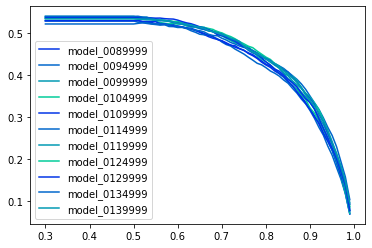

time: 24min 57s


In [22]:
# about 7 minutes each model (might be different depending on hardware configuration)
the_max_iters = [89999, 94999, 99999, 104999, 109999, 114999, 119999, 124999, 129999, 134999, 139999] # these are the latest checkpoints while training
the_model_names = [f"model_{str(iters).zfill(7)}" for iters in the_max_iters]
model_bests, threshold_bests, f1_bests = evaluate_models(cfg, eval_dicts, the_model_names)

# The best moodel info

In [23]:
print(f'The  best model is {the_model_names[np.argmax(model_bests)]}')
print(f'Its  score  threshold is {threshold_bests[np.argmax(model_bests)]}')
print(f'Its best f1 score is {max(model_bests)}')

The  best model is model_0134999
Its  score  threshold is 0.5100000000000002
Its best f1 score is 0.5398308856252781
time: 1.76 ms


# Use the best model to produce outputs

In [24]:
import numpy as np

from processing_utils import submissions_for_outputs

time: 658 µs


In [25]:
the_best_model = the_model_names[np.argmax(model_bests)]
the_model_name =  the_best_model
the_best_score_threshold = threshold_bests[np.argmax(model_bests)]
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"{the_model_name}.pth")

time: 1.17 ms


In [26]:
the_best_model

'model_0134999'

time: 2.98 ms


In [27]:
the_model_name

'model_0134999'

time: 2.46 ms


In [28]:
the_best_score_threshold

0.5100000000000002

time: 2.98 ms


### test1

In [29]:
# about 7 minutes (might be different depending on hardware configuration)
test1_output_items = predict(test1_dicts, cfg)

Done inferences in 4.295949451128641 minutes at 2020-11-19 15:03:21.829302
time: 4min 17s


In [30]:
file_name = f'test1'
test1_output_lines = submissions_for_outputs(file_name, test1_dicts, test1_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test1_0.5100000000000002_20201119_150322.txt at 2020-11-19 15:03:22.424610
time: 593 ms


### test2

In [31]:
# about 7 minutes (might be different depending on hardware configuration)
test2_output_items = predict(test2_dicts, cfg)

Done inferences in 4.380321594079335 minutes at 2020-11-19 15:07:45.254043
time: 4min 22s


In [32]:
file_name = f'test2'
test2_output_lines = submissions_for_outputs(file_name, test2_dicts, test2_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test2_0.5100000000000002_20201119_150745.txt at 2020-11-19 15:07:45.852154
time: 594 ms


# Visualizations
Visualize 10 images from each test dataset

In [33]:
# force reloading
import vis_utils
import importlib
importlib.reload(vis_utils)
from vis_utils import visualize_sample_outputs

time: 2.9 ms


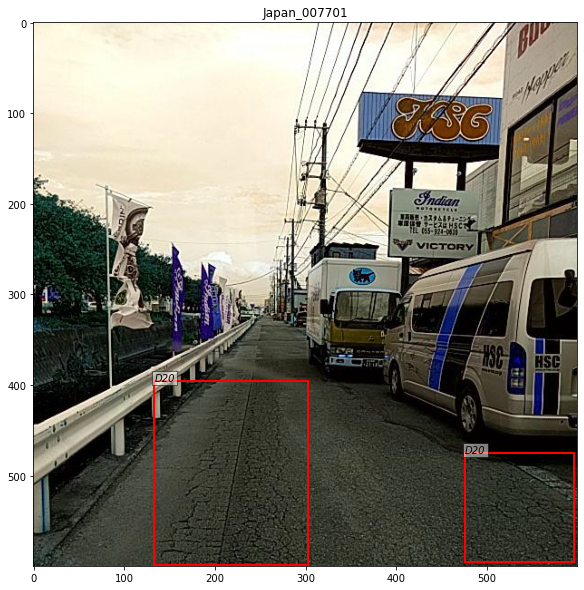

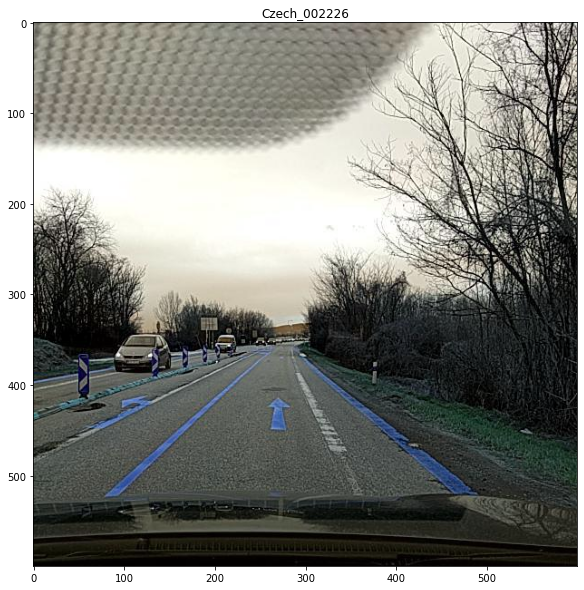

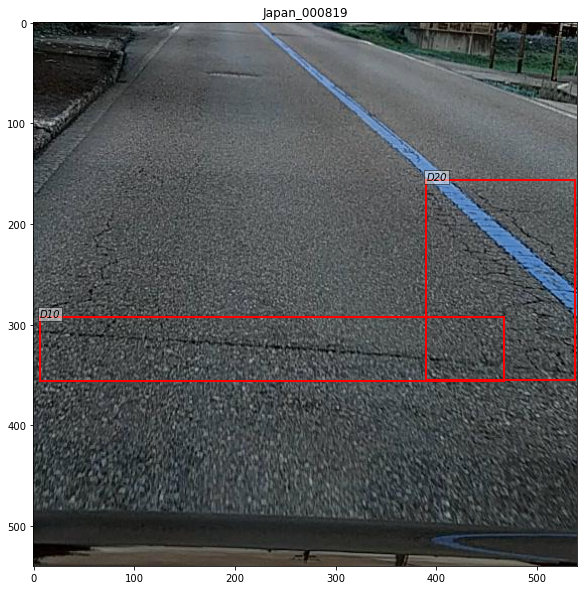

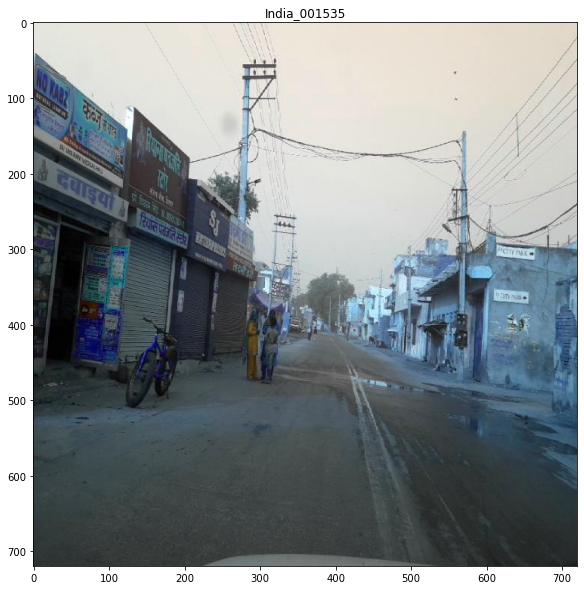

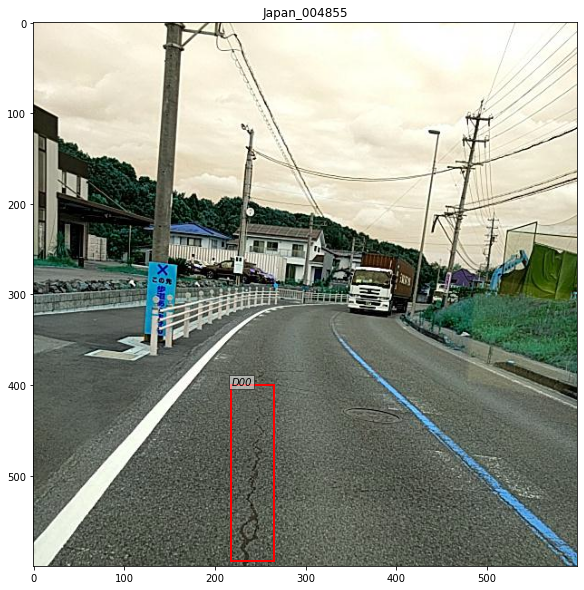

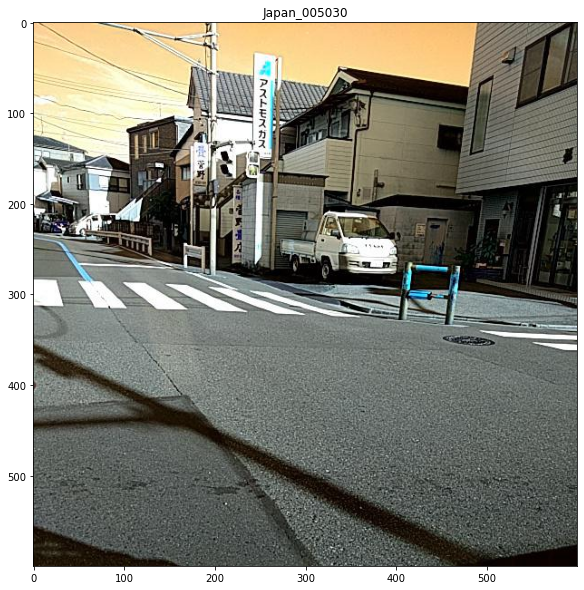

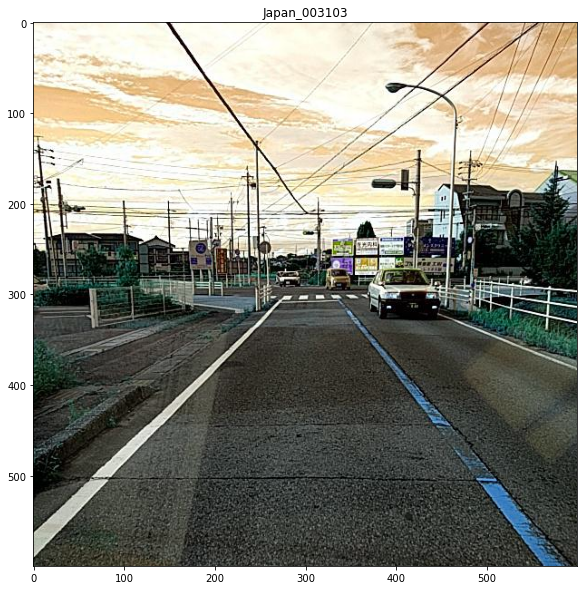

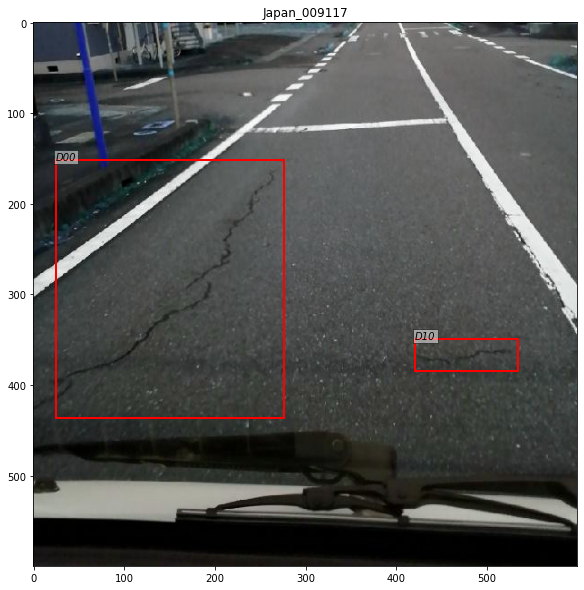

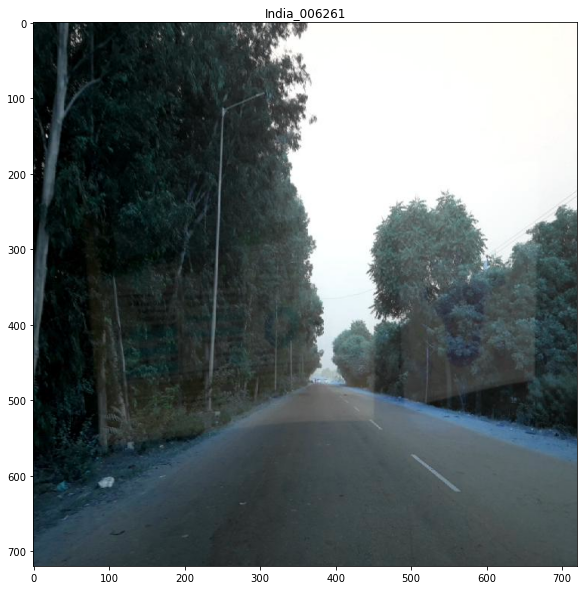

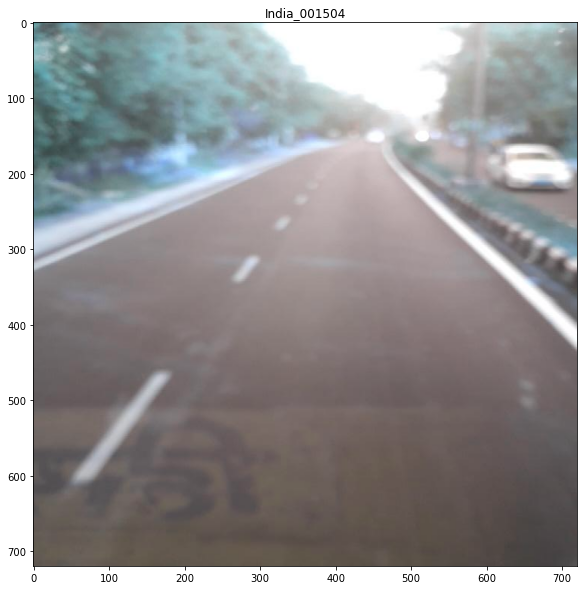

time: 2.46 s


In [34]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)

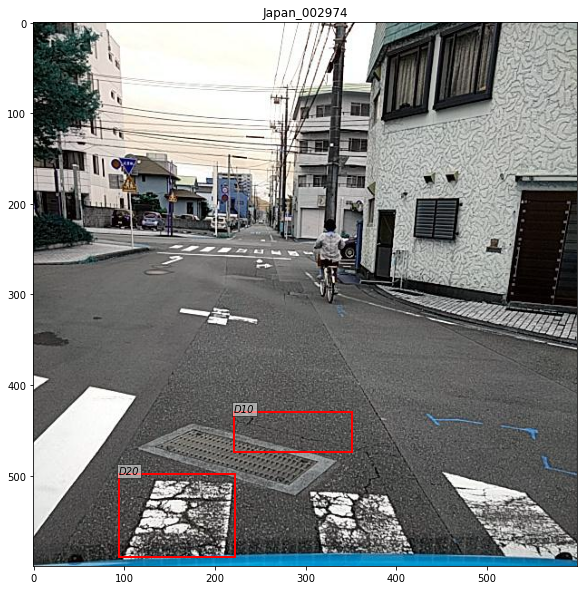

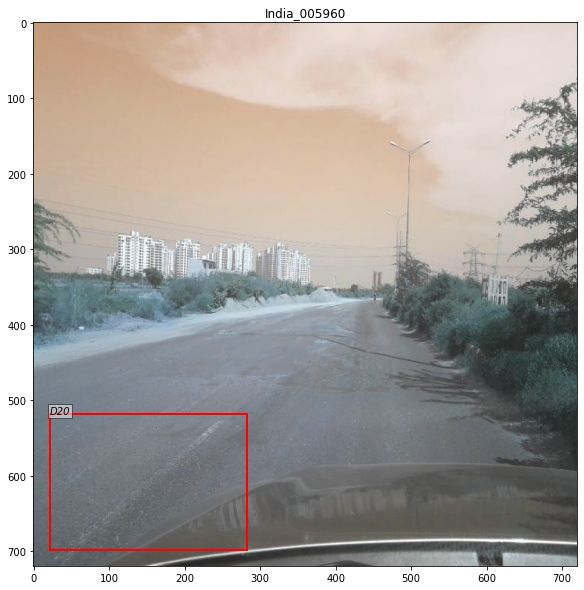

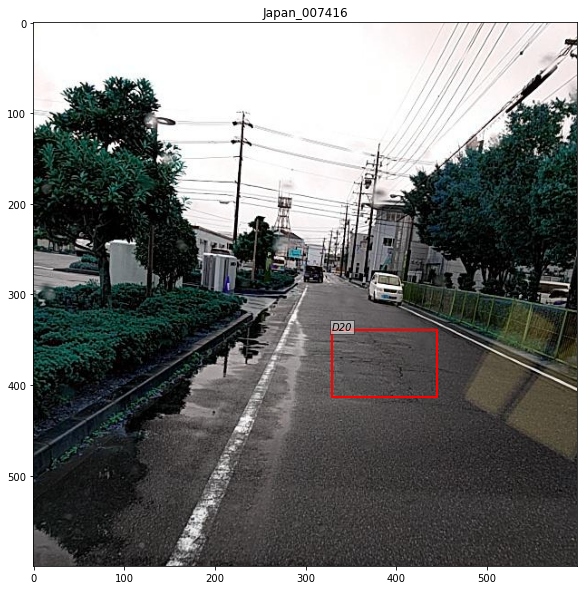

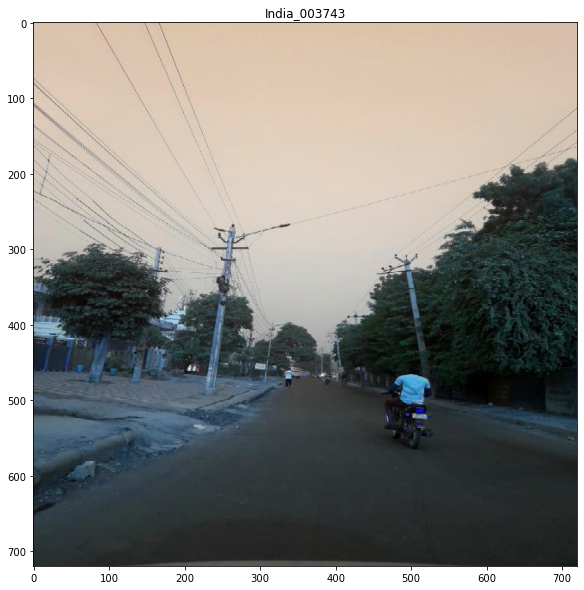

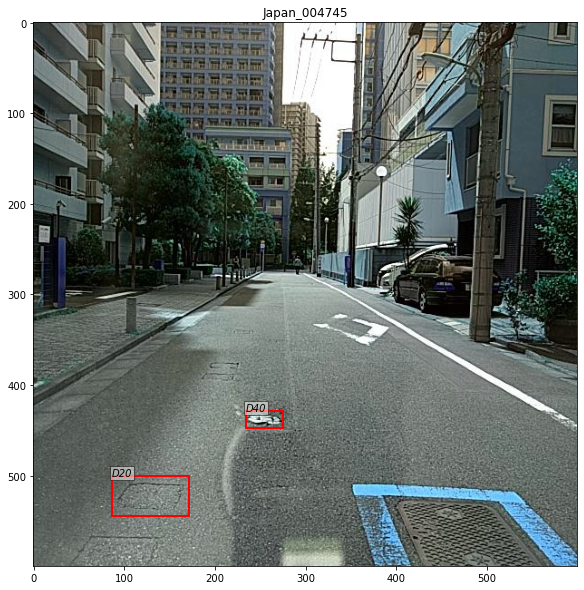

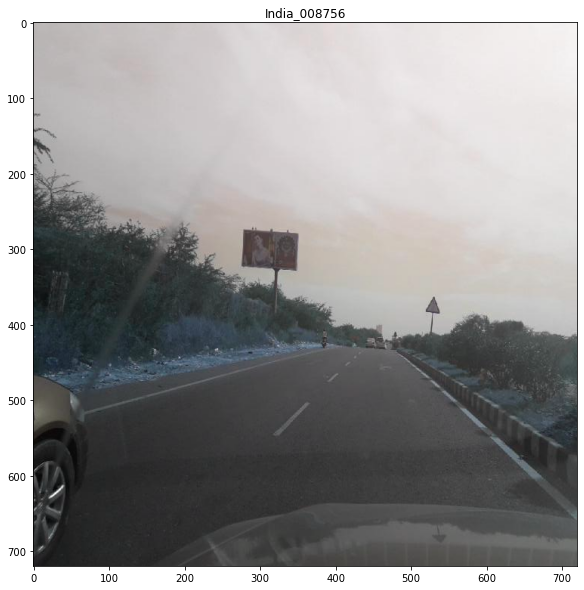

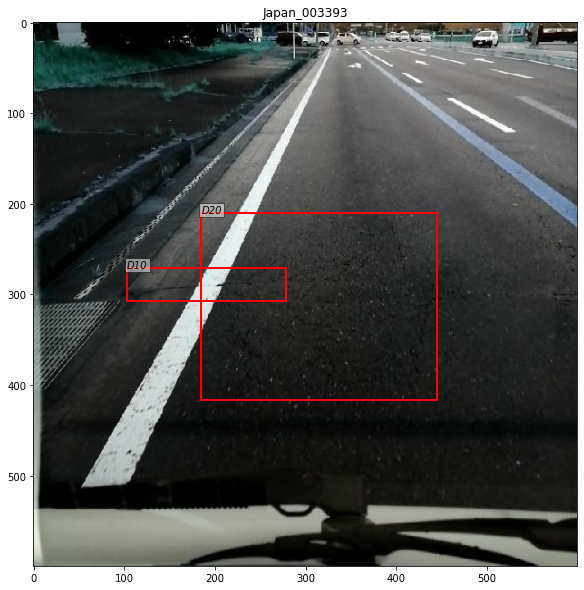

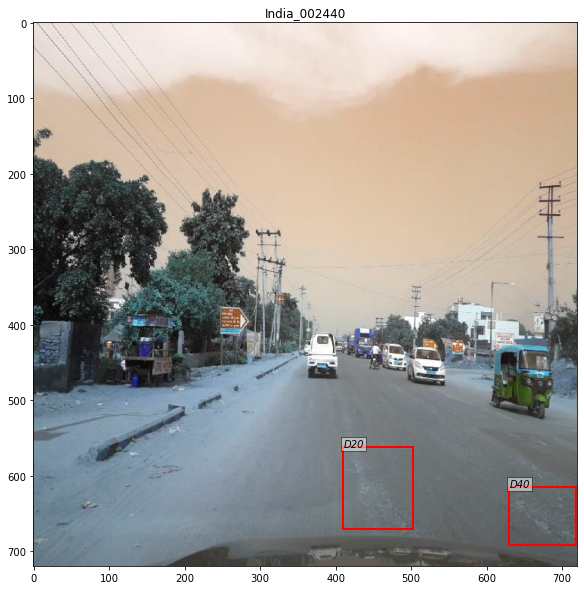

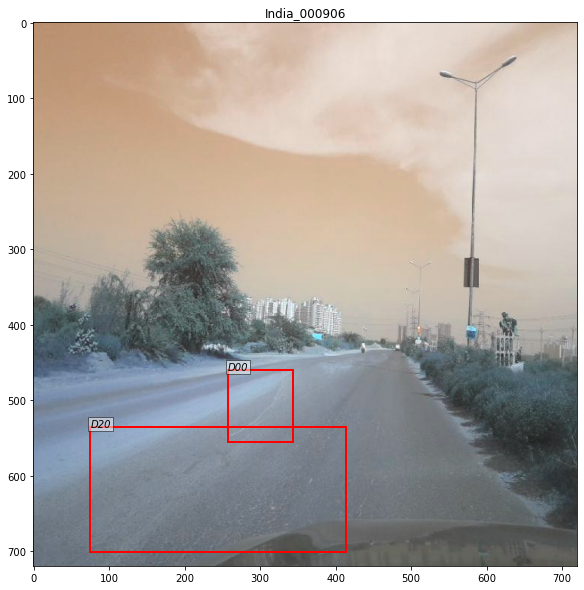

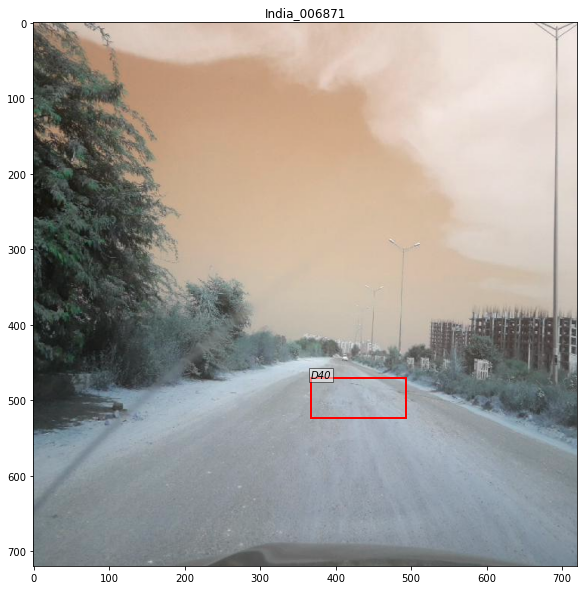

time: 2.45 s


In [35]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)